## SNU PPSML - Machine Learning Exercise 2

#### **Contents**
---
* ML exercise 1: Gradient Descent [Optimization @ ML] (HW05)  

---
* **ML exercise 2: Neural Network [Representation @ ML] (실습과제 11/5-8 & 11/9 강의)**
    - 입력 속성데이터와 지도라벨값 $\{(x_i, y_i)\}$ @ 인코딩: 입력과 출력층의 설정  

    - 순전파 신경망(def feedforward())의 구성을 위한 여러가지 파라메터들     
        - $N_{layers}$ & $N_{nodes}$ in each layer
        - 가중치와 편향치 ($W$ & $B$)
        - 가중합(퍼셉트론 입력) : 
        
        > $a_j=W_{ji} f_i(a_i)+B_j$ (전층의 출력 $f_i$에 대한 가중합)
        
        - 활성화 함수(출력) : $f_j(a_j)$
        
        > $f(a)=\frac{1}{1+\exp^{-a}}$ for sigmoid  
        
        > $f(a)=\tanh(a)$ for tanh  
        
        > $f(a_k)=\frac{\exp[a_k]}{\sum_{k'}\exp[a_{k'}]}$ for softmax  
        
        > $f(a)=a$ for $ a > 0$ otherwise $0$ (ReLU)
        
        - 데이터의 순전파를 통한 최종 출력값 얻기: def feedforward(input)
        - ...
        
    - 오차보정의 역전파:  
    
        - 지도라벨값의 인코딩과 오차함수($E(w;x)$)의 정의
        - $\delta_j$ (가중합 $a_j$에 대한 오차보정항 $\equiv\frac{\partial E}{\partial a_j}$)
        - $\delta_j$를 통한 가중치보정 역전파의 구현
        - ...
        
    - 많은 데이터에 대한 학습 알고리즘 구현
    - check a contour of MLP's probability output for classification of 2D data  
    
---   
* ML exercise 3: Training a NN for Regression & Classification [Evaluation, Rep, Opt @ ML] (HW06)
    - batch GD, mini-batch GD, stochastic GD  
        - Visualize the minimizers in 2D
    - Validation of model, Over-fitting, Bias & Variance  
        - Visualize an over-fitted status
    - Evaluation of model performance
        - error(loss), accuracy (...)
        - NN score & ROC(Receiver Operating Characteristic) curve


In [0]:
# Printing all outputs in a cell (not only the last output)
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

----
### ** 2. Neural Netowrk Representation for ML ** 

### For Supervised Learning (Classification)




---
#### ** 1) [이종분류(Binary Classification)]** 
   
   $x_1,\,x_2$ 2차원 평면에 **두 종류**의 데이터가 분포해있을때, 임의의 $(x_1,x_2)$위치의 테스트 데이터가 각각의 종에 속할 확률을 예측하는, 이종 분류 신경망을 건설하고 훈련시켜보자.

    - 훈련한 모형의 예측치를 matplotlib를 활용하여 시각화해보자.
    - 각 epoch마다 성능을 평가하여 학습곡선을 그려보자.
    - 여러가지 학습률값에 대하여 학습곡선의 차이를 시각화해보자
    

* 훈련 & 테스트 데이터의 로딩 그리고 시각화 
- [[훈련데이터 폴더]](https://drive.google.com/open?id=1nhuCjcgovMkyy08FhTlqw_GTSei1FNNI) 에서 다운받은 data폴더를 본 노트북 폴더안에 위치시킨다. 

In [1]:
import numpy as np
data_np_circles = np.load('data/2Classes_2d_circles.npy')
data_np_moons = np.load('data/2Classes_2d_moons.npy')
data_np_spirals = np.load('data/2Classes_2d_spirals.npy')


print (len(data_np_circles))
print (len(data_np_moons))
print (len(data_np_spirals))

10000
10000
20000


In [2]:
# Check your data
data = data_np_circles
print (data.shape) 
# 각행(/10000행): 하나의 데이터 (10000개의 행 = 총 10000개의 데이터) 
# 각열(/3열): 각 데이터 하나하나가 가진 속성들, {1열: 데이터의 종류/클래스(정수형 인코딩, 0:빨간공, 1:파란공, ...etc), 2열: 데이터속성변수(x)값, 3열: 데이터속성변수(y)값}]
print (data[:10])

(10000, 3)
[[ 1.          0.41716959 -0.0201462 ]
 [ 0.          0.32946142 -1.73946092]
 [ 0.          1.88161571 -0.2243498 ]
 [ 0.          0.79070108 -1.89036308]
 [ 1.          0.58905668  0.36197065]
 [ 1.         -0.08451147 -0.20675908]
 [ 0.         -1.79711338  1.03359891]
 [ 0.         -1.39358787  1.2707954 ]
 [ 0.         -1.96715585  1.43248868]
 [ 1.          0.40558484 -0.14764335]]


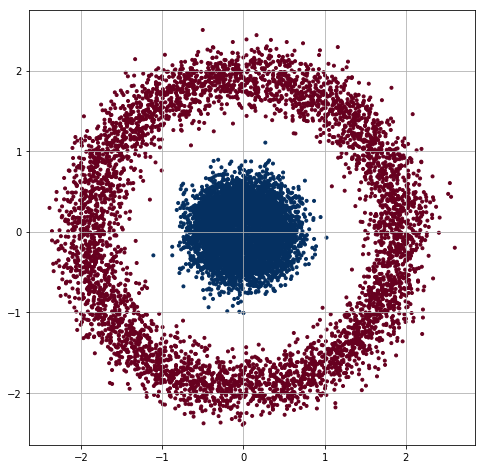

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from itertools import cycle, islice
%matplotlib inline

data = data_np_circles

fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(111)

cm = plt.cm.RdBu
cm_bright = ListedColormap(['#FF0000', '#0000FF'])
ax.scatter(data[:,1],data[:,2], c=data[:,0], cmap=cm, marker='.')

ax.grid(True)

plt.show()

* NNfactory 모듈의 로딩과 MLP 인스턴스의 선언 

In [4]:
# (모듈로서) NNfactory.py의 로딩
# autoreload 구문을 통해 
# NNfactory.py에의 최신 수정 사항이 재import시마다 반영되도록 한다. 
%reload_ext autoreload
%autoreload 2

# NNfactory.py 참조 
import NNfactory

In [5]:
# 완전연결순방향앞먹임 신경망 (fully connected feed-forward neural network, MLP) 구조의 설정
model_str = '2:identity|'+2*'10:tanh|'+'2:softmax'
# 학습률
lr = 0.01
# 모델이름
name_tag = 'circle_lr'+str(lr)

In [6]:
# mynn이라는 이름의 신경망(MLP) 클래스 인스턴스를 선언.
mynn = NNfactory.MLP(model_structure=model_str, \
                     model_nametag=name_tag, \
                     learning_rate=lr, \
                     encoding='one-hot')


 * 다음과 같은 구조의 다층퍼셉트론 연결이 초기화 되었습니다 *

 > 모델이름 = circle_lr0.01
 > 총 층수 (입력 + 은닉(s) + 출력) =  4
 > 각 층에서의 노드수 =  [2, 10, 10, 2]
 > 각 층에서의 활성화 함수 =  ['identity', 'tanh', 'tanh', 'softmax']
 > 학습률(Learning Rate) =  0.01
 > 지도라벨 인코딩 방식 =  one-hot


* 로드한 데이터(2차원 속성변수공간에 분포한 2종의 데이터)들을 분류해내는 확률모형을, 갓 빚어낸 mynn신경망에 학습시켜보자.

In [7]:
from time import sleep
import sys
import numpy as np

# 데이터 준비
data_type=None # = 'mnist' for MNIST-data, or None for others 
encoding='one-hot' #'integer' # 'float'
training_data_list = data_np_circles # 학습에 쓸 데이터

n_class = int(training_data_list[:,0].max()+1) # 분류모형에서의 클래스 갯수 추출
dim_x = len(training_data_list[0])-1 # 데이터의 속성변수(x)의 차원 추출
print(' * n_class = ',n_class)
print(' * dim_x = ',dim_x)

 * n_class =  2
 * dim_x =  2


In [8]:
# 최대 학습 주기 설정
epochs = 100

n_data_tot=len(training_data_list)
n_data_max=5000  # 훈련에 사용할 데이터 갯수
n_data_test=min(int((n_data_tot-n_data_max)*0.5),int(n_data_max*0.5))
n_data = len(training_data_list[:n_data_max])
dn_data = int(n_data/20)
print (dn_data)

for e in range(epochs):
    # go through all data in the training data set
    print(' * epoch = {}'.format(e+1))
    id_data = 0
    
    for data in training_data_list[:n_data_max]:
        
        # 프로세스 게이지
        id_data += 1
        if (id_data%dn_data==0):
            sys.stdout.write('\r')
            sys.stdout.write(' [%-20s] %d%%' % ( '='*(id_data//dn_data), 5*(id_data//dn_data)))
            sys.stdout.flush()
            sleep(0.25)
        
        # 입력/지도 데이터 가공 
        if data_type == 'mnist':
            # split the mnist data by the ',' commas
            all_values = data.split(',')
            # 입력 데이터 스케일링 
            input_list = (np.asfarray(all_values[1:]) / 255.0 * 0.99) + 0.01
            # 지도 라벨 벡터 가공 (shape = (10,))
            target_list = np.zeros(10) #mynn.n_nodes[-1])
            # all_values[0] is the target label for this data
            target_list[int(all_values[0])] = 1.0
            
        else:
        
            input_list = data[1:] #np.asfarray(all_values[1:])
            print(input_list)
            target_origin = data[0]
            
            if encoding == 'one-hot':

                target_list = np.zeros(mynn.n_nodes[-1])
                target_list[int(data[0])] = 1
    
            elif encoding == 'integer':
                
                target_list = np.zeros(1)
                target_list[0] = int(data[0])

            elif encoding == 'float':
                
                target_list = np.zeros(1)
                target_list[0] = data[0]
                
            else:
                raise ValueError(' => check your encoding scheme. ')

        
        mynn.train(input_list, target_list)

        
        pass
    
    print('')
    print(' > 훈련 샘플에 대한 성능 (정확도 & 평균에러) ')
    mynn.check_accuracy_error(training_data_list, 0, n_data_max, data_type=None)
    print('')
    print(' > 테스트 샘플에 대한 성능 (정확도 & 평균에러) ')
    mynn.check_accuracy_error(training_data_list, n_data_max, n_data_max + n_data_test, data_type=None)
        
    print('\n')
    
    pass

250
 * epoch = 1
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.49990938  0.74012173]
[-0.43766428 -0.11437926]
[0.20294903 0.20371244]
[-0.24101286  0.17993983]
[-1.238736   1.4897787]
[ 0.09210507 -0.47451626]
[0.3170608  0.47564911]
[-0.27270625  0.29966588]
[-0.09270205  0.28013858]
[1.14552819 1.38137882]
[-0.60871508  0.22768749]
[-0.44349839  1.5654516 ]
[0.26834218 0.1

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

[0.50336309 0.40560783]
[ 0.42602591 -0.03752172]
[0.30349842 0.71746866]
[1.26036495 1.42960629]
[-0.05914743  2.02136033]
[-0.19284051 -0.26862972]
[-1.03668258  1.83685034]
[0.25937069 0.34236132]
[-0.25387871  0.54996808]
[-0.22518468  0.29598678]
[-0.47061113  0.07554378]
[ 0.45084655 -0.09443886]
[-0.2040832  -2.09432919]
[0.37927579 0.0787684 ]
[1.38419582 1.68731902]
[0.14513148 0.29303591]
[1.85061791 0.28637829]
[1.26879679 0.97106097]
[1.72537186 0.71516604]
[-0.16538301  0.24198573]
[-0.38398679 -0.10709992]
[ 1.72060548 -0.73867978]
[-0.09246596 -0.2367638 ]
[ 0.28416976 -0.10056595]
[1.46149063 1.26921587]
[ 1.86092593 -0.08267324]
 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.779

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9962007598480304  | (정답수)/(테스트 데이터수) =  4982 / 5001
 * 현재 평균에러 =  0.05297489742297387

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9948020791683326  | (정답수)/(테스트 데이터수) =  2488 / 2501
 * 현재 평균에러 =  0.05256080819738833


 * epoch = 2
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

[-0.09246596 -0.2367638 ]
[ 0.28416976 -0.10056595]
[1.46149063 1.26921587]
[ 1.86092593 -0.08267324]
 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9984003199360127  | (정답수)/(테스트 데이터수) =  4993 / 5001
 * 현재 평균에러 =  0.017436286921717052

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9984006397441023  | (정답수)/(테스트 데이터수) =  2497 / 2501
 * 현재 평균에러 =  0.017333562376792514


 * epoch = 3
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.347392

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9992001599680064  | (정답수)/(테스트 데이터수) =  4997 / 5001
 * 현재 평균에러 =  0.008794543170296012

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9988004798080767  | (정답수)/(테스트 데이터수) =  2498 / 2501
 * 현재 평균에러 =  0.008838485877774796


 * epoch = 4
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.347392

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996000799840032  | (정답수)/(테스트 데이터수) =  4999 / 5001
 * 현재 평균에러 =  0.005487697526835302

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9992003198720512  | (정답수)/(테스트 데이터수) =  2499 / 2501
 * 현재 평균에러 =  0.005597674389661816


 * epoch = 5
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.347392

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996000799840032  | (정답수)/(테스트 데이터수) =  4999 / 5001
 * 현재 평균에러 =  0.0038534437955458096

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9992003198720512  | (정답수)/(테스트 데이터수) =  2499 / 2501
 * 현재 평균에러 =  0.003996447114497277


 * epoch = 6
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9998000399920016  | (정답수)/(테스트 데이터수) =  5000 / 5001
 * 현재 평균에러 =  0.0029100142234132977

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.00306998472273567


 * epoch = 7
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.347392

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.002307394977710163

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.002475705349113126


 * epoch = 8
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.4999093

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

[-1.07578644 -1.40427857]
[1.92912639 0.78493544]
[-2.05157923 -0.4786467 ]
[-0.05416087  0.1511662 ]
[-1.31432744 -1.65442549]
[ 1.90066076 -0.53339199]
[-0.01355651 -0.51034922]
[ 0.2163097  -0.54405211]
[-1.04007838 -1.78007982]
[0.7288297  1.68067788]
[-0.58975156  0.04296931]
[-1.42065008 -0.77336415]
[-0.39068113  0.14878941]
[0.37398538 0.28733322]
[-0.48981015  0.0395207 ]
[0.19005172 0.51793863]
[0.04504618 0.47740913]
[-0.14527115 -0.12187875]
[ 1.35826146 -1.34035059]
[-0.02302385 -1.65785984]
[-0.32532166  0.27205686]
[-1.47465154 -0.8287973 ]
[ 0.56384389 -1.90270244]
[-1.34415201  1.07497327]
[-1.26775305  0.67957292]
[0.45978364 0.30366816]
[-1.95427321  0.6151868 ]
[-0.25098178 -2.16214388]
[1.24052052 1.45065312]
[-1.73859066  0.05967469]
 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.0018946512630829246

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.0015973066632402647

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.001770004220190667


 * epoch = 10
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.49990

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.0013747582498302934

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.0015468515026377267


 * epoch = 11
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.4999

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.0012031215054873548

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.0013738806729411425


 * epoch = 12
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.4999

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.001067490475440508

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.0012366177683710514


 * epoch = 13
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.49990

[-0.24830181  0.4430746 ]
[1.63351709 0.07755865]
[ 0.39992943 -0.14628883]
[1.88599597 0.51295468]
[0.25432216 0.24303534]
[0.03046934 0.32208468]
[-0.20649634 -0.53750032]
[-0.29129102 -0.40987082]
[2.02311663 0.8774223 ]
[-1.82970417 -0.54267779]
 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.221

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

[ 0.29951956 -0.01971663]
[-0.36576946 -0.35006261]
[-0.37370298  0.40784939]
[-0.11456415 -0.03425427]
[ 0.27097991 -0.7734829 ]
[ 0.02006177 -0.75521005]
[-0.28200427 -0.34276623]
[-0.13650352  0.31439411]
[1.23230331 1.26296735]
[-1.84023701  0.13873852]
[ 0.52804604 -1.55866848]
 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.9435828

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

[0.47368343 0.0972688 ]
[ 1.82909824 -0.63318366]
[0.11391109 0.45578759]
[0.31210249 0.34600146]
[-0.22616826 -1.88166163]
[-1.51309972  1.53433211]
[-0.24516479  1.92786804]
[-1.61887731  1.33736959]
[-1.95638714  0.69994784]
[ 0.38470883 -0.03996302]
[-0.46964699  1.91935754]
[1.42057099 1.69888557]
[-1.90116677 -0.14938017]
[ 0.07381269 -0.26063842]
[1.66506684 0.70532707]
[1.32055696 1.31691808]
[0.23326894 0.48919074]
[-1.89123274  0.49475428]
[-0.38433364  0.23901669]
[ 0.11297412 -0.44443066]
[-1.28974115 -1.69657797]
[-1.43462379 -1.49364584]
[-0.16114387  0.07851493]
[0.22148804 0.00451198]
[-0.45387453 -0.50113848]
[ 0.17816549 -0.27974589]
[-0.99485377  1.65735121]
[0.33307801 0.44527674]
[-1.56782623  0.83613043]
[ 1.52517009 -0.55697857]
[ 1.77837087 -0.3908314 ]
[1.9977103  0.63904388]
[-0.242855    0.40709145]
[1.54611138 0.96055888]
[-0.32522189  0.1549303 ]
[ 0.33772969 -0.04012316]
[-0.39247791  0.09274155]
[-0.54636625 -0.0150344 ]
[0.55914785 2.13232344]
[0.0425279

[-0.4918501   0.11363978]
[ 0.54253847 -0.09927617]
[-0.21763328  0.56705881]
[ 0.1118338  -0.34885195]
[ 0.11797718 -0.29513743]
[-0.27209596 -0.08621513]
[-0.33885443 -0.28344767]
[ 0.61816687 -0.03705569]
[-0.25259884 -1.71718965]
[ 0.14215072 -1.55229502]
[-0.37666685  0.73357601]
[-1.06808335 -1.5925241 ]
[0.09064287 0.16134939]
[-0.64457719 -2.14266819]
[ 0.18941935 -0.49104096]
[ 1.92751283 -0.74012831]
[-0.35366471 -0.45731559]
[-0.14667507  0.00061488]
[-1.20174071  1.40051173]
[-0.67524649  1.70512845]
[0.10689064 0.11965182]
[-2.08001047  1.10308632]
[0.41441484 0.0497625 ]
[1.90506798 0.44482715]
[1.90150319 1.16260078]
[-0.99381662  1.76987634]
[-0.02194969  0.42475219]
[ 0.35021275 -0.58658771]
[-0.23209042 -0.28675427]
[ 0.15853256 -0.38063807]
[ 0.01421318 -0.33089179]
[-0.58929214 -0.01267107]
[-0.30980732  0.4526829 ]
 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.0009581176051134606

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.0011255686277037492


 * epoch = 14
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.4999

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.000868384963240566

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.0010342586520355032


 * epoch = 15
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.49990

[-1.82970417 -0.54267779]
 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.0007936594915248419

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.0009581301661094102


 * epoch = 16
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.4999

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

[1.26879679 0.97106097]
[1.72537186 0.71516604]
[-0.16538301  0.24198573]
[-0.38398679 -0.10709992]
[ 1.72060548 -0.73867978]
[-0.09246596 -0.2367638 ]
[ 0.28416976 -0.10056595]
[1.46149063 1.26921587]
[ 1.86092593 -0.08267324]
 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.0007306136604851846

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.0008938894739225478


 * epoch = 17
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.4999

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

[0.4630868  0.21801144]
[-0.21208252 -0.26596132]
[0.37085837 1.86882087]
[0.68651829 1.47513508]
[1.60606863 1.38497658]
[0.13757571 0.10457448]
[ 0.71237292 -0.03543663]
[0.51412304 2.05992245]
[-0.23084243  0.22402051]
[ 0.26757383 -0.43981471]
[-0.33083324 -0.19742243]
[-0.18197919  1.83391686]
[-0.46392837 -0.22831615]
[ 0.87428017 -1.86412214]
[ 1.71147377 -0.77171061]
[0.81162854 1.85189904]
[ 0.13637098 -1.99651278]
[1.81806402 0.5756024 ]
[0.47549533 1.88463629]
[1.37040421 1.32830685]
[ 1.22746712 -1.91553099]
[-1.95119598 -0.11205723]
[-0.83158003  1.53977514]
[-0.01522528  0.32003041]
[ 1.23174532 -1.23476758]
[-0.91483738  1.63974625]
[ 0.34760817 -0.26728793]
[0.44251443 0.15168705]
[0.26692909 0.5840874 ]
[ 0.38403178 -0.03413944]
[-0.20472751 -0.44750828]
[-0.13477578  0.37068916]
[-0.42132755  0.65587618]
[1.40647569 1.54440676]
[-1.21630202 -1.74865528]
[-0.1640138  -2.09859179]
[-1.54219349  0.49930331]
[ 0.2298057  -1.75742297]
[-1.51186366  1.7526024 ]
[-0.3225462 

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.000676805010951329

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.0008391030633507599


 * epoch = 18
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.49990

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.0006304066141905623

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.0007919385624687674


 * epoch = 19
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.4999

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.0005900290853468952

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.0007509933111739806


 * epoch = 20
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.4999

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.0005546000481472621

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.000715177868746035


 * epoch = 21
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.49990

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.0005232807072110168

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.0006836350288504856


 * epoch = 22
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.4999

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.0004954069908240319

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.0006556823938267355


 * epoch = 23
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.4999

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

[0.016104   0.24554869]
[ 0.39160147 -1.98132464]
[2.05792905 0.25520169]
[-0.64669569 -0.43497077]
[-1.95010022  0.47829228]
 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.0004704473181589688

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.0006307709402228644


 * epoch = 24
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.4999

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.0004479718306482959

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.000608454656835136


 * epoch = 25
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.49990

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.0004276296640979455

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.0005883679854279286


 * epoch = 26
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.4999

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.00040913194714675943

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.0005702088468091621


 * epoch = 27
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.499

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.00039223893480702546

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.0005537257218745387


 * epoch = 28
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.499

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.00037675016621302384

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.0005387077145300616


 * epoch = 29
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.499

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

[-1.08584268  1.30058639]
[0.30703785 0.0229257 ]
[-1.96751969 -0.03908468]
[1.04314791 1.58042769]
[ 0.24289942 -0.0353947 ]
[0.26384858 2.02362829]
[0.14072777 0.17942478]
[-0.35265927 -0.40759222]
[ 0.25712282 -0.45099953]
[-0.17007202  0.11111802]
 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.00036249686022759333

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.0005249768332411299


 * epoch = 30
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.499

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.000349335985133601

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.0005123819412416133


 * epoch = 31
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.49990

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.0003371455934223583

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.0005007939743783477


 * epoch = 32
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.4999

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

[ 1.23174532 -1.23476758]
[-0.91483738  1.63974625]
[ 0.34760817 -0.26728793]
[0.44251443 0.15168705]
[0.26692909 0.5840874 ]
[ 0.38403178 -0.03413944]
[-0.20472751 -0.44750828]
[-0.13477578  0.37068916]
[-0.42132755  0.65587618]
[1.40647569 1.54440676]
[-1.21630202 -1.74865528]
[-0.1640138  -2.09859179]
[-1.54219349  0.49930331]
[ 0.2298057  -1.75742297]
[-1.51186366  1.7526024 ]
[-0.3225462   0.33869912]
[ 1.39621723 -1.24469371]
[ 0.02035617 -0.24636491]
[1.52902238 1.25633933]
[-0.30875898  0.08532474]
[-0.44462005  0.31768162]
[-0.81771718  1.68751729]
[-0.16774925 -0.1594669 ]
[0.22770978 0.1666334 ]
[-0.15885057 -1.90653121]
[ 1.40472148 -1.25897379]
[0.49087869 0.01743696]
[-1.46324437 -1.04552919]
[ 0.09140547 -1.90480305]
[0.34523042 0.2858616 ]
[-0.99995554  1.47483932]
[-1.53044589 -1.02704928]
[-0.57223736 -0.07988295]
[-5.05435231e-04 -2.01230481e+00]
[ 1.91430301 -0.56498312]
 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.0003258211217122498

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.0004901021309471468


 * epoch = 33
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.4999

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

[ 0.5472528  -2.05009308]
[0.33455312 0.14640653]
[0.42968069 0.46739165]
[ 0.59315713 -2.1124732 ]
[0.09455676 2.11104649]
[ 0.12911032 -0.04557664]
[-0.11135272 -0.5677001 ]
[-0.21459495  0.31525926]
[1.90117006 0.75896638]
[-1.64725174 -1.87717696]
[ 1.34580121 -1.38314314]
[-1.07384361  1.82893766]
[-1.27843556 -1.30025094]
[1.80993067 0.83374699]
[-2.23661594  0.31429225]
[-0.34751006  1.9420748 ]
[-0.4204363  -1.67345454]
[1.78318859 0.23743658]
[-0.05874516  0.17346484]
[-1.7685592  -0.71761666]
 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.243

[ 1.28468663 -1.54169388]
[-1.01741355  1.60270287]
[-1.12588301 -1.60934485]
[-0.42105477  0.06983707]
[0.71029165 0.04910766]
[-0.15187397  0.32212604]
[ 0.91485733 -1.78016308]
[-0.12398542 -0.30956971]
[ 2.09737389 -0.12060069]
[0.15527676 0.28649125]
[-0.19304575  0.58992969]
[-1.81770621  0.18717608]
[-0.22487368  0.39472358]
[2.24576894 0.31123026]
[-0.72186136 -0.09733303]
[0.17439999 1.69062354]
[-0.4723521   0.50042363]
[-0.28651002 -0.12999968]
[-0.19395696 -0.35276192]
[-0.11522374 -2.05040149]
[-0.56812925 -1.78085136]
[2.01562289 0.10658852]
[-1.80847872  0.97063698]
[3.86782829e-01 3.16610182e-04]
[0.016104   0.24554869]
[ 0.39160147 -1.98132464]
[2.05792905 0.25520169]
[-0.64669569 -0.43497077]
[-1.95010022  0.47829228]
 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

[1.32055696 1.31691808]
[0.23326894 0.48919074]
[-1.89123274  0.49475428]
[-0.38433364  0.23901669]
[ 0.11297412 -0.44443066]
[-1.28974115 -1.69657797]
[-1.43462379 -1.49364584]
[-0.16114387  0.07851493]
[0.22148804 0.00451198]
[-0.45387453 -0.50113848]
[ 0.17816549 -0.27974589]
[-0.99485377  1.65735121]
[0.33307801 0.44527674]
[-1.56782623  0.83613043]
[ 1.52517009 -0.55697857]
[ 1.77837087 -0.3908314 ]
[1.9977103  0.63904388]
[-0.242855    0.40709145]
[1.54611138 0.96055888]
[-0.32522189  0.1549303 ]
[ 0.33772969 -0.04012316]
[-0.39247791  0.09274155]
[-0.54636625 -0.0150344 ]
[0.55914785 2.13232344]
[0.04252794 0.22858489]
[ 2.12424564 -0.01021757]
[0.13316394 0.66907197]
[0.44222153 1.49728333]
[-0.83058742  1.61408783]
[ 0.09602062 -1.74391106]
[-0.9199937  -1.83987498]
[ 1.70121113 -0.9044018 ]
[-1.99194085  1.0676643 ]
[-2.12761078 -0.49067784]
[-0.36954555  0.50905114]
[-1.99745714  0.44932168]
[-1.24022638 -1.48999135]
[-0.17033825  2.0653413 ]
[-0.03470651 -0.32062392]
 [====

[ 0.20049512 -0.36256609]
[-0.26113468 -0.1276251 ]
[-0.51553114 -1.43189354]
[-0.39187262 -0.16456324]
[-1.79359428 -1.08040667]
[-0.05561719 -0.02004512]
[ 1.56600955 -0.84184376]
[-0.4918501   0.11363978]
[ 0.54253847 -0.09927617]
[-0.21763328  0.56705881]
[ 0.1118338  -0.34885195]
[ 0.11797718 -0.29513743]
[-0.27209596 -0.08621513]
[-0.33885443 -0.28344767]
[ 0.61816687 -0.03705569]
[-0.25259884 -1.71718965]
[ 0.14215072 -1.55229502]
[-0.37666685  0.73357601]
[-1.06808335 -1.5925241 ]
[0.09064287 0.16134939]
[-0.64457719 -2.14266819]
[ 0.18941935 -0.49104096]
[ 1.92751283 -0.74012831]
[-0.35366471 -0.45731559]
[-0.14667507  0.00061488]
[-1.20174071  1.40051173]
[-0.67524649  1.70512845]
[0.10689064 0.11965182]
[-2.08001047  1.10308632]
[0.41441484 0.0497625 ]
[1.90506798 0.44482715]
[1.90150319 1.16260078]
[-0.99381662  1.76987634]
[-0.02194969  0.42475219]
[ 0.35021275 -0.58658771]
[-0.23209042 -0.28675427]
[ 0.15853256 -0.38063807]
[ 0.01421318 -0.33089179]
[-0.58929214 -0.012671

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

[-1.07578644 -1.40427857]
[1.92912639 0.78493544]
[-2.05157923 -0.4786467 ]
[-0.05416087  0.1511662 ]
[-1.31432744 -1.65442549]
[ 1.90066076 -0.53339199]
[-0.01355651 -0.51034922]
[ 0.2163097  -0.54405211]
[-1.04007838 -1.78007982]
[0.7288297  1.68067788]
[-0.58975156  0.04296931]
[-1.42065008 -0.77336415]
[-0.39068113  0.14878941]
[0.37398538 0.28733322]
[-0.48981015  0.0395207 ]
[0.19005172 0.51793863]
[0.04504618 0.47740913]
[-0.14527115 -0.12187875]
[ 1.35826146 -1.34035059]
[-0.02302385 -1.65785984]
[-0.32532166  0.27205686]
[-1.47465154 -0.8287973 ]
[ 0.56384389 -1.90270244]
[-1.34415201  1.07497327]
[-1.26775305  0.67957292]
[0.45978364 0.30366816]
[-1.95427321  0.6151868 ]
[-0.25098178 -2.16214388]
[1.24052052 1.45065312]
[-1.73859066  0.05967469]
 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.00031527243353005453

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.999600159

[0.14428012 0.12180345]
[-0.00305195  0.14297658]
[ 0.17130629 -0.38053613]
[0.83850139 1.64486145]
[1.09381105 1.51692994]
[ 0.08921097 -0.1106881 ]
[ 1.5013396  -0.78733222]
[ 0.83953599 -1.49564948]
[-0.24830181  0.4430746 ]
[1.63351709 0.07755865]
[ 0.39992943 -0.14628883]
[1.88599597 0.51295468]
[0.25432216 0.24303534]
[0.03046934 0.32208468]
[-0.20649634 -0.53750032]
[-0.29129102 -0.40987082]
[2.02311663 0.8774223 ]
[-1.82970417 -0.54267779]
 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.4726330

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

[-0.53355372  0.06809333]
[-0.16053587 -1.61610616]
[0.43900407 0.12349846]
[-0.4835151  -0.03906958]
[0.25126343 0.43273883]
[ 0.08723068 -0.27862649]
[1.80711021 0.05357166]
[-1.34296269 -0.96617924]
[ 1.85286079 -1.26928546]
[-0.61136741 -1.85132675]
[0.27406791 1.43115705]
[-0.10216668 -0.29395653]
[-0.57146956  0.00271454]
[-0.75620766  1.45369679]
[0.24643128 0.09269607]
[ 0.5472528  -2.05009308]
[0.33455312 0.14640653]
[0.42968069 0.46739165]
[ 0.59315713 -2.1124732 ]
[0.09455676 2.11104649]
[ 0.12911032 -0.04557664]
[-0.11135272 -0.5677001 ]
[-0.21459495  0.31525926]
[1.90117006 0.75896638]
[-1.64725174 -1.87717696]
[ 1.34580121 -1.38314314]
[-1.07384361  1.82893766]
[-1.27843556 -1.30025094]
[1.80993067 0.83374699]
[-2.23661594  0.31429225]
[-0.34751006  1.9420748 ]
[-0.4204363  -1.67345454]
[1.78318859 0.23743658]
[-0.05874516  0.17346484]
[-1.7685592  -0.71761666]
 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.575521

[1.85723423 0.94299283]
[ 0.10231215 -0.34510627]
[ 2.25920046 -0.05221976]
[-0.13702374 -0.2006811 ]
[ 1.80319741 -0.94271467]
[ 1.28468663 -1.54169388]
[-1.01741355  1.60270287]
[-1.12588301 -1.60934485]
[-0.42105477  0.06983707]
[0.71029165 0.04910766]
[-0.15187397  0.32212604]
[ 0.91485733 -1.78016308]
[-0.12398542 -0.30956971]
[ 2.09737389 -0.12060069]
[0.15527676 0.28649125]
[-0.19304575  0.58992969]
[-1.81770621  0.18717608]
[-0.22487368  0.39472358]
[2.24576894 0.31123026]
[-0.72186136 -0.09733303]
[0.17439999 1.69062354]
[-0.4723521   0.50042363]
[-0.28651002 -0.12999968]
[-0.19395696 -0.35276192]
[-0.11522374 -2.05040149]
[-0.56812925 -1.78085136]
[2.01562289 0.10658852]
[-1.80847872  0.97063698]
[3.86782829e-01 3.16610182e-04]
[0.016104   0.24554869]
[ 0.39160147 -1.98132464]
[2.05792905 0.25520169]
[-0.64669569 -0.43497077]
[-1.95010022  0.47829228]
 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.14994

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

[1.04314791 1.58042769]
[ 0.24289942 -0.0353947 ]
[0.26384858 2.02362829]
[0.14072777 0.17942478]
[-0.35265927 -0.40759222]
[ 0.25712282 -0.45099953]
[-0.17007202  0.11111802]
 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216

[0.22148804 0.00451198]
[-0.45387453 -0.50113848]
[ 0.17816549 -0.27974589]
[-0.99485377  1.65735121]
[0.33307801 0.44527674]
[-1.56782623  0.83613043]
[ 1.52517009 -0.55697857]
[ 1.77837087 -0.3908314 ]
[1.9977103  0.63904388]
[-0.242855    0.40709145]
[1.54611138 0.96055888]
[-0.32522189  0.1549303 ]
[ 0.33772969 -0.04012316]
[-0.39247791  0.09274155]
[-0.54636625 -0.0150344 ]
[0.55914785 2.13232344]
[0.04252794 0.22858489]
[ 2.12424564 -0.01021757]
[0.13316394 0.66907197]
[0.44222153 1.49728333]
[-0.83058742  1.61408783]
[ 0.09602062 -1.74391106]
[-0.9199937  -1.83987498]
[ 1.70121113 -0.9044018 ]
[-1.99194085  1.0676643 ]
[-2.12761078 -0.49067784]
[-0.36954555  0.50905114]
[-1.99745714  0.44932168]
[-1.24022638 -1.48999135]
[-0.17033825  2.0653413 ]
[-0.03470651 -0.32062392]
 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[

[ 0.11797718 -0.29513743]
[-0.27209596 -0.08621513]
[-0.33885443 -0.28344767]
[ 0.61816687 -0.03705569]
[-0.25259884 -1.71718965]
[ 0.14215072 -1.55229502]
[-0.37666685  0.73357601]
[-1.06808335 -1.5925241 ]
[0.09064287 0.16134939]
[-0.64457719 -2.14266819]
[ 0.18941935 -0.49104096]
[ 1.92751283 -0.74012831]
[-0.35366471 -0.45731559]
[-0.14667507  0.00061488]
[-1.20174071  1.40051173]
[-0.67524649  1.70512845]
[0.10689064 0.11965182]
[-2.08001047  1.10308632]
[0.41441484 0.0497625 ]
[1.90506798 0.44482715]
[1.90150319 1.16260078]
[-0.99381662  1.76987634]
[-0.02194969  0.42475219]
[ 0.35021275 -0.58658771]
[-0.23209042 -0.28675427]
[ 0.15853256 -0.38063807]
[ 0.01421318 -0.33089179]
[-0.58929214 -0.01267107]
[-0.30980732  0.4526829 ]
 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0

[-0.02164492  0.29837849]
[1.70322076 0.75444263]
[-0.07370019 -0.27252065]
[0.50336309 0.40560783]
[ 0.42602591 -0.03752172]
[0.30349842 0.71746866]
[1.26036495 1.42960629]
[-0.05914743  2.02136033]
[-0.19284051 -0.26862972]
[-1.03668258  1.83685034]
[0.25937069 0.34236132]
[-0.25387871  0.54996808]
[-0.22518468  0.29598678]
[-0.47061113  0.07554378]
[ 0.45084655 -0.09443886]
[-0.2040832  -2.09432919]
[0.37927579 0.0787684 ]
[1.38419582 1.68731902]
[0.14513148 0.29303591]
[1.85061791 0.28637829]
[1.26879679 0.97106097]
[1.72537186 0.71516604]
[-0.16538301  0.24198573]
[-0.38398679 -0.10709992]
[ 1.72060548 -0.73867978]
[-0.09246596 -0.2367638 ]
[ 0.28416976 -0.10056595]
[1.46149063 1.26921587]
[ 1.86092593 -0.08267324]
 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.6

[-1.04007838 -1.78007982]
[0.7288297  1.68067788]
[-0.58975156  0.04296931]
[-1.42065008 -0.77336415]
[-0.39068113  0.14878941]
[0.37398538 0.28733322]
[-0.48981015  0.0395207 ]
[0.19005172 0.51793863]
[0.04504618 0.47740913]
[-0.14527115 -0.12187875]
[ 1.35826146 -1.34035059]
[-0.02302385 -1.65785984]
[-0.32532166  0.27205686]
[-1.47465154 -0.8287973 ]
[ 0.56384389 -1.90270244]
[-1.34415201  1.07497327]
[-1.26775305  0.67957292]
[0.45978364 0.30366816]
[-1.95427321  0.6151868 ]
[-0.25098178 -2.16214388]
[1.24052052 1.45065312]
[-1.73859066  0.05967469]
 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.00030542143867492777

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.00047103715593711294


 * epoch = 35
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.589

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

[0.51412304 2.05992245]
[-0.23084243  0.22402051]
[ 0.26757383 -0.43981471]
[-0.33083324 -0.19742243]
[-0.18197919  1.83391686]
[-0.46392837 -0.22831615]
[ 0.87428017 -1.86412214]
[ 1.71147377 -0.77171061]
[0.81162854 1.85189904]
[ 0.13637098 -1.99651278]
[1.81806402 0.5756024 ]
[0.47549533 1.88463629]
[1.37040421 1.32830685]
[ 1.22746712 -1.91553099]
[-1.95119598 -0.11205723]
[-0.83158003  1.53977514]
[-0.01522528  0.32003041]
[ 1.23174532 -1.23476758]
[-0.91483738  1.63974625]
[ 0.34760817 -0.26728793]
[0.44251443 0.15168705]
[0.26692909 0.5840874 ]
[ 0.38403178 -0.03413944]
[-0.20472751 -0.44750828]
[-0.13477578  0.37068916]
[-0.42132755  0.65587618]
[1.40647569 1.54440676]
[-1.21630202 -1.74865528]
[-0.1640138  -2.09859179]
[-1.54219349  0.49930331]
[ 0.2298057  -1.75742297]
[-1.51186366  1.7526024 ]
[-0.3225462   0.33869912]
[ 1.39621723 -1.24469371]
[ 0.02035617 -0.24636491]
[1.52902238 1.25633933]
[-0.30875898  0.08532474]
[-0.44462005  0.31768162]
[-0.81771718  1.68751729]
[-0.

[-0.39141836 -0.58862183]
[0.40206901 0.22602218]
[-0.28234996  0.34938428]
[1.29645995 0.78946114]
[-0.12264137 -0.51269103]
[ 0.24169301 -0.508171  ]
[-0.16857141  0.41925916]
[0.36699962 0.26471682]
[-1.59305802 -1.09324916]
[-0.19672804 -0.48658329]
[0.28746482 2.30094883]
[ 0.02528074 -0.34547069]
[-0.53355372  0.06809333]
[-0.16053587 -1.61610616]
[0.43900407 0.12349846]
[-0.4835151  -0.03906958]
[0.25126343 0.43273883]
[ 0.08723068 -0.27862649]
[1.80711021 0.05357166]
[-1.34296269 -0.96617924]
[ 1.85286079 -1.26928546]
[-0.61136741 -1.85132675]
[0.27406791 1.43115705]
[-0.10216668 -0.29395653]
[-0.57146956  0.00271454]
[-0.75620766  1.45369679]
[0.24643128 0.09269607]
[ 0.5472528  -2.05009308]
[0.33455312 0.14640653]
[0.42968069 0.46739165]
[ 0.59315713 -2.1124732 ]
[0.09455676 2.11104649]
[ 0.12911032 -0.04557664]
[-0.11135272 -0.5677001 ]
[-0.21459495  0.31525926]
[1.90117006 0.75896638]
[-1.64725174 -1.87717696]
[ 1.34580121 -1.38314314]
[-1.07384361  1.82893766]
[-1.27843556

[0.016104   0.24554869]
[ 0.39160147 -1.98132464]
[2.05792905 0.25520169]
[-0.64669569 -0.43497077]
[-1.95010022  0.47829228]
 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]

[ 0.10665481 -0.19368131]
[-0.37899644 -0.05260711]
[-1.64138679 -0.82277043]
[-0.20126059  1.78070491]
[0.58039953 1.89288055]
[ 0.52430871 -0.25607572]
[ 1.98526878 -0.14985817]
[-0.15657581  0.01144931]
[-0.55560694 -0.35695488]
[-0.28435395 -0.44447989]
[1.16264194 2.29226749]
[0.59967294 0.48374835]
[ 0.08406722 -0.41065635]
[-0.00227463 -0.32496686]
[1.62571434 1.25421225]
[ 0.02652731 -0.21933098]
[-2.26808594 -0.42889972]
[0.17965659 1.76417464]
[-1.37850749 -1.39007811]
[-0.5448726   0.01850817]
[-2.2542567  -0.79679435]
[-0.06309608  0.35298904]
[ 1.87118148 -0.84968297]
[-0.05611663 -0.05797292]
[-0.18782857 -0.55548249]
[0.08103921 0.49252241]
[0.28918516 0.51023971]
[-1.47627941  1.16351375]
[-0.98746705 -1.68377641]
[-1.84740567 -0.86180356]
[1.42805569 1.55180338]
[-1.65754945  0.69230359]
[-2.00728092  0.82235966]
[0.2616358  0.32993587]
[-1.58620863 -0.84949054]
[1.10177287 1.1755062 ]
[0.66773914 0.1848767 ]
[ 1.65385908 -1.10968281]
[0.38140126 0.2170167 ]
[-0.335728

[-0.10561051  0.07685957]
[ 1.01036508 -1.91503275]
[-0.37765096 -0.54958138]
[0.53241511 0.26835578]
[ 0.00597376 -0.32659216]
[-0.13459811 -0.53882591]
[ 0.56550627 -0.27605634]
[0.29486645 0.49018297]
[0.68921021 0.07414318]
[ 0.02403924 -0.00219899]
[-0.37987497 -0.07368218]
[-1.10832601  1.35630743]
[0.44558586 0.05346402]
[-0.1795675   0.47735873]
[ 1.37439782 -1.38264132]
[-1.80071614  0.72856811]
[-1.14127902 -1.72529861]
[ 0.3505742  -0.32471853]
[-0.00370893  0.1877567 ]
[-0.85528415  1.94694278]
[-0.50331849 -1.66808575]
[0.74807683 1.41680837]
[-2.34579538 -0.39840128]
[ 0.84477644 -1.64224265]
[-0.02342913  0.19027803]
[-1.52043533  0.30663062]
[1.5956784  0.99500042]
[ 0.08369357 -0.47584082]
[-1.08584268  1.30058639]
[0.30703785 0.0229257 ]
[-1.96751969 -0.03908468]
[1.04314791 1.58042769]
[ 0.24289942 -0.0353947 ]
[0.26384858 2.02362829]
[0.14072777 0.17942478]
[-0.35265927 -0.40759222]
[ 0.25712282 -0.45099953]
[-0.17007202  0.11111802]
 [============        ] 60%[0.26

[-0.16114387  0.07851493]
[0.22148804 0.00451198]
[-0.45387453 -0.50113848]
[ 0.17816549 -0.27974589]
[-0.99485377  1.65735121]
[0.33307801 0.44527674]
[-1.56782623  0.83613043]
[ 1.52517009 -0.55697857]
[ 1.77837087 -0.3908314 ]
[1.9977103  0.63904388]
[-0.242855    0.40709145]
[1.54611138 0.96055888]
[-0.32522189  0.1549303 ]
[ 0.33772969 -0.04012316]
[-0.39247791  0.09274155]
[-0.54636625 -0.0150344 ]
[0.55914785 2.13232344]
[0.04252794 0.22858489]
[ 2.12424564 -0.01021757]
[0.13316394 0.66907197]
[0.44222153 1.49728333]
[-0.83058742  1.61408783]
[ 0.09602062 -1.74391106]
[-0.9199937  -1.83987498]
[ 1.70121113 -0.9044018 ]
[-1.99194085  1.0676643 ]
[-2.12761078 -0.49067784]
[-0.36954555  0.50905114]
[-1.99745714  0.44932168]
[-1.24022638 -1.48999135]
[-0.17033825  2.0653413 ]
[-0.03470651 -0.32062392]
 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

[-0.31535624 -1.81224879]
[1.81315799 0.52975291]
[ 1.88176123 -1.53616238]
[-1.16739401  1.63381857]
[ 0.33344594 -0.6719473 ]
[0.33014302 0.17783107]
[-1.28180844  1.67444578]
[0.85782607 1.63645597]
[ 0.20275416 -0.46040266]
[-0.19354981  0.39964969]
[ 0.77959398 -0.09576297]
[-0.02164492  0.29837849]
[1.70322076 0.75444263]
[-0.07370019 -0.27252065]
[0.50336309 0.40560783]
[ 0.42602591 -0.03752172]
[0.30349842 0.71746866]
[1.26036495 1.42960629]
[-0.05914743  2.02136033]
[-0.19284051 -0.26862972]
[-1.03668258  1.83685034]
[0.25937069 0.34236132]
[-0.25387871  0.54996808]
[-0.22518468  0.29598678]
[-0.47061113  0.07554378]
[ 0.45084655 -0.09443886]
[-0.2040832  -2.09432919]
[0.37927579 0.0787684 ]
[1.38419582 1.68731902]
[0.14513148 0.29303591]
[1.85061791 0.28637829]
[1.26879679 0.97106097]
[1.72537186 0.71516604]
[-0.16538301  0.24198573]
[-0.38398679 -0.10709992]
[ 1.72060548 -0.73867978]
[-0.09246596 -0.2367638 ]
[ 0.28416976 -0.10056595]
[1.46149063 1.26921587]
[ 1.86092593 -0.

[-1.62684887  0.21697781]
[1.61325085 1.36119819]
[ 1.1138694 -1.8404098]
[-1.46029773 -0.90663331]
[-1.23509294 -1.76003844]
[0.45639948 0.01813628]
[ 0.2677548  -0.33882067]
[-2.34033283 -0.4900736 ]
[ 0.85487806 -1.79801357]
[-1.9060896  -0.59551724]
[-1.07578644 -1.40427857]
[1.92912639 0.78493544]
[-2.05157923 -0.4786467 ]
[-0.05416087  0.1511662 ]
[-1.31432744 -1.65442549]
[ 1.90066076 -0.53339199]
[-0.01355651 -0.51034922]
[ 0.2163097  -0.54405211]
[-1.04007838 -1.78007982]
[0.7288297  1.68067788]
[-0.58975156  0.04296931]
[-1.42065008 -0.77336415]
[-0.39068113  0.14878941]
[0.37398538 0.28733322]
[-0.48981015  0.0395207 ]
[0.19005172 0.51793863]
[0.04504618 0.47740913]
[-0.14527115 -0.12187875]
[ 1.35826146 -1.34035059]
[-0.02302385 -1.65785984]
[-0.32532166  0.27205686]
[-1.47465154 -0.8287973 ]
[ 0.56384389 -1.90270244]
[-1.34415201  1.07497327]
[-1.26775305  0.67957292]
[0.45978364 0.30366816]
[-1.95427321  0.6151868 ]
[-0.25098178 -2.16214388]
[1.24052052 1.45065312]
[-1.73

[-0.29129102 -0.40987082]
[2.02311663 0.8774223 ]
[-1.82970417 -0.54267779]
 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[

[0.51412304 2.05992245]
[-0.23084243  0.22402051]
[ 0.26757383 -0.43981471]
[-0.33083324 -0.19742243]
[-0.18197919  1.83391686]
[-0.46392837 -0.22831615]
[ 0.87428017 -1.86412214]
[ 1.71147377 -0.77171061]
[0.81162854 1.85189904]
[ 0.13637098 -1.99651278]
[1.81806402 0.5756024 ]
[0.47549533 1.88463629]
[1.37040421 1.32830685]
[ 1.22746712 -1.91553099]
[-1.95119598 -0.11205723]
[-0.83158003  1.53977514]
[-0.01522528  0.32003041]
[ 1.23174532 -1.23476758]
[-0.91483738  1.63974625]
[ 0.34760817 -0.26728793]
[0.44251443 0.15168705]
[0.26692909 0.5840874 ]
[ 0.38403178 -0.03413944]
[-0.20472751 -0.44750828]
[-0.13477578  0.37068916]
[-0.42132755  0.65587618]
[1.40647569 1.54440676]
[-1.21630202 -1.74865528]
[-0.1640138  -2.09859179]
[-1.54219349  0.49930331]
[ 0.2298057  -1.75742297]
[-1.51186366  1.7526024 ]
[-0.3225462   0.33869912]
[ 1.39621723 -1.24469371]
[ 0.02035617 -0.24636491]
[1.52902238 1.25633933]
[-0.30875898  0.08532474]
[-0.44462005  0.31768162]
[-0.81771718  1.68751729]
[-0.

[0.0716976  0.43242555]
[1.85151135 0.64684503]
[0.32338111 0.18284428]
[-1.50811551  0.97610135]
[ 2.05485584 -0.69814039]
[ 0.19215416 -0.17065808]
[-1.50689697 -0.22375061]
[0.06975053 0.73807632]
[-0.12317232  0.29439372]
[ 2.03657922 -0.76061982]
[-1.35253378  1.81395995]
[0.06098369 0.46228113]
[-0.00993184 -0.37833764]
[-0.39141836 -0.58862183]
[0.40206901 0.22602218]
[-0.28234996  0.34938428]
[1.29645995 0.78946114]
[-0.12264137 -0.51269103]
[ 0.24169301 -0.508171  ]
[-0.16857141  0.41925916]
[0.36699962 0.26471682]
[-1.59305802 -1.09324916]
[-0.19672804 -0.48658329]
[0.28746482 2.30094883]
[ 0.02528074 -0.34547069]
[-0.53355372  0.06809333]
[-0.16053587 -1.61610616]
[0.43900407 0.12349846]
[-0.4835151  -0.03906958]
[0.25126343 0.43273883]
[ 0.08723068 -0.27862649]
[1.80711021 0.05357166]
[-1.34296269 -0.96617924]
[ 1.85286079 -1.26928546]
[-0.61136741 -1.85132675]
[0.27406791 1.43115705]
[-0.10216668 -0.29395653]
[-0.57146956  0.00271454]
[-0.75620766  1.45369679]
[0.24643128 

[0.25358924 0.16690028]
[-1.81777364  0.04662014]
[1.6215994  1.11014212]
[-1.73574203  0.6029423 ]
[ 1.07788088 -1.4843928 ]
[ 0.06313327 -0.75279614]
[ 0.35719578 -0.07966885]
[-1.90896273 -1.09755249]
[-1.97084883 -0.50718401]
[-0.1575541  -0.05003744]
[0.71676074 0.11452364]
[0.35062139 0.23213019]
[0.53857058 1.79760005]
[0.45205732 0.17833726]
[ 0.39607881 -0.55931595]
[ 1.66218049 -0.90375405]
[ 0.18908367 -0.40746062]
[-0.00520183 -0.07688183]
[-0.55256246  0.25639488]
[-1.92136676 -0.21714312]
[-0.7985634  -1.73641598]
[1.85723423 0.94299283]
[ 0.10231215 -0.34510627]
[ 2.25920046 -0.05221976]
[-0.13702374 -0.2006811 ]
[ 1.80319741 -0.94271467]
[ 1.28468663 -1.54169388]
[-1.01741355  1.60270287]
[-1.12588301 -1.60934485]
[-0.42105477  0.06983707]
[0.71029165 0.04910766]
[-0.15187397  0.32212604]
[ 0.91485733 -1.78016308]
[-0.12398542 -0.30956971]
[ 2.09737389 -0.12060069]
[0.15527676 0.28649125]
[-0.19304575  0.58992969]
[-1.81770621  0.18717608]
[-0.22487368  0.39472358]
[2.2

[ 0.08406722 -0.41065635]
[-0.00227463 -0.32496686]
[1.62571434 1.25421225]
[ 0.02652731 -0.21933098]
[-2.26808594 -0.42889972]
[0.17965659 1.76417464]
[-1.37850749 -1.39007811]
[-0.5448726   0.01850817]
[-2.2542567  -0.79679435]
[-0.06309608  0.35298904]
[ 1.87118148 -0.84968297]
[-0.05611663 -0.05797292]
[-0.18782857 -0.55548249]
[0.08103921 0.49252241]
[0.28918516 0.51023971]
[-1.47627941  1.16351375]
[-0.98746705 -1.68377641]
[-1.84740567 -0.86180356]
[1.42805569 1.55180338]
[-1.65754945  0.69230359]
[-2.00728092  0.82235966]
[0.2616358  0.32993587]
[-1.58620863 -0.84949054]
[1.10177287 1.1755062 ]
[0.66773914 0.1848767 ]
[ 1.65385908 -1.10968281]
[0.38140126 0.2170167 ]
[-0.33572899 -0.05895824]
[-0.47359952 -0.25218757]
[ 0.29951956 -0.01971663]
[-0.36576946 -0.35006261]
[-0.37370298  0.40784939]
[-0.11456415 -0.03425427]
[ 0.27097991 -0.7734829 ]
[ 0.02006177 -0.75521005]
[-0.28200427 -0.34276623]
[-0.13650352  0.31439411]
[1.23230331 1.26296735]
[-1.84023701  0.13873852]
[ 0.52

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

[-0.11311388 -0.83491892]
[-0.89486395  1.59522355]
[-0.11839737 -0.40560535]
[1.65104909 1.14379326]
[0.4416114  0.14655876]
[-1.80412283  0.90389947]
[-2.06879668  0.34697822]
[-0.63232045  1.88111132]
[-1.77363405 -0.75231486]
[ 1.40512825 -1.38525591]
[0.31970344 2.18705327]
[ 0.36960343 -0.41424799]
[-0.69195596  1.90143165]
[ 1.02537446 -1.21466723]
[2.03630741 0.480208  ]
[ 0.17372264 -0.51557743]
[-0.56073998 -2.04905236]
[ 1.39269638 -1.17975063]
[-0.02740382  0.45947488]
[-0.60962779 -1.96280913]
[0.47368343 0.0972688 ]
[ 1.82909824 -0.63318366]
[0.11391109 0.45578759]
[0.31210249 0.34600146]
[-0.22616826 -1.88166163]
[-1.51309972  1.53433211]
[-0.24516479  1.92786804]
[-1.61887731  1.33736959]
[-1.95638714  0.69994784]
[ 0.38470883 -0.03996302]
[-0.46964699  1.91935754]
[1.42057099 1.69888557]
[-1.90116677 -0.14938017]
[ 0.07381269 -0.26063842]
[1.66506684 0.70532707]
[1.32055696 1.31691808]
[0.23326894 0.48919074]
[-1.89123274  0.49475428]
[-0.38433364  0.23901669]
[ 0.1129

 [===============     ] 75%[ 1.58792517 -1.18917269]
[-0.24551008 -0.21620273]
[-1.74264898  0.17087754]
[0.38519526 0.38431404]
[0.33066158 0.10258298]
[ 1.81365803 -0.28880846]
[-0.37127177 -0.19045321]
[-0.65542651  0.21221066]
[-0.31908902 -0.47032217]
[-1.84373267 -0.43664054]
[0.91427448 1.69335371]
[1.71354382 1.07783503]
[0.19163763 0.24966884]
[-0.37087023  2.28579407]
[-0.24245357 -0.19804444]
[0.37520922 0.21635317]
[-1.37868149 -1.61803668]
[-0.4378235   1.92754422]
[0.71759496 0.08542858]
[ 0.26802556 -0.41777081]
[-0.03566767 -0.47395666]
[-1.30308339  1.40729953]
[ 1.13247623 -2.12843925]
[-0.17866532  0.14411083]
[-0.05152596  0.08771092]
[ 0.24666248 -2.04213796]
[0.25818733 0.12772754]
[-0.64423254 -1.72018167]
[-1.27189834 -1.27118179]
[-1.78405997 -0.02351618]
[ 0.20645525 -2.01245874]
[-0.48784151 -1.89613627]
[-0.24731274  0.36580784]
[0.1115113  0.12198375]
[0.25415884 0.04972308]
[ 0.12636813 -0.45629196]
[1.64374207 0.95214972]
[-0.26555484  0.11903597]
[ 0.193

[0.51323002 0.56444359]
[1.8666084  0.90617244]
[-0.23572448  0.21001407]
[-0.25161202 -1.82569388]
[-0.127444   -2.02576505]
[-1.8268634   0.84203879]
[0.09187327 0.13121739]
[0.16097672 2.44023141]
 [=================   ] 85%[ 0.62759875 -1.99251545]
[ 0.08217109 -0.66249821]
[-0.21688302  0.50844511]
[-1.39015574 -1.24370651]
[-0.36838652  0.20412222]
[1.39573813 1.63193353]
[1.52598004 0.93655596]
[ 0.3488078  -0.11113579]
[-0.21875645 -0.28480567]
[-1.70844173 -1.04958592]
[1.03657142 1.6863014 ]
[ 0.34883639 -0.11158145]
[ 1.66255169 -0.86606938]
[ 0.07447234 -0.1894811 ]
[1.61202807 0.87140374]
[-1.05687797  1.73574279]
[-1.61287471 -1.13044172]
[-0.36751382  0.18292778]
[-1.31994011  1.34494857]
[0.18178514 0.44344471]
[ 0.38316698 -1.77883267]
[-1.50006561  0.73731749]
[-1.17144271  1.75046722]
[1.52042265 1.19157943]
[-0.08996556 -0.4932683 ]
[-1.23589997  1.96248211]
[0.72916609 1.71295346]
[0.49605961 0.17671688]
[ 1.36626023 -1.25873369]
[-1.02703298 -1.60191571]
[-0.21861

[-0.3066046  -0.01921492]
[-0.514355    0.19235994]
[ 0.96927597 -1.65843218]
[ 0.2789301  -0.24425974]
[-0.37822792 -0.03675659]
[-0.33912459  0.69717814]
[ 0.83526718 -1.84427303]
[-0.13791836 -0.22799122]
[-1.1979789   1.43929435]
[-0.52680967  0.46732364]
[0.47901561 0.17836333]
[0.78098787 1.99307385]
[-1.28711665  1.36492738]
[-0.57880554 -0.04132121]
[-0.18396134  0.27053592]
[-0.19952876 -0.33100144]
[ 0.4168062  -2.15180578]
[ 0.41251    -0.44632045]
[0.43963968 0.23449046]
[-0.42977188 -1.73902313]
[-0.38733493  0.07681717]
[2.03349595 0.70536404]
[ 0.20366536 -1.72404628]
[-0.15586753  0.37559491]
[-1.94838632 -0.59067034]
[-0.24596664 -0.57455215]
[-1.2044707   1.44877067]
[0.74513763 1.44232552]
[ 1.41033058 -1.14284271]
[0.1027491  0.38997192]
[0.30416954 0.30659936]
[-0.25812982  1.98012225]
 [=================== ] 95%[-0.54969046  0.2373434 ]
[-1.67407631  0.73792436]
[ 1.74431956 -0.07967623]
[0.01405509 0.46020075]
[-0.67746434 -1.6091943 ]
[ 0.62050874 -0.07436496]
[

 [=                   ] 5%[0.06027546 0.10740429]
[-0.56408844  0.32421768]
[ 1.28052274 -1.06403119]
[-0.14661199  0.09717306]
[ 0.56732055 -2.07352793]
[ 0.4935587 -0.1728643]
[-0.04930929 -0.02782066]
[-0.57895512  1.777247  ]
[0.93900382 1.91365708]
[1.35424296 1.28725522]
[-0.90406414  1.77357261]
[-0.26301252  0.02304663]
[ 1.81182398 -0.24609834]
[ 1.37191211 -1.51289243]
[ 0.073883   -0.16624341]
[2.01978709 0.55335764]
[-0.3486032  -0.24948829]
[ 1.30832061 -1.55337371]
[-0.25379809 -1.96872082]
[-0.38949684  0.16249793]
[0.10153195 0.00351457]
[-1.49574944 -1.55863985]
[-1.1540951  1.5790824]
[1.56011142 1.48725752]
[0.29145824 0.10537562]
[1.97250454 0.94670664]
[0.42047831 0.01102472]
[-0.13776974  0.17711886]
[-0.22231667  0.33670894]
[-0.51753679 -0.28047923]
[ 0.33086831 -0.03428719]
[-1.74566579  0.17226974]
[0.27675791 2.28044153]
[-1.20512549  1.27845264]
[0.23621557 0.42673932]
[-0.04324604  1.81721932]
[-1.35673193  1.58001979]
[ 0.64721008 -2.1400817 ]
[-1.61502906

[ 0.08607502 -0.5294462 ]
[ 0.47023333 -1.8570774 ]
[-0.33372578  0.25586006]
[-0.08823509 -0.38627149]
[ 2.05240556 -0.07460289]
[2.1378314  0.14116432]
[-0.01321802  0.44939374]
[ 0.02884597 -0.31222131]
[-0.28488159  0.43002383]
[ 0.39346462 -1.68702771]
[-1.46310875  1.14574079]
[ 1.82201621 -0.32485425]
[1.39099034 1.19265383]
[-0.73617747  0.10138842]
[-2.18170371 -0.40210852]
[1.72109309 0.53988312]
[-1.73603926  1.0179894 ]
[1.93889584 0.12478516]
[0.82431712 1.81312647]
[0.55799706 0.29684644]
[ 1.64554968 -1.0134825 ]
[-0.30253304 -0.4314336 ]
[ 0.05084664 -0.65733246]
[ 1.24642664 -1.45555232]
[-0.46862898  0.39719803]
[-1.93192084 -1.28412324]
[ 1.94927549 -0.01488145]
[-0.40357787  0.10575115]
[ 0.25365826 -2.12106432]
[-0.65574638 -0.10320028]
[ 0.40831502 -0.27899875]
[-0.4975641  -0.13578813]
[-0.04733022 -0.26426954]
[-0.11310637  0.47844186]
 [===                 ] 15%[-1.77778367  0.91723131]
[-1.5684656  -1.61939871]
[0.3077097  0.27017876]
[ 1.39156193 -1.36925789]

[-1.94610447 -0.89996156]
[ 1.27254513 -1.29340067]
[0.25410616 0.40494168]
[0.44534096 0.17165398]
[1.54236085 1.28022077]
[-0.17770025  0.48108823]
[0.26958626 1.10596768]
[0.66720025 0.32489721]
[-2.02205742 -0.42471186]
[1.9538298  0.25132027]
[-0.83238169 -1.42708574]
[-2.211732    0.40181419]
[ 0.19757714 -0.46526486]
[-1.73123159  0.95784361]
[-0.47786945 -0.13920808]
[-0.43611907  1.65251338]
[-0.80785834  1.76177826]
[1.8797737  0.27776759]
[-0.25957133  0.55746516]
[-0.47847774  0.21669804]
[1.92838155 0.94214978]
[-0.39625172  0.26045818]
[ 0.91962855 -2.0921334 ]
[2.30083504 0.36451067]
[ 0.3972538  -0.32995729]
[0.31883396 0.29123366]
[1.26599558 1.8733038 ]
[-0.61460621 -0.13579541]
[-0.10590975 -0.14826691]
[ 0.39501133 -0.01143908]
[ 0.67812305 -2.10847945]
[ 2.06639166 -0.06826082]
 [=====               ] 25%[-0.29549431  0.23692707]
[ 0.36443722 -0.42779683]
[ 1.61467209 -1.02465456]
[ 1.54787966 -0.45792116]
[-0.00876831 -0.33990264]
[-1.26418952  1.39942801]
[ 0.196

 [=======             ] 35%[-0.17992231 -0.54932268]
[-0.58203828  0.24927846]
[-0.59006835  1.64012504]
[0.33759302 1.71618581]
[-0.37585201  2.02274353]
[0.36489451 0.19143217]
[ 0.56449846 -2.15986132]
[-0.68911904  0.15403435]
[-0.32356602  1.89125994]
[-1.55988575 -1.18705291]
[-0.91355552 -1.54056207]
[-1.6256303   0.99188187]
[-0.08745636 -0.41466757]
[-0.1301288   0.03050289]
[ 0.22980717 -0.49793457]
[0.14572447 0.47003502]
[-0.44321769 -0.3342102 ]
[0.36946615 0.13321121]
[0.22638655 2.02908695]
[ 0.06356669 -0.08084806]
[ 0.53447279 -1.75791779]
[-0.26824461  1.5806247 ]
[ 0.16050602 -1.84518904]
[-0.05429551 -0.5462245 ]
[-0.07298123 -0.27327943]
[-1.80668003 -0.96293064]
[ 0.15532912 -0.23017461]
[ 0.37932014 -0.01933377]
[0.33330788 0.43119051]
[1.15088835 1.79572868]
[ 0.26432986 -0.08315143]
[-0.26749154  0.29045476]
[-0.4163083   0.00323819]
[0.09991149 0.17480474]
[0.0098977  0.48071063]
[1.68450977 0.99962537]
[1.53904138 0.98282382]
[-1.72301865  0.53952933]
[ 1.605

[-0.24591732 -1.85192528]
[ 1.65146144 -1.48664666]
[-0.248162   0.0220981]
[0.27548014 0.38443645]
[-1.63478078 -1.31259158]
[0.00821324 0.76490205]
[0.58596363 0.16162114]
[-0.33284415  1.99557805]
[-1.53701552 -1.0172666 ]
[-0.35582701 -0.43326015]
[ 1.97420464 -0.08920223]
[0.53820721 0.16816333]
[0.35475253 0.29813091]
[1.65833847 0.85832999]
[-0.1941237  -0.23845092]
[0.87573641 1.5956985 ]
[-0.02979743 -0.04244413]
[2.02427687 0.10470538]
[-0.30341319  0.01798637]
[-0.03071192 -0.45001883]
[ 0.09881334 -0.31634347]
[ 0.51731924 -0.29992262]
[1.19582666 1.07002027]
[-1.74051387  0.01507754]
[ 0.0328374  -0.09666414]
[-0.25985136  0.0584994 ]
[-1.40559222 -1.16292313]
[-0.03911216  0.22604567]
[-1.34706702  1.68461437]
[0.37662812 0.59259531]
[-0.33131749  0.22379758]
[-0.2295453  -0.08068926]
[-0.31992785 -0.62484337]
[ 0.33129344 -0.12720823]
[-0.32057288  0.27397277]
[ 0.00315756 -0.18896085]
[ 0.09886494 -2.08930291]
[0.25334563 0.3846282 ]
[ 0.55099834 -2.02098572]
[-0.218377

[-0.51226866  0.13747881]
[-1.16695432 -1.19159057]
[-0.45572349 -0.01994989]
[-0.26278697 -0.21967424]
[-0.42049629  0.10817589]
[1.53729395 0.84306163]
[ 0.18717058 -0.0220442 ]
[ 0.74281873 -0.13827653]
[ 0.10416585 -0.41818602]
[ 1.25816776 -1.24944253]
[-0.49057712 -2.06321177]
[ 1.3439117  -1.40897673]
[ 0.46089738 -0.17037304]
[-0.06310007 -1.91636449]
[ 0.56416263 -0.47411514]
[ 1.95144624 -0.56098474]
[-0.3723489 -0.623452 ]
[ 0.36777407 -0.7063881 ]
[ 0.57966143 -0.09097023]
[-0.00308221  0.56778831]
[-0.51142316  0.2521172 ]
[0.20756187 0.09955549]
[ 0.59374069 -0.55499989]
[ 0.22159276 -0.17190667]
[0.48140574 0.12885049]
[-1.60735459  1.3513611 ]
[-1.7039583   0.85998611]
[-1.77041617 -0.79588414]
[0.13424667 0.02676321]
[ 0.57635402 -0.24589089]
[-0.61272461  1.96806922]
[-0.22726214 -2.00074982]
[-1.80829668  0.33943686]
[-0.63993964 -0.13744963]
[1.76504467 0.31626308]
[ 1.09196425 -1.26291479]
[1.18590379 1.11182473]
[-1.41818041 -1.27063206]
[-0.7967334  -0.17316333]


[-1.88683161 -0.54289827]
[-0.76388477 -2.0026252 ]
[-0.15291616 -0.38417025]
[0.12462095 0.33841799]
[ 1.8695417  -0.61830621]
[ 0.40020744 -0.28684641]
[-0.21817684 -0.48023888]
[-0.14104212  0.44270419]
[-0.29711736  0.00659156]
[0.25799238 0.62762215]
[ 0.18566332 -0.34858967]
[-0.2171573  -0.02767045]
[-1.98293643 -0.22380146]
[-0.08051765  0.20288177]
[ 0.75472227 -1.93171618]
[0.52796268 0.10727636]
[-1.28616251 -0.64482156]
[-1.88523217  0.18985458]
[-0.16753158  0.09673452]
[ 0.34790759 -0.10221669]
[-0.02229556  1.98701606]
[-0.29335708 -0.4458905 ]
[-1.56868656  0.67644611]
[0.46563909 1.65017891]
[1.9948671  0.81893718]
[-0.2419498  -0.11924704]
[0.40604225 0.03208274]
[-1.65619167  0.86195114]
[0.12806983 0.08763109]
[1.89201618 0.669359  ]
[ 1.72308094 -0.34297019]
[ 0.2431721  -0.22629847]
[-0.47125111  0.13100927]
[-0.1553348  -0.43412219]
[-1.62965051  1.61722094]
[-0.41319052  0.23251639]
[2.33102682 0.68663232]
[-0.48103833 -0.10690167]
[ 1.6377144  -0.00586874]
[-1.

 [===============     ] 75%[ 1.58792517 -1.18917269]
[-0.24551008 -0.21620273]
[-1.74264898  0.17087754]
[0.38519526 0.38431404]
[0.33066158 0.10258298]
[ 1.81365803 -0.28880846]
[-0.37127177 -0.19045321]
[-0.65542651  0.21221066]
[-0.31908902 -0.47032217]
[-1.84373267 -0.43664054]
[0.91427448 1.69335371]
[1.71354382 1.07783503]
[0.19163763 0.24966884]
[-0.37087023  2.28579407]
[-0.24245357 -0.19804444]
[0.37520922 0.21635317]
[-1.37868149 -1.61803668]
[-0.4378235   1.92754422]
[0.71759496 0.08542858]
[ 0.26802556 -0.41777081]
[-0.03566767 -0.47395666]
[-1.30308339  1.40729953]
[ 1.13247623 -2.12843925]
[-0.17866532  0.14411083]
[-0.05152596  0.08771092]
[ 0.24666248 -2.04213796]
[0.25818733 0.12772754]
[-0.64423254 -1.72018167]
[-1.27189834 -1.27118179]
[-1.78405997 -0.02351618]
[ 0.20645525 -2.01245874]
[-0.48784151 -1.89613627]
[-0.24731274  0.36580784]
[0.1115113  0.12198375]
[0.25415884 0.04972308]
[ 0.12636813 -0.45629196]
[1.64374207 0.95214972]
[-0.26555484  0.11903597]
[ 0.193

[0.92065944 1.45044514]
[ 0.06233679 -0.447068  ]
[ 1.67564366 -1.35491736]
[2.54430759 0.6036461 ]
[ 0.50171522 -0.54163761]
[-0.29138082 -1.75732424]
[-0.00678886  0.27084987]
[-0.4675024  -0.19103614]
[-0.27935847 -0.40991531]
[1.08178416 1.75543524]
[-0.29993028  2.00108003]
[ 1.64583684 -1.33484048]
[0.93029051 1.46469948]
[0.22113075 0.18232345]
[-0.85793379 -1.81694716]
[0.51323002 0.56444359]
[1.8666084  0.90617244]
[-0.23572448  0.21001407]
[-0.25161202 -1.82569388]
[-0.127444   -2.02576505]
[-1.8268634   0.84203879]
[0.09187327 0.13121739]
[0.16097672 2.44023141]
 [=================   ] 85%[ 0.62759875 -1.99251545]
[ 0.08217109 -0.66249821]
[-0.21688302  0.50844511]
[-1.39015574 -1.24370651]
[-0.36838652  0.20412222]
[1.39573813 1.63193353]
[1.52598004 0.93655596]
[ 0.3488078  -0.11113579]
[-0.21875645 -0.28480567]
[-1.70844173 -1.04958592]
[1.03657142 1.6863014 ]
[ 0.34883639 -0.11158145]
[ 1.66255169 -0.86606938]
[ 0.07447234 -0.1894811 ]
[1.61202807 0.87140374]
[-1.0568779

[ 0.18098819 -0.09884922]
[0.68496544 0.10863637]
[-0.44049572 -0.26841714]
[-0.1340233  -0.11136519]
[-0.24365732 -0.49333947]
[-0.09135288  0.02072053]
[ 0.88215422 -0.28373958]
[1.35926343 1.40947206]
[-0.34690785 -0.06245158]
[-0.3066046  -0.01921492]
[-0.514355    0.19235994]
[ 0.96927597 -1.65843218]
[ 0.2789301  -0.24425974]
[-0.37822792 -0.03675659]
[-0.33912459  0.69717814]
[ 0.83526718 -1.84427303]
[-0.13791836 -0.22799122]
[-1.1979789   1.43929435]
[-0.52680967  0.46732364]
[0.47901561 0.17836333]
[0.78098787 1.99307385]
[-1.28711665  1.36492738]
[-0.57880554 -0.04132121]
[-0.18396134  0.27053592]
[-0.19952876 -0.33100144]
[ 0.4168062  -2.15180578]
[ 0.41251    -0.44632045]
[0.43963968 0.23449046]
[-0.42977188 -1.73902313]
[-0.38733493  0.07681717]
[2.03349595 0.70536404]
[ 0.20366536 -1.72404628]
[-0.15586753  0.37559491]
[-1.94838632 -0.59067034]
[-0.24596664 -0.57455215]
[-1.2044707   1.44877067]
[0.74513763 1.44232552]
[ 1.41033058 -1.14284271]
[0.1027491  0.38997192]
[0

[ 1.50194177 -1.23674579]
[0.04336202 1.97946717]
[-2.0970573   0.43468929]
[-0.16333356  0.26641115]
[ 0.55652224 -0.24224173]
[0.13762815 0.23707468]
[ 1.77274626 -0.98274545]
[-1.17750616  1.57024384]
[-1.38595846  1.17858528]
[1.10439278 1.65032126]
[-1.63622894  1.4489165 ]
[-1.78388617  1.17477455]
[0.16961529 0.39781616]
[0.15774466 0.03700969]
[0.15102319 0.36551789]
[0.32924227 0.03291997]
[0.14676497 0.03799319]
[ 0.51116012 -0.00962152]
[-1.97896811 -0.77545188]
[-1.80622865  0.18220826]
[ 0.10395949 -0.24564549]
[-0.33339922  0.15561455]
[ 0.23969376 -0.20737382]
[ 0.86185057 -1.18052646]
[0.45156417 0.19665388]
[1.78379869 0.55080572]
[-1.2853972   1.16778087]
[-1.94667902 -0.39340313]
[ 0.4675153  -0.16538673]
[-0.2012164   1.74645327]
[-1.4352435  1.3209929]
[ 0.2671637  -2.10691421]
[1.16614587 1.65439318]
[-0.07024949 -2.25338927]
[-2.05383748 -0.55430465]
[0.05681504 0.46278485]
[-0.204755   0.1120968]
[ 0.26094777 -0.04821414]
[0.25896226 0.04249078]
[-0.94178976  1.

[-0.46862898  0.39719803]
[-1.93192084 -1.28412324]
[ 1.94927549 -0.01488145]
[-0.40357787  0.10575115]
[ 0.25365826 -2.12106432]
[-0.65574638 -0.10320028]
[ 0.40831502 -0.27899875]
[-0.4975641  -0.13578813]
[-0.04733022 -0.26426954]
[-0.11310637  0.47844186]
 [===                 ] 15%[-1.77778367  0.91723131]
[-1.5684656  -1.61939871]
[0.3077097  0.27017876]
[ 1.39156193 -1.36925789]
[0.31302939 0.38571099]
[0.67811387 0.55754684]
[-1.63288859  0.6818221 ]
[1.41076105 1.30134971]
[-1.87252947 -0.92616844]
[-1.54568624  1.05342257]
[0.10501056 0.17237559]
[-0.49030843  0.11697944]
[-0.07104215  1.87236217]
[2.08123127 0.33521622]
[0.41881525 0.08552385]
[-0.61480563 -2.29592232]
[-0.25918636 -0.23431296]
[-1.87945577 -1.14461838]
[0.07352606 0.1402521 ]
[2.02920513 0.75808645]
[0.40548169 1.8367794 ]
[-0.32049962  0.47388741]
[-0.19496798  0.36275084]
[-2.124328    0.24161272]
[-0.06304509 -0.46064442]
[1.63424681 0.89955503]
[ 1.44847327 -1.36578767]
[ 0.21080386 -1.74489013]
[-0.486

[0.0709219  0.11992821]
[1.24142578 0.68275611]
[ 2.16244861 -0.4521098 ]
[ 0.08054663 -0.65334834]
[-1.94610447 -0.89996156]
[ 1.27254513 -1.29340067]
[0.25410616 0.40494168]
[0.44534096 0.17165398]
[1.54236085 1.28022077]
[-0.17770025  0.48108823]
[0.26958626 1.10596768]
[0.66720025 0.32489721]
[-2.02205742 -0.42471186]
[1.9538298  0.25132027]
[-0.83238169 -1.42708574]
[-2.211732    0.40181419]
[ 0.19757714 -0.46526486]
[-1.73123159  0.95784361]
[-0.47786945 -0.13920808]
[-0.43611907  1.65251338]
[-0.80785834  1.76177826]
[1.8797737  0.27776759]
[-0.25957133  0.55746516]
[-0.47847774  0.21669804]
[1.92838155 0.94214978]
[-0.39625172  0.26045818]
[ 0.91962855 -2.0921334 ]
[2.30083504 0.36451067]
[ 0.3972538  -0.32995729]
[0.31883396 0.29123366]
[1.26599558 1.8733038 ]
[-0.61460621 -0.13579541]
[-0.10590975 -0.14826691]
[ 0.39501133 -0.01143908]
[ 0.67812305 -2.10847945]
[ 2.06639166 -0.06826082]
 [=====               ] 25%[-0.29549431  0.23692707]
[ 0.36443722 -0.42779683]
[ 1.6146720

[0.33238212 0.45418992]
[-1.06975149  1.65494709]
[0.33373649 2.25392055]
[-1.63272709  0.88834636]
[ 0.56369475 -0.17919499]
[1.00754531 1.5989937 ]
[0.14717118 0.41649675]
[-1.82831943 -0.30692166]
[0.35052296 0.51758385]
[ 1.5060937 -1.4739911]
[0.32082144 0.22071914]
[0.03128493 0.66524957]
[-1.80255185  0.31437386]
[-0.21015371  0.58275061]
[1.45731017 1.40900974]
[ 1.40882307 -1.27039635]
[-0.10211326 -0.34108639]
[-0.30488753 -0.07424167]
[0.18913163 0.18607258]
[2.1949242  1.02785283]
[-1.07554918 -1.82087953]
[-0.33530815  0.05770248]
[ 1.63632889 -1.43205266]
[0.02409793 1.87623555]
[-1.43943236 -0.51971993]
[ 1.31686346 -0.908865  ]
[0.14635521 0.11459048]
[-0.86369965 -1.78746539]
[-0.27546119  0.08528765]
[-0.34297896  1.91197903]
[0.17187283 0.28883758]
[-0.07241043  0.07308201]
[ 1.56501788 -1.22851081]
[-1.7243081   0.10451215]
[-1.92436385 -0.8871196 ]
[0.3320592  1.63694289]
[-0.25190403 -1.71940368]
[-0.13784379  0.12857612]
[-2.1620939   0.14348212]
[-0.55464436 -1.

 [=========           ] 45%[ 1.57005318 -1.03956432]
[-0.26695467 -0.34615189]
[-0.13658803  0.48166776]
[ 1.98676061 -0.11657813]
[-0.40571115  2.08919602]
[ 0.03876722 -0.1293592 ]
[-1.44220484  1.47364067]
[ 1.85495815 -0.91289957]
[ 0.44913889 -0.49109059]
[-2.11302378  0.09923647]
[ 1.27183534 -1.31138866]
[ 0.30138456 -0.15898042]
[1.317531   1.13898217]
[-1.649952    0.84886404]
[-0.12352866 -0.07608507]
[0.16707031 0.45727781]
[-0.1743079   0.58821055]
[0.17904823 0.14357751]
[ 1.34970438 -1.18996265]
[ 0.22674656 -0.19662497]
[0.3422988  0.01082761]
[ 1.43815716 -0.88455154]
[ 1.71075357 -0.24893655]
[0.14995777 0.32892014]
[-1.93299122 -0.49174326]
[-0.59409414 -0.11834606]
[ 0.37010543 -0.04491776]
[0.29184643 0.06751746]
[ 0.07791713 -0.28590426]
[0.09792412 0.44696023]
[-0.09387488 -0.06849525]
[-0.461771    0.34421467]
[-0.54426737  0.2744623 ]
[ 0.41594234 -0.22675215]
[-0.19912984 -0.12441042]
[0.78624305 1.96636759]
[-0.42470649  0.47666923]
[-0.15016473 -0.01550825]
[

[-0.26278697 -0.21967424]
[-0.42049629  0.10817589]
[1.53729395 0.84306163]
[ 0.18717058 -0.0220442 ]
[ 0.74281873 -0.13827653]
[ 0.10416585 -0.41818602]
[ 1.25816776 -1.24944253]
[-0.49057712 -2.06321177]
[ 1.3439117  -1.40897673]
[ 0.46089738 -0.17037304]
[-0.06310007 -1.91636449]
[ 0.56416263 -0.47411514]
[ 1.95144624 -0.56098474]
[-0.3723489 -0.623452 ]
[ 0.36777407 -0.7063881 ]
[ 0.57966143 -0.09097023]
[-0.00308221  0.56778831]
[-0.51142316  0.2521172 ]
[0.20756187 0.09955549]
[ 0.59374069 -0.55499989]
[ 0.22159276 -0.17190667]
[0.48140574 0.12885049]
[-1.60735459  1.3513611 ]
[-1.7039583   0.85998611]
[-1.77041617 -0.79588414]
[0.13424667 0.02676321]
[ 0.57635402 -0.24589089]
[-0.61272461  1.96806922]
[-0.22726214 -2.00074982]
[-1.80829668  0.33943686]
[-0.63993964 -0.13744963]
[1.76504467 0.31626308]
[ 1.09196425 -1.26291479]
[1.18590379 1.11182473]
[-1.41818041 -1.27063206]
[-0.7967334  -0.17316333]
[0.94690243 1.26965813]
[-1.98497496  0.77025714]
[-0.59280585 -0.25151209]
[-

[ 0.4465135  -2.05028845]
[1.6078838  0.89974722]
[-0.21829926 -0.5797686 ]
[0.21487782 0.19318589]
[-0.05141791 -0.10910147]
[ 1.36987357 -1.09613726]
[0.47348466 0.04760644]
[ 1.56812216 -0.73600113]
[ 1.39225634 -1.54884685]
[0.39426921 0.48061794]
[-0.25395209  2.04314311]
[-1.78930623  0.93449813]
[0.19248136 0.11929328]
[-0.38045622  0.14191861]
[ 1.18732887 -1.42421424]
[-1.69728134 -1.04093592]
[ 0.20923019 -0.28400346]
[ 0.43842722 -0.1402668 ]
[1.0515661  1.33292375]
[-2.03250083  0.81599707]
[-1.20761973  0.92910351]
[-0.02688428  0.39725146]
[0.33201001 0.11293428]
[0.19497165 0.33638061]
[0.31590985 0.41562807]
[-0.63851471 -0.41930171]
[0.15795862 0.05815087]
[-0.55950272 -0.34135673]
[ 1.13426963 -2.18123343]
[ 0.10639384 -0.06657211]
[-1.82702997 -0.25515737]
[-0.08079892 -0.15365898]
[-1.97257979  0.29568108]
[-1.86428865  0.76660426]
[-0.64904526 -2.24586144]
[0.35626227 0.37354066]
[-0.78285465 -1.8632448 ]
[-0.6102205   0.18970572]
[ 0.52682891 -0.12371255]
[1.17529

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

[-0.51553114 -1.43189354]
[-0.39187262 -0.16456324]
[-1.79359428 -1.08040667]
[-0.05561719 -0.02004512]
[ 1.56600955 -0.84184376]
[-0.4918501   0.11363978]
[ 0.54253847 -0.09927617]
[-0.21763328  0.56705881]
[ 0.1118338  -0.34885195]
[ 0.11797718 -0.29513743]
[-0.27209596 -0.08621513]
[-0.33885443 -0.28344767]
[ 0.61816687 -0.03705569]
[-0.25259884 -1.71718965]
[ 0.14215072 -1.55229502]
[-0.37666685  0.73357601]
[-1.06808335 -1.5925241 ]
[0.09064287 0.16134939]
[-0.64457719 -2.14266819]
[ 0.18941935 -0.49104096]
[ 1.92751283 -0.74012831]
[-0.35366471 -0.45731559]
[-0.14667507  0.00061488]
[-1.20174071  1.40051173]
[-0.67524649  1.70512845]
[0.10689064 0.11965182]
[-2.08001047  1.10308632]
[0.41441484 0.0497625 ]
[1.90506798 0.44482715]
[1.90150319 1.16260078]
[-0.99381662  1.76987634]
[-0.02194969  0.42475219]
[ 0.35021275 -0.58658771]
[-0.23209042 -0.28675427]
[ 0.15853256 -0.38063807]
[ 0.01421318 -0.33089179]
[-0.58929214 -0.01267107]
[-0.30980732  0.4526829 ]
 [================    

[ 1.64828507 -0.9459639 ]
[ 0.07591354 -0.35597322]
[0.64925247 0.24141353]
[-1.93046594 -0.47033868]
[ 0.3545011  -0.10805748]
[-0.11294813 -0.29950239]
[-0.31535624 -1.81224879]
[1.81315799 0.52975291]
[ 1.88176123 -1.53616238]
[-1.16739401  1.63381857]
[ 0.33344594 -0.6719473 ]
[0.33014302 0.17783107]
[-1.28180844  1.67444578]
[0.85782607 1.63645597]
[ 0.20275416 -0.46040266]
[-0.19354981  0.39964969]
[ 0.77959398 -0.09576297]
[-0.02164492  0.29837849]
[1.70322076 0.75444263]
[-0.07370019 -0.27252065]
[0.50336309 0.40560783]
[ 0.42602591 -0.03752172]
[0.30349842 0.71746866]
[1.26036495 1.42960629]
[-0.05914743  2.02136033]
[-0.19284051 -0.26862972]
[-1.03668258  1.83685034]
[0.25937069 0.34236132]
[-0.25387871  0.54996808]
[-0.22518468  0.29598678]
[-0.47061113  0.07554378]
[ 0.45084655 -0.09443886]
[-0.2040832  -2.09432919]
[0.37927579 0.0787684 ]
[1.38419582 1.68731902]
[0.14513148 0.29303591]
[1.85061791 0.28637829]
[1.26879679 0.97106097]
[1.72537186 0.71516604]
[-0.16538301  0.

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.0002717555358299242

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.00044020443178138585


 * epoch = 39
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.499

[ 0.19786611 -0.53392362]
[0.57333799 0.4113926 ]
[-2.11682978 -0.14750727]
[0.02282839 0.27072597]
[ 1.75089776 -0.03770984]
[-0.50359319 -0.08107279]
[-0.94153755 -1.7215002 ]
[-0.25267787 -0.23373214]
[ 1.82043205 -0.20491199]
[-0.91031383  1.80557742]
[-0.84518358  1.86806018]
[1.68696734 0.06617993]
[-0.02566354 -0.37216005]
[-0.8693831  1.7900733]
[-0.53461744  0.00126127]
[-0.29208811 -0.03522337]
[0.8488784 1.6213366]
[1.55923367 0.75375465]
[-2.16172305 -0.34114378]
[ 0.25777939 -0.31967917]
[-1.84062474  0.74325417]
[-0.61735785 -0.30355663]
[0.14428012 0.12180345]
[-0.00305195  0.14297658]
[ 0.17130629 -0.38053613]
[0.83850139 1.64486145]
[1.09381105 1.51692994]
[ 0.08921097 -0.1106881 ]
[ 1.5013396  -0.78733222]
[ 0.83953599 -1.49564948]
[-0.24830181  0.4430746 ]
[1.63351709 0.07755865]
[ 0.39992943 -0.14628883]
[1.88599597 0.51295468]
[0.25432216 0.24303534]
[0.03046934 0.32208468]
[-0.20649634 -0.53750032]
[-0.29129102 -0.40987082]
[2.02311663 0.8774223 ]
[-1.82970417 -0.

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

[-1.27843556 -1.30025094]
[1.80993067 0.83374699]
[-2.23661594  0.31429225]
[-0.34751006  1.9420748 ]
[-0.4204363  -1.67345454]
[1.78318859 0.23743658]
[-0.05874516  0.17346484]
[-1.7685592  -0.71761666]
 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.

[1.85723423 0.94299283]
[ 0.10231215 -0.34510627]
[ 2.25920046 -0.05221976]
[-0.13702374 -0.2006811 ]
[ 1.80319741 -0.94271467]
[ 1.28468663 -1.54169388]
[-1.01741355  1.60270287]
[-1.12588301 -1.60934485]
[-0.42105477  0.06983707]
[0.71029165 0.04910766]
[-0.15187397  0.32212604]
[ 0.91485733 -1.78016308]
[-0.12398542 -0.30956971]
[ 2.09737389 -0.12060069]
[0.15527676 0.28649125]
[-0.19304575  0.58992969]
[-1.81770621  0.18717608]
[-0.22487368  0.39472358]
[2.24576894 0.31123026]
[-0.72186136 -0.09733303]
[0.17439999 1.69062354]
[-0.4723521   0.50042363]
[-0.28651002 -0.12999968]
[-0.19395696 -0.35276192]
[-0.11522374 -2.05040149]
[-0.56812925 -1.78085136]
[2.01562289 0.10658852]
[-1.80847872  0.97063698]
[3.86782829e-01 3.16610182e-04]
[0.016104   0.24554869]
[ 0.39160147 -1.98132464]
[2.05792905 0.25520169]
[-0.64669569 -0.43497077]
[-1.95010022  0.47829228]
 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.14994

[-0.15657581  0.01144931]
[-0.55560694 -0.35695488]
[-0.28435395 -0.44447989]
[1.16264194 2.29226749]
[0.59967294 0.48374835]
[ 0.08406722 -0.41065635]
[-0.00227463 -0.32496686]
[1.62571434 1.25421225]
[ 0.02652731 -0.21933098]
[-2.26808594 -0.42889972]
[0.17965659 1.76417464]
[-1.37850749 -1.39007811]
[-0.5448726   0.01850817]
[-2.2542567  -0.79679435]
[-0.06309608  0.35298904]
[ 1.87118148 -0.84968297]
[-0.05611663 -0.05797292]
[-0.18782857 -0.55548249]
[0.08103921 0.49252241]
[0.28918516 0.51023971]
[-1.47627941  1.16351375]
[-0.98746705 -1.68377641]
[-1.84740567 -0.86180356]
[1.42805569 1.55180338]
[-1.65754945  0.69230359]
[-2.00728092  0.82235966]
[0.2616358  0.32993587]
[-1.58620863 -0.84949054]
[1.10177287 1.1755062 ]
[0.66773914 0.1848767 ]
[ 1.65385908 -1.10968281]
[0.38140126 0.2170167 ]
[-0.33572899 -0.05895824]
[-0.47359952 -0.25218757]
[ 0.29951956 -0.01971663]
[-0.36576946 -0.35006261]
[-0.37370298  0.40784939]
[-0.11456415 -0.03425427]
[ 0.27097991 -0.7734829 ]
[ 0.0200

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

[1.32055696 1.31691808]
[0.23326894 0.48919074]
[-1.89123274  0.49475428]
[-0.38433364  0.23901669]
[ 0.11297412 -0.44443066]
[-1.28974115 -1.69657797]
[-1.43462379 -1.49364584]
[-0.16114387  0.07851493]
[0.22148804 0.00451198]
[-0.45387453 -0.50113848]
[ 0.17816549 -0.27974589]
[-0.99485377  1.65735121]
[0.33307801 0.44527674]
[-1.56782623  0.83613043]
[ 1.52517009 -0.55697857]
[ 1.77837087 -0.3908314 ]
[1.9977103  0.63904388]
[-0.242855    0.40709145]
[1.54611138 0.96055888]
[-0.32522189  0.1549303 ]
[ 0.33772969 -0.04012316]
[-0.39247791  0.09274155]
[-0.54636625 -0.0150344 ]
[0.55914785 2.13232344]
[0.04252794 0.22858489]
[ 2.12424564 -0.01021757]
[0.13316394 0.66907197]
[0.44222153 1.49728333]
[-0.83058742  1.61408783]
[ 0.09602062 -1.74391106]
[-0.9199937  -1.83987498]
[ 1.70121113 -0.9044018 ]
[-1.99194085  1.0676643 ]
[-2.12761078 -0.49067784]
[-0.36954555  0.50905114]
[-1.99745714  0.44932168]
[-1.24022638 -1.48999135]
[-0.17033825  2.0653413 ]
[-0.03470651 -0.32062392]
 [====

[-0.27209596 -0.08621513]
[-0.33885443 -0.28344767]
[ 0.61816687 -0.03705569]
[-0.25259884 -1.71718965]
[ 0.14215072 -1.55229502]
[-0.37666685  0.73357601]
[-1.06808335 -1.5925241 ]
[0.09064287 0.16134939]
[-0.64457719 -2.14266819]
[ 0.18941935 -0.49104096]
[ 1.92751283 -0.74012831]
[-0.35366471 -0.45731559]
[-0.14667507  0.00061488]
[-1.20174071  1.40051173]
[-0.67524649  1.70512845]
[0.10689064 0.11965182]
[-2.08001047  1.10308632]
[0.41441484 0.0497625 ]
[1.90506798 0.44482715]
[1.90150319 1.16260078]
[-0.99381662  1.76987634]
[-0.02194969  0.42475219]
[ 0.35021275 -0.58658771]
[-0.23209042 -0.28675427]
[ 0.15853256 -0.38063807]
[ 0.01421318 -0.33089179]
[-0.58929214 -0.01267107]
[-0.30980732  0.4526829 ]
 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0

[ 0.59824565 -2.08003168]
[-0.5163993  -0.27478067]
[ 0.3084792  -0.10587599]
[-0.67295668 -0.26021657]
[-1.69120689  1.14890021]
[-0.10272887 -0.58199979]
[-1.71867755  0.26018877]
[-0.60739345  2.08014773]
[0.24959423 2.02954529]
[-1.19599053 -1.5340551 ]
[-0.28154531  0.48372101]
[0.07019325 0.51143584]
[ 1.74325558 -0.26020017]
[1.93720545 0.93887019]
[-0.08066933 -0.27016479]
[-0.30890738 -0.3856924 ]
[1.7474498  0.24436011]
[0.11216868 0.05587863]
[-1.36713831  1.23685101]
[ 0.53962748 -0.1344625 ]
[-0.48650394 -0.29791869]
[ 1.64828507 -0.9459639 ]
[ 0.07591354 -0.35597322]
[0.64925247 0.24141353]
[-1.93046594 -0.47033868]
[ 0.3545011  -0.10805748]
[-0.11294813 -0.29950239]
[-0.31535624 -1.81224879]
[1.81315799 0.52975291]
[ 1.88176123 -1.53616238]
[-1.16739401  1.63381857]
[ 0.33344594 -0.6719473 ]
[0.33014302 0.17783107]
[-1.28180844  1.67444578]
[0.85782607 1.63645597]
[ 0.20275416 -0.46040266]
[-0.19354981  0.39964969]
[ 0.77959398 -0.09576297]
[-0.02164492  0.29837849]
[1.7

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.00026452618745615315

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.0004336993879678494


 * epoch = 40
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.499

[ 1.82043205 -0.20491199]
[-0.91031383  1.80557742]
[-0.84518358  1.86806018]
[1.68696734 0.06617993]
[-0.02566354 -0.37216005]
[-0.8693831  1.7900733]
[-0.53461744  0.00126127]
[-0.29208811 -0.03522337]
[0.8488784 1.6213366]
[1.55923367 0.75375465]
[-2.16172305 -0.34114378]
[ 0.25777939 -0.31967917]
[-1.84062474  0.74325417]
[-0.61735785 -0.30355663]
[0.14428012 0.12180345]
[-0.00305195  0.14297658]
[ 0.17130629 -0.38053613]
[0.83850139 1.64486145]
[1.09381105 1.51692994]
[ 0.08921097 -0.1106881 ]
[ 1.5013396  -0.78733222]
[ 0.83953599 -1.49564948]
[-0.24830181  0.4430746 ]
[1.63351709 0.07755865]
[ 0.39992943 -0.14628883]
[1.88599597 0.51295468]
[0.25432216 0.24303534]
[0.03046934 0.32208468]
[-0.20649634 -0.53750032]
[-0.29129102 -0.40987082]
[2.02311663 0.8774223 ]
[-1.82970417 -0.54267779]
 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 

[ 0.87428017 -1.86412214]
[ 1.71147377 -0.77171061]
[0.81162854 1.85189904]
[ 0.13637098 -1.99651278]
[1.81806402 0.5756024 ]
[0.47549533 1.88463629]
[1.37040421 1.32830685]
[ 1.22746712 -1.91553099]
[-1.95119598 -0.11205723]
[-0.83158003  1.53977514]
[-0.01522528  0.32003041]
[ 1.23174532 -1.23476758]
[-0.91483738  1.63974625]
[ 0.34760817 -0.26728793]
[0.44251443 0.15168705]
[0.26692909 0.5840874 ]
[ 0.38403178 -0.03413944]
[-0.20472751 -0.44750828]
[-0.13477578  0.37068916]
[-0.42132755  0.65587618]
[1.40647569 1.54440676]
[-1.21630202 -1.74865528]
[-0.1640138  -2.09859179]
[-1.54219349  0.49930331]
[ 0.2298057  -1.75742297]
[-1.51186366  1.7526024 ]
[-0.3225462   0.33869912]
[ 1.39621723 -1.24469371]
[ 0.02035617 -0.24636491]
[1.52902238 1.25633933]
[-0.30875898  0.08532474]
[-0.44462005  0.31768162]
[-0.81771718  1.68751729]
[-0.16774925 -0.1594669 ]
[0.22770978 0.1666334 ]
[-0.15885057 -1.90653121]
[ 1.40472148 -1.25897379]
[0.49087869 0.01743696]
[-1.46324437 -1.04552919]
[ 0.09

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

[-1.01741355  1.60270287]
[-1.12588301 -1.60934485]
[-0.42105477  0.06983707]
[0.71029165 0.04910766]
[-0.15187397  0.32212604]
[ 0.91485733 -1.78016308]
[-0.12398542 -0.30956971]
[ 2.09737389 -0.12060069]
[0.15527676 0.28649125]
[-0.19304575  0.58992969]
[-1.81770621  0.18717608]
[-0.22487368  0.39472358]
[2.24576894 0.31123026]
[-0.72186136 -0.09733303]
[0.17439999 1.69062354]
[-0.4723521   0.50042363]
[-0.28651002 -0.12999968]
[-0.19395696 -0.35276192]
[-0.11522374 -2.05040149]
[-0.56812925 -1.78085136]
[2.01562289 0.10658852]
[-1.80847872  0.97063698]
[3.86782829e-01 3.16610182e-04]
[0.016104   0.24554869]
[ 0.39160147 -1.98132464]
[2.05792905 0.25520169]
[-0.64669569 -0.43497077]
[-1.95010022  0.47829228]
 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599

[-0.18782857 -0.55548249]
[0.08103921 0.49252241]
[0.28918516 0.51023971]
[-1.47627941  1.16351375]
[-0.98746705 -1.68377641]
[-1.84740567 -0.86180356]
[1.42805569 1.55180338]
[-1.65754945  0.69230359]
[-2.00728092  0.82235966]
[0.2616358  0.32993587]
[-1.58620863 -0.84949054]
[1.10177287 1.1755062 ]
[0.66773914 0.1848767 ]
[ 1.65385908 -1.10968281]
[0.38140126 0.2170167 ]
[-0.33572899 -0.05895824]
[-0.47359952 -0.25218757]
[ 0.29951956 -0.01971663]
[-0.36576946 -0.35006261]
[-0.37370298  0.40784939]
[-0.11456415 -0.03425427]
[ 0.27097991 -0.7734829 ]
[ 0.02006177 -0.75521005]
[-0.28200427 -0.34276623]
[-0.13650352  0.31439411]
[1.23230331 1.26296735]
[-1.84023701  0.13873852]
[ 0.52804604 -1.55866848]
 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936

[ 1.01036508 -1.91503275]
[-0.37765096 -0.54958138]
[0.53241511 0.26835578]
[ 0.00597376 -0.32659216]
[-0.13459811 -0.53882591]
[ 0.56550627 -0.27605634]
[0.29486645 0.49018297]
[0.68921021 0.07414318]
[ 0.02403924 -0.00219899]
[-0.37987497 -0.07368218]
[-1.10832601  1.35630743]
[0.44558586 0.05346402]
[-0.1795675   0.47735873]
[ 1.37439782 -1.38264132]
[-1.80071614  0.72856811]
[-1.14127902 -1.72529861]
[ 0.3505742  -0.32471853]
[-0.00370893  0.1877567 ]
[-0.85528415  1.94694278]
[-0.50331849 -1.66808575]
[0.74807683 1.41680837]
[-2.34579538 -0.39840128]
[ 0.84477644 -1.64224265]
[-0.02342913  0.19027803]
[-1.52043533  0.30663062]
[1.5956784  0.99500042]
[ 0.08369357 -0.47584082]
[-1.08584268  1.30058639]
[0.30703785 0.0229257 ]
[-1.96751969 -0.03908468]
[1.04314791 1.58042769]
[ 0.24289942 -0.0353947 ]
[0.26384858 2.02362829]
[0.14072777 0.17942478]
[-0.35265927 -0.40759222]
[ 0.25712282 -0.45099953]
[-0.17007202  0.11111802]
 [============        ] 60%[0.2693372  0.69954819]
[-1.590

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

[-0.05561719 -0.02004512]
[ 1.56600955 -0.84184376]
[-0.4918501   0.11363978]
[ 0.54253847 -0.09927617]
[-0.21763328  0.56705881]
[ 0.1118338  -0.34885195]
[ 0.11797718 -0.29513743]
[-0.27209596 -0.08621513]
[-0.33885443 -0.28344767]
[ 0.61816687 -0.03705569]
[-0.25259884 -1.71718965]
[ 0.14215072 -1.55229502]
[-0.37666685  0.73357601]
[-1.06808335 -1.5925241 ]
[0.09064287 0.16134939]
[-0.64457719 -2.14266819]
[ 0.18941935 -0.49104096]
[ 1.92751283 -0.74012831]
[-0.35366471 -0.45731559]
[-0.14667507  0.00061488]
[-1.20174071  1.40051173]
[-0.67524649  1.70512845]
[0.10689064 0.11965182]
[-2.08001047  1.10308632]
[0.41441484 0.0497625 ]
[1.90506798 0.44482715]
[1.90150319 1.16260078]
[-0.99381662  1.76987634]
[-0.02194969  0.42475219]
[ 0.35021275 -0.58658771]
[-0.23209042 -0.28675427]
[ 0.15853256 -0.38063807]
[ 0.01421318 -0.33089179]
[-0.58929214 -0.01267107]
[-0.30980732  0.4526829 ]
 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]

[ 1.88176123 -1.53616238]
[-1.16739401  1.63381857]
[ 0.33344594 -0.6719473 ]
[0.33014302 0.17783107]
[-1.28180844  1.67444578]
[0.85782607 1.63645597]
[ 0.20275416 -0.46040266]
[-0.19354981  0.39964969]
[ 0.77959398 -0.09576297]
[-0.02164492  0.29837849]
[1.70322076 0.75444263]
[-0.07370019 -0.27252065]
[0.50336309 0.40560783]
[ 0.42602591 -0.03752172]
[0.30349842 0.71746866]
[1.26036495 1.42960629]
[-0.05914743  2.02136033]
[-0.19284051 -0.26862972]
[-1.03668258  1.83685034]
[0.25937069 0.34236132]
[-0.25387871  0.54996808]
[-0.22518468  0.29598678]
[-0.47061113  0.07554378]
[ 0.45084655 -0.09443886]
[-0.2040832  -2.09432919]
[0.37927579 0.0787684 ]
[1.38419582 1.68731902]
[0.14513148 0.29303591]
[1.85061791 0.28637829]
[1.26879679 0.97106097]
[1.72537186 0.71516604]
[-0.16538301  0.24198573]
[-0.38398679 -0.10709992]
[ 1.72060548 -0.73867978]
[-0.09246596 -0.2367638 ]
[ 0.28416976 -0.10056595]
[1.46149063 1.26921587]
[ 1.86092593 -0.08267324]
 [==================  ] 90%[-1.32098682 

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.0002576921188607071

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.0004275913544863276


 * epoch = 41
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.4999

[-2.11682978 -0.14750727]
[0.02282839 0.27072597]
[ 1.75089776 -0.03770984]
[-0.50359319 -0.08107279]
[-0.94153755 -1.7215002 ]
[-0.25267787 -0.23373214]
[ 1.82043205 -0.20491199]
[-0.91031383  1.80557742]
[-0.84518358  1.86806018]
[1.68696734 0.06617993]
[-0.02566354 -0.37216005]
[-0.8693831  1.7900733]
[-0.53461744  0.00126127]
[-0.29208811 -0.03522337]
[0.8488784 1.6213366]
[1.55923367 0.75375465]
[-2.16172305 -0.34114378]
[ 0.25777939 -0.31967917]
[-1.84062474  0.74325417]
[-0.61735785 -0.30355663]
[0.14428012 0.12180345]
[-0.00305195  0.14297658]
[ 0.17130629 -0.38053613]
[0.83850139 1.64486145]
[1.09381105 1.51692994]
[ 0.08921097 -0.1106881 ]
[ 1.5013396  -0.78733222]
[ 0.83953599 -1.49564948]
[-0.24830181  0.4430746 ]
[1.63351709 0.07755865]
[ 0.39992943 -0.14628883]
[1.88599597 0.51295468]
[0.25432216 0.24303534]
[0.03046934 0.32208468]
[-0.20649634 -0.53750032]
[-0.29129102 -0.40987082]
[2.02311663 0.8774223 ]
[-1.82970417 -0.54267779]
 [==                  ] 10%[-0.27742982 

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

[-0.05874516  0.17346484]
[-1.7685592  -0.71761666]
 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.

[ 0.18908367 -0.40746062]
[-0.00520183 -0.07688183]
[-0.55256246  0.25639488]
[-1.92136676 -0.21714312]
[-0.7985634  -1.73641598]
[1.85723423 0.94299283]
[ 0.10231215 -0.34510627]
[ 2.25920046 -0.05221976]
[-0.13702374 -0.2006811 ]
[ 1.80319741 -0.94271467]
[ 1.28468663 -1.54169388]
[-1.01741355  1.60270287]
[-1.12588301 -1.60934485]
[-0.42105477  0.06983707]
[0.71029165 0.04910766]
[-0.15187397  0.32212604]
[ 0.91485733 -1.78016308]
[-0.12398542 -0.30956971]
[ 2.09737389 -0.12060069]
[0.15527676 0.28649125]
[-0.19304575  0.58992969]
[-1.81770621  0.18717608]
[-0.22487368  0.39472358]
[2.24576894 0.31123026]
[-0.72186136 -0.09733303]
[0.17439999 1.69062354]
[-0.4723521   0.50042363]
[-0.28651002 -0.12999968]
[-0.19395696 -0.35276192]
[-0.11522374 -2.05040149]
[-0.56812925 -1.78085136]
[2.01562289 0.10658852]
[-1.80847872  0.97063698]
[3.86782829e-01 3.16610182e-04]
[0.016104   0.24554869]
[ 0.39160147 -1.98132464]
[2.05792905 0.25520169]
[-0.64669569 -0.43497077]
[-1.95010022  0.478292

[ 1.98526878 -0.14985817]
[-0.15657581  0.01144931]
[-0.55560694 -0.35695488]
[-0.28435395 -0.44447989]
[1.16264194 2.29226749]
[0.59967294 0.48374835]
[ 0.08406722 -0.41065635]
[-0.00227463 -0.32496686]
[1.62571434 1.25421225]
[ 0.02652731 -0.21933098]
[-2.26808594 -0.42889972]
[0.17965659 1.76417464]
[-1.37850749 -1.39007811]
[-0.5448726   0.01850817]
[-2.2542567  -0.79679435]
[-0.06309608  0.35298904]
[ 1.87118148 -0.84968297]
[-0.05611663 -0.05797292]
[-0.18782857 -0.55548249]
[0.08103921 0.49252241]
[0.28918516 0.51023971]
[-1.47627941  1.16351375]
[-0.98746705 -1.68377641]
[-1.84740567 -0.86180356]
[1.42805569 1.55180338]
[-1.65754945  0.69230359]
[-2.00728092  0.82235966]
[0.2616358  0.32993587]
[-1.58620863 -0.84949054]
[1.10177287 1.1755062 ]
[0.66773914 0.1848767 ]
[ 1.65385908 -1.10968281]
[0.38140126 0.2170167 ]
[-0.33572899 -0.05895824]
[-0.47359952 -0.25218757]
[ 0.29951956 -0.01971663]
[-0.36576946 -0.35006261]
[-0.37370298  0.40784939]
[-0.11456415 -0.03425427]
[ 0.2709

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

[ 0.33772969 -0.04012316]
[-0.39247791  0.09274155]
[-0.54636625 -0.0150344 ]
[0.55914785 2.13232344]
[0.04252794 0.22858489]
[ 2.12424564 -0.01021757]
[0.13316394 0.66907197]
[0.44222153 1.49728333]
[-0.83058742  1.61408783]
[ 0.09602062 -1.74391106]
[-0.9199937  -1.83987498]
[ 1.70121113 -0.9044018 ]
[-1.99194085  1.0676643 ]
[-2.12761078 -0.49067784]
[-0.36954555  0.50905114]
[-1.99745714  0.44932168]
[-1.24022638 -1.48999135]
[-0.17033825  2.0653413 ]
[-0.03470651 -0.32062392]
 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427

[ 0.15853256 -0.38063807]
[ 0.01421318 -0.33089179]
[-0.58929214 -0.01267107]
[-0.30980732  0.4526829 ]
 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]

[-0.48650394 -0.29791869]
[ 1.64828507 -0.9459639 ]
[ 0.07591354 -0.35597322]
[0.64925247 0.24141353]
[-1.93046594 -0.47033868]
[ 0.3545011  -0.10805748]
[-0.11294813 -0.29950239]
[-0.31535624 -1.81224879]
[1.81315799 0.52975291]
[ 1.88176123 -1.53616238]
[-1.16739401  1.63381857]
[ 0.33344594 -0.6719473 ]
[0.33014302 0.17783107]
[-1.28180844  1.67444578]
[0.85782607 1.63645597]
[ 0.20275416 -0.46040266]
[-0.19354981  0.39964969]
[ 0.77959398 -0.09576297]
[-0.02164492  0.29837849]
[1.70322076 0.75444263]
[-0.07370019 -0.27252065]
[0.50336309 0.40560783]
[ 0.42602591 -0.03752172]
[0.30349842 0.71746866]
[1.26036495 1.42960629]
[-0.05914743  2.02136033]
[-0.19284051 -0.26862972]
[-1.03668258  1.83685034]
[0.25937069 0.34236132]
[-0.25387871  0.54996808]
[-0.22518468  0.29598678]
[-0.47061113  0.07554378]
[ 0.45084655 -0.09443886]
[-0.2040832  -2.09432919]
[0.37927579 0.0787684 ]
[1.38419582 1.68731902]
[0.14513148 0.29303591]
[1.85061791 0.28637829]
[1.26879679 0.97106097]
[1.72537186 0.

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.0002512211350871999

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.0004218463291276403


 * epoch = 42
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.4999

[-0.02566354 -0.37216005]
[-0.8693831  1.7900733]
[-0.53461744  0.00126127]
[-0.29208811 -0.03522337]
[0.8488784 1.6213366]
[1.55923367 0.75375465]
[-2.16172305 -0.34114378]
[ 0.25777939 -0.31967917]
[-1.84062474  0.74325417]
[-0.61735785 -0.30355663]
[0.14428012 0.12180345]
[-0.00305195  0.14297658]
[ 0.17130629 -0.38053613]
[0.83850139 1.64486145]
[1.09381105 1.51692994]
[ 0.08921097 -0.1106881 ]
[ 1.5013396  -0.78733222]
[ 0.83953599 -1.49564948]
[-0.24830181  0.4430746 ]
[1.63351709 0.07755865]
[ 0.39992943 -0.14628883]
[1.88599597 0.51295468]
[0.25432216 0.24303534]
[0.03046934 0.32208468]
[-0.20649634 -0.53750032]
[-0.29129102 -0.40987082]
[2.02311663 0.8774223 ]
[-1.82970417 -0.54267779]
 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.2077603

[1.52902238 1.25633933]
[-0.30875898  0.08532474]
[-0.44462005  0.31768162]
[-0.81771718  1.68751729]
[-0.16774925 -0.1594669 ]
[0.22770978 0.1666334 ]
[-0.15885057 -1.90653121]
[ 1.40472148 -1.25897379]
[0.49087869 0.01743696]
[-1.46324437 -1.04552919]
[ 0.09140547 -1.90480305]
[0.34523042 0.2858616 ]
[-0.99995554  1.47483932]
[-1.53044589 -1.02704928]
[-0.57223736 -0.07988295]
[-5.05435231e-04 -2.01230481e+00]
[ 1.91430301 -0.56498312]
 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.6070772

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

[0.45205732 0.17833726]
[ 0.39607881 -0.55931595]
[ 1.66218049 -0.90375405]
[ 0.18908367 -0.40746062]
[-0.00520183 -0.07688183]
[-0.55256246  0.25639488]
[-1.92136676 -0.21714312]
[-0.7985634  -1.73641598]
[1.85723423 0.94299283]
[ 0.10231215 -0.34510627]
[ 2.25920046 -0.05221976]
[-0.13702374 -0.2006811 ]
[ 1.80319741 -0.94271467]
[ 1.28468663 -1.54169388]
[-1.01741355  1.60270287]
[-1.12588301 -1.60934485]
[-0.42105477  0.06983707]
[0.71029165 0.04910766]
[-0.15187397  0.32212604]
[ 0.91485733 -1.78016308]
[-0.12398542 -0.30956971]
[ 2.09737389 -0.12060069]
[0.15527676 0.28649125]
[-0.19304575  0.58992969]
[-1.81770621  0.18717608]
[-0.22487368  0.39472358]
[2.24576894 0.31123026]
[-0.72186136 -0.09733303]
[0.17439999 1.69062354]
[-0.4723521   0.50042363]
[-0.28651002 -0.12999968]
[-0.19395696 -0.35276192]
[-0.11522374 -2.05040149]
[-0.56812925 -1.78085136]
[2.01562289 0.10658852]
[-1.80847872  0.97063698]
[3.86782829e-01 3.16610182e-04]
[0.016104   0.24554869]
[ 0.39160147 -1.981324

[1.70379045 0.97279638]
[ 1.76808626 -0.72926374]
[ 0.10665481 -0.19368131]
[-0.37899644 -0.05260711]
[-1.64138679 -0.82277043]
[-0.20126059  1.78070491]
[0.58039953 1.89288055]
[ 0.52430871 -0.25607572]
[ 1.98526878 -0.14985817]
[-0.15657581  0.01144931]
[-0.55560694 -0.35695488]
[-0.28435395 -0.44447989]
[1.16264194 2.29226749]
[0.59967294 0.48374835]
[ 0.08406722 -0.41065635]
[-0.00227463 -0.32496686]
[1.62571434 1.25421225]
[ 0.02652731 -0.21933098]
[-2.26808594 -0.42889972]
[0.17965659 1.76417464]
[-1.37850749 -1.39007811]
[-0.5448726   0.01850817]
[-2.2542567  -0.79679435]
[-0.06309608  0.35298904]
[ 1.87118148 -0.84968297]
[-0.05611663 -0.05797292]
[-0.18782857 -0.55548249]
[0.08103921 0.49252241]
[0.28918516 0.51023971]
[-1.47627941  1.16351375]
[-0.98746705 -1.68377641]
[-1.84740567 -0.86180356]
[1.42805569 1.55180338]
[-1.65754945  0.69230359]
[-2.00728092  0.82235966]
[0.2616358  0.32993587]
[-1.58620863 -0.84949054]
[1.10177287 1.1755062 ]
[0.66773914 0.1848767 ]
[ 1.653859

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

[ 0.17816549 -0.27974589]
[-0.99485377  1.65735121]
[0.33307801 0.44527674]
[-1.56782623  0.83613043]
[ 1.52517009 -0.55697857]
[ 1.77837087 -0.3908314 ]
[1.9977103  0.63904388]
[-0.242855    0.40709145]
[1.54611138 0.96055888]
[-0.32522189  0.1549303 ]
[ 0.33772969 -0.04012316]
[-0.39247791  0.09274155]
[-0.54636625 -0.0150344 ]
[0.55914785 2.13232344]
[0.04252794 0.22858489]
[ 2.12424564 -0.01021757]
[0.13316394 0.66907197]
[0.44222153 1.49728333]
[-0.83058742  1.61408783]
[ 0.09602062 -1.74391106]
[-0.9199937  -1.83987498]
[ 1.70121113 -0.9044018 ]
[-1.99194085  1.0676643 ]
[-2.12761078 -0.49067784]
[-0.36954555  0.50905114]
[-1.99745714  0.44932168]
[-1.24022638 -1.48999135]
[-0.17033825  2.0653413 ]
[-0.03470651 -0.32062392]
 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]

[ 0.20049512 -0.36256609]
[-0.26113468 -0.1276251 ]
[-0.51553114 -1.43189354]
[-0.39187262 -0.16456324]
[-1.79359428 -1.08040667]
[-0.05561719 -0.02004512]
[ 1.56600955 -0.84184376]
[-0.4918501   0.11363978]
[ 0.54253847 -0.09927617]
[-0.21763328  0.56705881]
[ 0.1118338  -0.34885195]
[ 0.11797718 -0.29513743]
[-0.27209596 -0.08621513]
[-0.33885443 -0.28344767]
[ 0.61816687 -0.03705569]
[-0.25259884 -1.71718965]
[ 0.14215072 -1.55229502]
[-0.37666685  0.73357601]
[-1.06808335 -1.5925241 ]
[0.09064287 0.16134939]
[-0.64457719 -2.14266819]
[ 0.18941935 -0.49104096]
[ 1.92751283 -0.74012831]
[-0.35366471 -0.45731559]
[-0.14667507  0.00061488]
[-1.20174071  1.40051173]
[-0.67524649  1.70512845]
[0.10689064 0.11965182]
[-2.08001047  1.10308632]
[0.41441484 0.0497625 ]
[1.90506798 0.44482715]
[1.90150319 1.16260078]
[-0.99381662  1.76987634]
[-0.02194969  0.42475219]
[ 0.35021275 -0.58658771]
[-0.23209042 -0.28675427]
[ 0.15853256 -0.38063807]
[ 0.01421318 -0.33089179]
[-0.58929214 -0.012671

[-0.08066933 -0.27016479]
[-0.30890738 -0.3856924 ]
[1.7474498  0.24436011]
[0.11216868 0.05587863]
[-1.36713831  1.23685101]
[ 0.53962748 -0.1344625 ]
[-0.48650394 -0.29791869]
[ 1.64828507 -0.9459639 ]
[ 0.07591354 -0.35597322]
[0.64925247 0.24141353]
[-1.93046594 -0.47033868]
[ 0.3545011  -0.10805748]
[-0.11294813 -0.29950239]
[-0.31535624 -1.81224879]
[1.81315799 0.52975291]
[ 1.88176123 -1.53616238]
[-1.16739401  1.63381857]
[ 0.33344594 -0.6719473 ]
[0.33014302 0.17783107]
[-1.28180844  1.67444578]
[0.85782607 1.63645597]
[ 0.20275416 -0.46040266]
[-0.19354981  0.39964969]
[ 0.77959398 -0.09576297]
[-0.02164492  0.29837849]
[1.70322076 0.75444263]
[-0.07370019 -0.27252065]
[0.50336309 0.40560783]
[ 0.42602591 -0.03752172]
[0.30349842 0.71746866]
[1.26036495 1.42960629]
[-0.05914743  2.02136033]
[-0.19284051 -0.26862972]
[-1.03668258  1.83685034]
[0.25937069 0.34236132]
[-0.25387871  0.54996808]
[-0.22518468  0.29598678]
[-0.47061113  0.07554378]
[ 0.45084655 -0.09443886]
[-0.2040

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.0002450844608513758

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.00041643397408713925


 * epoch = 43
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.499

[ 0.7554415  -1.81716067]
[-1.83006753 -0.40521465]
[-0.59213899  0.2923404 ]
[-0.09629058  0.26827553]
[-1.49056336  1.18231052]
[-1.14247541  1.29373733]
[-0.19997089  0.02609988]
[ 1.44771523 -0.9661358 ]
[-1.04494154  1.26077879]
[0.00352433 0.56012736]
[-0.21700477 -0.33858208]
[-0.54821415  0.25900457]
[0.08311453 0.27851291]
[0.51858136 1.97669293]
[-0.15946709  0.13277516]
[0.16335704 0.37245348]
[-0.11025706 -0.60199235]
[-0.37097434  0.05012588]
[ 0.29907821 -0.2477839 ]
[-0.37567288 -0.83456784]
[ 1.4905677  -1.41473811]
[-0.23324567  0.1812682 ]
[ 0.51541524 -0.03432235]
[1.54656251 1.01549204]
[ 1.78978288 -0.39454843]
[-0.26805418 -1.61974871]
[-1.56053679 -0.37726581]
[ 0.42565184 -2.01558183]
[-0.2963272   0.06850981]
[-0.60659491 -1.86340863]
[0.32997895 0.37701771]
[ 1.45527851 -1.29439446]
[-0.41988979  1.56093003]
[ 0.35813785 -0.00215283]
[-1.80339699  0.34993461]
[-1.76455277 -0.45285918]
[ 1.56872194 -0.85339243]
[-0.72006831 -1.63596994]
[ 0.19786611 -0.53392362

 [===                 ] 15%[-1.77778367  0.91723131]
[-1.5684656  -1.61939871]
[0.3077097  0.27017876]
[ 1.39156193 -1.36925789]
[0.31302939 0.38571099]
[0.67811387 0.55754684]
[-1.63288859  0.6818221 ]
[1.41076105 1.30134971]
[-1.87252947 -0.92616844]
[-1.54568624  1.05342257]
[0.10501056 0.17237559]
[-0.49030843  0.11697944]
[-0.07104215  1.87236217]
[2.08123127 0.33521622]
[0.41881525 0.08552385]
[-0.61480563 -2.29592232]
[-0.25918636 -0.23431296]
[-1.87945577 -1.14461838]
[0.07352606 0.1402521 ]
[2.02920513 0.75808645]
[0.40548169 1.8367794 ]
[-0.32049962  0.47388741]
[-0.19496798  0.36275084]
[-2.124328    0.24161272]
[-0.06304509 -0.46064442]
[1.63424681 0.89955503]
[ 1.44847327 -1.36578767]
[ 0.21080386 -1.74489013]
[-0.48694261  0.0847373 ]
[0.03754156 1.74660735]
[ 1.80770651 -0.78319323]
[0.28400791 0.11999066]
[-0.46071703 -0.10158607]
[ 0.74291372 -0.13199423]
[-2.07089524  0.75960295]
[-0.27188572 -0.11178242]
[-0.01125898  0.1658336 ]
[-0.39589443 -0.07547805]
[-0.6113608

[0.0709219  0.11992821]
[1.24142578 0.68275611]
[ 2.16244861 -0.4521098 ]
[ 0.08054663 -0.65334834]
[-1.94610447 -0.89996156]
[ 1.27254513 -1.29340067]
[0.25410616 0.40494168]
[0.44534096 0.17165398]
[1.54236085 1.28022077]
[-0.17770025  0.48108823]
[0.26958626 1.10596768]
[0.66720025 0.32489721]
[-2.02205742 -0.42471186]
[1.9538298  0.25132027]
[-0.83238169 -1.42708574]
[-2.211732    0.40181419]
[ 0.19757714 -0.46526486]
[-1.73123159  0.95784361]
[-0.47786945 -0.13920808]
[-0.43611907  1.65251338]
[-0.80785834  1.76177826]
[1.8797737  0.27776759]
[-0.25957133  0.55746516]
[-0.47847774  0.21669804]
[1.92838155 0.94214978]
[-0.39625172  0.26045818]
[ 0.91962855 -2.0921334 ]
[2.30083504 0.36451067]
[ 0.3972538  -0.32995729]
[0.31883396 0.29123366]
[1.26599558 1.8733038 ]
[-0.61460621 -0.13579541]
[-0.10590975 -0.14826691]
[ 0.39501133 -0.01143908]
[ 0.67812305 -2.10847945]
[ 2.06639166 -0.06826082]
 [=====               ] 25%[-0.29549431  0.23692707]
[ 0.36443722 -0.42779683]
[ 1.6146720

[ 0.51271912 -1.48292026]
[-0.29555635  0.0295278 ]
[-0.43330957 -0.00652455]
[ 0.15350874 -0.00272257]
[0.38087716 0.43632732]
[-1.4063081   0.15872231]
 [=======             ] 35%[-0.17992231 -0.54932268]
[-0.58203828  0.24927846]
[-0.59006835  1.64012504]
[0.33759302 1.71618581]
[-0.37585201  2.02274353]
[0.36489451 0.19143217]
[ 0.56449846 -2.15986132]
[-0.68911904  0.15403435]
[-0.32356602  1.89125994]
[-1.55988575 -1.18705291]
[-0.91355552 -1.54056207]
[-1.6256303   0.99188187]
[-0.08745636 -0.41466757]
[-0.1301288   0.03050289]
[ 0.22980717 -0.49793457]
[0.14572447 0.47003502]
[-0.44321769 -0.3342102 ]
[0.36946615 0.13321121]
[0.22638655 2.02908695]
[ 0.06356669 -0.08084806]
[ 0.53447279 -1.75791779]
[-0.26824461  1.5806247 ]
[ 0.16050602 -1.84518904]
[-0.05429551 -0.5462245 ]
[-0.07298123 -0.27327943]
[-1.80668003 -0.96293064]
[ 0.15532912 -0.23017461]
[ 0.37932014 -0.01933377]
[0.33330788 0.43119051]
[1.15088835 1.79572868]
[ 0.26432986 -0.08315143]
[-0.26749154  0.29045476]
[

 [=========           ] 45%[ 1.57005318 -1.03956432]
[-0.26695467 -0.34615189]
[-0.13658803  0.48166776]
[ 1.98676061 -0.11657813]
[-0.40571115  2.08919602]
[ 0.03876722 -0.1293592 ]
[-1.44220484  1.47364067]
[ 1.85495815 -0.91289957]
[ 0.44913889 -0.49109059]
[-2.11302378  0.09923647]
[ 1.27183534 -1.31138866]
[ 0.30138456 -0.15898042]
[1.317531   1.13898217]
[-1.649952    0.84886404]
[-0.12352866 -0.07608507]
[0.16707031 0.45727781]
[-0.1743079   0.58821055]
[0.17904823 0.14357751]
[ 1.34970438 -1.18996265]
[ 0.22674656 -0.19662497]
[0.3422988  0.01082761]
[ 1.43815716 -0.88455154]
[ 1.71075357 -0.24893655]
[0.14995777 0.32892014]
[-1.93299122 -0.49174326]
[-0.59409414 -0.11834606]
[ 0.37010543 -0.04491776]
[0.29184643 0.06751746]
[ 0.07791713 -0.28590426]
[0.09792412 0.44696023]
[-0.09387488 -0.06849525]
[-0.461771    0.34421467]
[-0.54426737  0.2744623 ]
[ 0.41594234 -0.22675215]
[-0.19912984 -0.12441042]
[0.78624305 1.96636759]
[-0.42470649  0.47666923]
[-0.15016473 -0.01550825]
[

[-0.63993964 -0.13744963]
[1.76504467 0.31626308]
[ 1.09196425 -1.26291479]
[1.18590379 1.11182473]
[-1.41818041 -1.27063206]
[-0.7967334  -0.17316333]
[0.94690243 1.26965813]
[-1.98497496  0.77025714]
[-0.59280585 -0.25151209]
[-1.92287474  0.0265451 ]
[-0.02396924  0.82291609]
[ 0.4354035  -1.57656083]
[-0.17776927 -0.53687436]
[ 0.17239399 -0.29277021]
[0.24502038 0.27915927]
[-0.73210483 -0.19386671]
[0.17030103 0.40947524]
[-0.06611572  0.38739217]
[-1.98713335  0.1035454 ]
[-0.22885242  0.12920189]
[ 0.87834685 -1.69822177]
[0.52107878 0.14117702]
[-0.01348083 -0.56097076]
[ 1.62676554 -0.1385342 ]
[ 0.29406808 -0.03091129]
[ 0.12214312 -0.42886388]
[-1.68391869  0.93398589]
[0.28633655 0.23761252]
[-0.20924598  0.08377266]
 [===========         ] 55%[0.53314908 2.35477538]
[ 0.21492436 -0.01867788]
[-0.08365747 -0.2520141 ]
[-0.40966746 -0.36521396]
[-1.77489691 -0.23009448]
[-0.67806232  0.14275253]
[-0.77092925  1.73112177]
[-1.73691962 -0.85365368]
[ 0.00498921 -0.26096263]
[

[-0.14104212  0.44270419]
[-0.29711736  0.00659156]
[0.25799238 0.62762215]
[ 0.18566332 -0.34858967]
[-0.2171573  -0.02767045]
[-1.98293643 -0.22380146]
[-0.08051765  0.20288177]
[ 0.75472227 -1.93171618]
[0.52796268 0.10727636]
[-1.28616251 -0.64482156]
[-1.88523217  0.18985458]
[-0.16753158  0.09673452]
[ 0.34790759 -0.10221669]
[-0.02229556  1.98701606]
[-0.29335708 -0.4458905 ]
[-1.56868656  0.67644611]
[0.46563909 1.65017891]
[1.9948671  0.81893718]
[-0.2419498  -0.11924704]
[0.40604225 0.03208274]
[-1.65619167  0.86195114]
[0.12806983 0.08763109]
[1.89201618 0.669359  ]
[ 1.72308094 -0.34297019]
[ 0.2431721  -0.22629847]
[-0.47125111  0.13100927]
[-0.1553348  -0.43412219]
[-1.62965051  1.61722094]
[-0.41319052  0.23251639]
[2.33102682 0.68663232]
[-0.48103833 -0.10690167]
[ 1.6377144  -0.00586874]
[-1.68547645 -0.50542324]
[-0.31488832 -1.78367777]
[-0.01237214  0.10334342]
[ 0.27793988 -0.32153971]
[1.4162007 1.3807281]
[-1.30884289 -1.36278616]
 [=============       ] 65%[-0.3

 [===============     ] 75%[ 1.58792517 -1.18917269]
[-0.24551008 -0.21620273]
[-1.74264898  0.17087754]
[0.38519526 0.38431404]
[0.33066158 0.10258298]
[ 1.81365803 -0.28880846]
[-0.37127177 -0.19045321]
[-0.65542651  0.21221066]
[-0.31908902 -0.47032217]
[-1.84373267 -0.43664054]
[0.91427448 1.69335371]
[1.71354382 1.07783503]
[0.19163763 0.24966884]
[-0.37087023  2.28579407]
[-0.24245357 -0.19804444]
[0.37520922 0.21635317]
[-1.37868149 -1.61803668]
[-0.4378235   1.92754422]
[0.71759496 0.08542858]
[ 0.26802556 -0.41777081]
[-0.03566767 -0.47395666]
[-1.30308339  1.40729953]
[ 1.13247623 -2.12843925]
[-0.17866532  0.14411083]
[-0.05152596  0.08771092]
[ 0.24666248 -2.04213796]
[0.25818733 0.12772754]
[-0.64423254 -1.72018167]
[-1.27189834 -1.27118179]
[-1.78405997 -0.02351618]
[ 0.20645525 -2.01245874]
[-0.48784151 -1.89613627]
[-0.24731274  0.36580784]
[0.1115113  0.12198375]
[0.25415884 0.04972308]
[ 0.12636813 -0.45629196]
[1.64374207 0.95214972]
[-0.26555484  0.11903597]
[ 0.193

[0.22113075 0.18232345]
[-0.85793379 -1.81694716]
[0.51323002 0.56444359]
[1.8666084  0.90617244]
[-0.23572448  0.21001407]
[-0.25161202 -1.82569388]
[-0.127444   -2.02576505]
[-1.8268634   0.84203879]
[0.09187327 0.13121739]
[0.16097672 2.44023141]
 [=================   ] 85%[ 0.62759875 -1.99251545]
[ 0.08217109 -0.66249821]
[-0.21688302  0.50844511]
[-1.39015574 -1.24370651]
[-0.36838652  0.20412222]
[1.39573813 1.63193353]
[1.52598004 0.93655596]
[ 0.3488078  -0.11113579]
[-0.21875645 -0.28480567]
[-1.70844173 -1.04958592]
[1.03657142 1.6863014 ]
[ 0.34883639 -0.11158145]
[ 1.66255169 -0.86606938]
[ 0.07447234 -0.1894811 ]
[1.61202807 0.87140374]
[-1.05687797  1.73574279]
[-1.61287471 -1.13044172]
[-0.36751382  0.18292778]
[-1.31994011  1.34494857]
[0.18178514 0.44344471]
[ 0.38316698 -1.77883267]
[-1.50006561  0.73731749]
[-1.17144271  1.75046722]
[1.52042265 1.19157943]
[-0.08996556 -0.4932683 ]
[-1.23589997  1.96248211]
[0.72916609 1.71295346]
[0.49605961 0.17671688]
[ 1.3662602

[-0.24365732 -0.49333947]
[-0.09135288  0.02072053]
[ 0.88215422 -0.28373958]
[1.35926343 1.40947206]
[-0.34690785 -0.06245158]
[-0.3066046  -0.01921492]
[-0.514355    0.19235994]
[ 0.96927597 -1.65843218]
[ 0.2789301  -0.24425974]
[-0.37822792 -0.03675659]
[-0.33912459  0.69717814]
[ 0.83526718 -1.84427303]
[-0.13791836 -0.22799122]
[-1.1979789   1.43929435]
[-0.52680967  0.46732364]
[0.47901561 0.17836333]
[0.78098787 1.99307385]
[-1.28711665  1.36492738]
[-0.57880554 -0.04132121]
[-0.18396134  0.27053592]
[-0.19952876 -0.33100144]
[ 0.4168062  -2.15180578]
[ 0.41251    -0.44632045]
[0.43963968 0.23449046]
[-0.42977188 -1.73902313]
[-0.38733493  0.07681717]
[2.03349595 0.70536404]
[ 0.20366536 -1.72404628]
[-0.15586753  0.37559491]
[-1.94838632 -0.59067034]
[-0.24596664 -0.57455215]
[-1.2044707   1.44877067]
[0.74513763 1.44232552]
[ 1.41033058 -1.14284271]
[0.1027491  0.38997192]
[0.30416954 0.30659936]
[-0.25812982  1.98012225]
 [=================== ] 95%[-0.54969046  0.2373434 ]
[

[-1.4352435  1.3209929]
[ 0.2671637  -2.10691421]
[1.16614587 1.65439318]
[-0.07024949 -2.25338927]
[-2.05383748 -0.55430465]
[0.05681504 0.46278485]
[-0.204755   0.1120968]
[ 0.26094777 -0.04821414]
[0.25896226 0.04249078]
[-0.94178976  1.70347293]
[-1.58720861 -0.31451686]
[2.19198263 0.86951117]
[-0.11561983 -0.06569366]
[0.05144176 0.3509805 ]
[ 0.07336978 -0.42044654]
[-1.31395748  1.27488323]
[0.47201641 0.56610532]
 [=                   ] 5%[0.06027546 0.10740429]
[-0.56408844  0.32421768]
[ 1.28052274 -1.06403119]
[-0.14661199  0.09717306]
[ 0.56732055 -2.07352793]
[ 0.4935587 -0.1728643]
[-0.04930929 -0.02782066]
[-0.57895512  1.777247  ]
[0.93900382 1.91365708]
[1.35424296 1.28725522]
[-0.90406414  1.77357261]
[-0.26301252  0.02304663]
[ 1.81182398 -0.24609834]
[ 1.37191211 -1.51289243]
[ 0.073883   -0.16624341]
[2.01978709 0.55335764]
[-0.3486032  -0.24948829]
[ 1.30832061 -1.55337371]
[-0.25379809 -1.96872082]
[-0.38949684  0.16249793]
[0.10153195 0.00351457]
[-1.49574944 -

[-1.73603926  1.0179894 ]
[1.93889584 0.12478516]
[0.82431712 1.81312647]
[0.55799706 0.29684644]
[ 1.64554968 -1.0134825 ]
[-0.30253304 -0.4314336 ]
[ 0.05084664 -0.65733246]
[ 1.24642664 -1.45555232]
[-0.46862898  0.39719803]
[-1.93192084 -1.28412324]
[ 1.94927549 -0.01488145]
[-0.40357787  0.10575115]
[ 0.25365826 -2.12106432]
[-0.65574638 -0.10320028]
[ 0.40831502 -0.27899875]
[-0.4975641  -0.13578813]
[-0.04733022 -0.26426954]
[-0.11310637  0.47844186]
 [===                 ] 15%[-1.77778367  0.91723131]
[-1.5684656  -1.61939871]
[0.3077097  0.27017876]
[ 1.39156193 -1.36925789]
[0.31302939 0.38571099]
[0.67811387 0.55754684]
[-1.63288859  0.6818221 ]
[1.41076105 1.30134971]
[-1.87252947 -0.92616844]
[-1.54568624  1.05342257]
[0.10501056 0.17237559]
[-0.49030843  0.11697944]
[-0.07104215  1.87236217]
[2.08123127 0.33521622]
[0.41881525 0.08552385]
[-0.61480563 -2.29592232]
[-0.25918636 -0.23431296]
[-1.87945577 -1.14461838]
[0.07352606 0.1402521 ]
[2.02920513 0.75808645]
[0.405481

[1.54236085 1.28022077]
[-0.17770025  0.48108823]
[0.26958626 1.10596768]
[0.66720025 0.32489721]
[-2.02205742 -0.42471186]
[1.9538298  0.25132027]
[-0.83238169 -1.42708574]
[-2.211732    0.40181419]
[ 0.19757714 -0.46526486]
[-1.73123159  0.95784361]
[-0.47786945 -0.13920808]
[-0.43611907  1.65251338]
[-0.80785834  1.76177826]
[1.8797737  0.27776759]
[-0.25957133  0.55746516]
[-0.47847774  0.21669804]
[1.92838155 0.94214978]
[-0.39625172  0.26045818]
[ 0.91962855 -2.0921334 ]
[2.30083504 0.36451067]
[ 0.3972538  -0.32995729]
[0.31883396 0.29123366]
[1.26599558 1.8733038 ]
[-0.61460621 -0.13579541]
[-0.10590975 -0.14826691]
[ 0.39501133 -0.01143908]
[ 0.67812305 -2.10847945]
[ 2.06639166 -0.06826082]
 [=====               ] 25%[-0.29549431  0.23692707]
[ 0.36443722 -0.42779683]
[ 1.61467209 -1.02465456]
[ 1.54787966 -0.45792116]
[-0.00876831 -0.33990264]
[-1.26418952  1.39942801]
[ 0.19624812 -0.11909657]
[0.30583888 2.15521334]
[ 0.1403873  -0.17692158]
[-0.32103724 -0.37132258]
[-1.9

[1.00754531 1.5989937 ]
[0.14717118 0.41649675]
[-1.82831943 -0.30692166]
[0.35052296 0.51758385]
[ 1.5060937 -1.4739911]
[0.32082144 0.22071914]
[0.03128493 0.66524957]
[-1.80255185  0.31437386]
[-0.21015371  0.58275061]
[1.45731017 1.40900974]
[ 1.40882307 -1.27039635]
[-0.10211326 -0.34108639]
[-0.30488753 -0.07424167]
[0.18913163 0.18607258]
[2.1949242  1.02785283]
[-1.07554918 -1.82087953]
[-0.33530815  0.05770248]
[ 1.63632889 -1.43205266]
[0.02409793 1.87623555]
[-1.43943236 -0.51971993]
[ 1.31686346 -0.908865  ]
[0.14635521 0.11459048]
[-0.86369965 -1.78746539]
[-0.27546119  0.08528765]
[-0.34297896  1.91197903]
[0.17187283 0.28883758]
[-0.07241043  0.07308201]
[ 1.56501788 -1.22851081]
[-1.7243081   0.10451215]
[-1.92436385 -0.8871196 ]
[0.3320592  1.63694289]
[-0.25190403 -1.71940368]
[-0.13784379  0.12857612]
[-2.1620939   0.14348212]
[-0.55464436 -1.40449303]
[2.08952544 0.01617133]
[ 0.23277246 -0.33116214]
[ 1.85426426 -1.19105945]
[ 1.64594044 -1.03729057]
[1.98896082 0.

 [=========           ] 45%[ 1.57005318 -1.03956432]
[-0.26695467 -0.34615189]
[-0.13658803  0.48166776]
[ 1.98676061 -0.11657813]
[-0.40571115  2.08919602]
[ 0.03876722 -0.1293592 ]
[-1.44220484  1.47364067]
[ 1.85495815 -0.91289957]
[ 0.44913889 -0.49109059]
[-2.11302378  0.09923647]
[ 1.27183534 -1.31138866]
[ 0.30138456 -0.15898042]
[1.317531   1.13898217]
[-1.649952    0.84886404]
[-0.12352866 -0.07608507]
[0.16707031 0.45727781]
[-0.1743079   0.58821055]
[0.17904823 0.14357751]
[ 1.34970438 -1.18996265]
[ 0.22674656 -0.19662497]
[0.3422988  0.01082761]
[ 1.43815716 -0.88455154]
[ 1.71075357 -0.24893655]
[0.14995777 0.32892014]
[-1.93299122 -0.49174326]
[-0.59409414 -0.11834606]
[ 0.37010543 -0.04491776]
[0.29184643 0.06751746]
[ 0.07791713 -0.28590426]
[0.09792412 0.44696023]
[-0.09387488 -0.06849525]
[-0.461771    0.34421467]
[-0.54426737  0.2744623 ]
[ 0.41594234 -0.22675215]
[-0.19912984 -0.12441042]
[0.78624305 1.96636759]
[-0.42470649  0.47666923]
[-0.15016473 -0.01550825]
[

[-2.00723959 -1.15509555]
[ 1.14343293 -1.48378519]
[0.54034484 1.81768755]
[-1.4848313  -1.08703986]
[ 0.06476963 -0.55911766]
[-0.14183384 -0.66443479]
[ 1.07547329 -1.0256371 ]
[-0.22332983 -0.49453967]
[-0.3987403  -0.30134217]
[ 0.12001708 -1.94815648]
[-0.26681087  0.21599689]
[-0.12593237 -0.07572508]
[-0.37570488  0.33792022]
[0.72061151 1.65226896]
[0.1962425  0.67940862]
[0.0423795  0.04585977]
[-1.14661049  1.57662459]
[ 1.08285866 -1.50436856]
[ 1.83514886 -1.10334577]
[1.252158   1.29873371]
[-1.086336   -1.89077989]
[-0.10280448 -0.31521956]
[ 0.23217029 -0.44702655]
[-1.49437867 -1.11722633]
[-1.23744602  1.20041254]
[-0.19888476  0.34036751]
[-0.95343798  1.87779946]
[ 1.6523089 -0.8998127]
[-1.20393362  1.08537728]
[-0.41257011 -0.08653949]
[-0.16341373 -0.43547031]
[-0.26076778 -0.38479618]
[0.23929991 0.44810617]
[-0.50043059 -0.2627807 ]
[-0.82283846  0.2696738 ]
[ 0.12006763 -1.69325609]
[1.84673691 0.51672231]
[-0.05492533 -0.17943605]
[ 1.85944988 -0.14980638]
[ 

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

[-0.04635511  0.20378681]
[-0.75427034  1.4920833 ]
[-0.5149661 -0.1188764]
[0.07399893 0.03814973]
[ 0.86245406 -1.64949695]
[ 0.50937863 -0.17322384]
[-0.61667577 -1.97862953]
[-0.11311388 -0.83491892]
[-0.89486395  1.59522355]
[-0.11839737 -0.40560535]
[1.65104909 1.14379326]
[0.4416114  0.14655876]
[-1.80412283  0.90389947]
[-2.06879668  0.34697822]
[-0.63232045  1.88111132]
[-1.77363405 -0.75231486]
[ 1.40512825 -1.38525591]
[0.31970344 2.18705327]
[ 0.36960343 -0.41424799]
[-0.69195596  1.90143165]
[ 1.02537446 -1.21466723]
[2.03630741 0.480208  ]
[ 0.17372264 -0.51557743]
[-0.56073998 -2.04905236]
[ 1.39269638 -1.17975063]
[-0.02740382  0.45947488]
[-0.60962779 -1.96280913]
[0.47368343 0.0972688 ]
[ 1.82909824 -0.63318366]
[0.11391109 0.45578759]
[0.31210249 0.34600146]
[-0.22616826 -1.88166163]
[-1.51309972  1.53433211]
[-0.24516479  1.92786804]
[-1.61887731  1.33736959]
[-1.95638714  0.69994784]
[ 0.38470883 -0.03996302]
[-0.46964699  1.91935754]
[1.42057099 1.69888557]
[-1.90

 [===============     ] 75%[ 1.58792517 -1.18917269]
[-0.24551008 -0.21620273]
[-1.74264898  0.17087754]
[0.38519526 0.38431404]
[0.33066158 0.10258298]
[ 1.81365803 -0.28880846]
[-0.37127177 -0.19045321]
[-0.65542651  0.21221066]
[-0.31908902 -0.47032217]
[-1.84373267 -0.43664054]
[0.91427448 1.69335371]
[1.71354382 1.07783503]
[0.19163763 0.24966884]
[-0.37087023  2.28579407]
[-0.24245357 -0.19804444]
[0.37520922 0.21635317]
[-1.37868149 -1.61803668]
[-0.4378235   1.92754422]
[0.71759496 0.08542858]
[ 0.26802556 -0.41777081]
[-0.03566767 -0.47395666]
[-1.30308339  1.40729953]
[ 1.13247623 -2.12843925]
[-0.17866532  0.14411083]
[-0.05152596  0.08771092]
[ 0.24666248 -2.04213796]
[0.25818733 0.12772754]
[-0.64423254 -1.72018167]
[-1.27189834 -1.27118179]
[-1.78405997 -0.02351618]
[ 0.20645525 -2.01245874]
[-0.48784151 -1.89613627]
[-0.24731274  0.36580784]
[0.1115113  0.12198375]
[0.25415884 0.04972308]
[ 0.12636813 -0.45629196]
[1.64374207 0.95214972]
[-0.26555484  0.11903597]
[ 0.193

[0.8512289  1.40574873]
[ 0.4141869  -2.03373939]
[-0.4803537  -1.80924593]
[-0.28913543  0.41705799]
[0.34039182 2.17428236]
[ 0.18556917 -0.74350411]
[-0.06600884 -1.86604784]
[-1.26531283  1.05622851]
[ 1.54935009 -1.44634407]
[1.12161684 1.61293318]
[-0.18885784  2.01996767]
[ 0.10728366 -1.8929881 ]
[ 0.29111458 -0.48710441]
[0.92065944 1.45044514]
[ 0.06233679 -0.447068  ]
[ 1.67564366 -1.35491736]
[2.54430759 0.6036461 ]
[ 0.50171522 -0.54163761]
[-0.29138082 -1.75732424]
[-0.00678886  0.27084987]
[-0.4675024  -0.19103614]
[-0.27935847 -0.40991531]
[1.08178416 1.75543524]
[-0.29993028  2.00108003]
[ 1.64583684 -1.33484048]
[0.93029051 1.46469948]
[0.22113075 0.18232345]
[-0.85793379 -1.81694716]
[0.51323002 0.56444359]
[1.8666084  0.90617244]
[-0.23572448  0.21001407]
[-0.25161202 -1.82569388]
[-0.127444   -2.02576505]
[-1.8268634   0.84203879]
[0.09187327 0.13121739]
[0.16097672 2.44023141]
 [=================   ] 85%[ 0.62759875 -1.99251545]
[ 0.08217109 -0.66249821]
[-0.21688

[ 0.52771123 -1.88563421]
[-0.19806416 -1.75416772]
[ 0.08935906 -0.56246556]
[0.11628045 0.31876109]
[-1.60062503  0.37827533]
[ 0.15904666 -0.29298223]
[-1.31030149 -1.39399732]
[ 1.26799814 -1.47601268]
[-1.08648466 -1.83452526]
[-0.36897078  0.07849364]
[ 0.24908351 -0.16534127]
[-1.38836581  1.35900082]
[0.66261901 1.92299285]
[-0.45752177  0.25582073]
[ 0.18098819 -0.09884922]
[0.68496544 0.10863637]
[-0.44049572 -0.26841714]
[-0.1340233  -0.11136519]
[-0.24365732 -0.49333947]
[-0.09135288  0.02072053]
[ 0.88215422 -0.28373958]
[1.35926343 1.40947206]
[-0.34690785 -0.06245158]
[-0.3066046  -0.01921492]
[-0.514355    0.19235994]
[ 0.96927597 -1.65843218]
[ 0.2789301  -0.24425974]
[-0.37822792 -0.03675659]
[-0.33912459  0.69717814]
[ 0.83526718 -1.84427303]
[-0.13791836 -0.22799122]
[-1.1979789   1.43929435]
[-0.52680967  0.46732364]
[0.47901561 0.17836333]
[0.78098787 1.99307385]
[-1.28711665  1.36492738]
[-0.57880554 -0.04132121]
[-0.18396134  0.27053592]
[-0.19952876 -0.33100144

[-1.94667902 -0.39340313]
[ 0.4675153  -0.16538673]
[-0.2012164   1.74645327]
[-1.4352435  1.3209929]
[ 0.2671637  -2.10691421]
[1.16614587 1.65439318]
[-0.07024949 -2.25338927]
[-2.05383748 -0.55430465]
[0.05681504 0.46278485]
[-0.204755   0.1120968]
[ 0.26094777 -0.04821414]
[0.25896226 0.04249078]
[-0.94178976  1.70347293]
[-1.58720861 -0.31451686]
[2.19198263 0.86951117]
[-0.11561983 -0.06569366]
[0.05144176 0.3509805 ]
[ 0.07336978 -0.42044654]
[-1.31395748  1.27488323]
[0.47201641 0.56610532]
 [=                   ] 5%[0.06027546 0.10740429]
[-0.56408844  0.32421768]
[ 1.28052274 -1.06403119]
[-0.14661199  0.09717306]
[ 0.56732055 -2.07352793]
[ 0.4935587 -0.1728643]
[-0.04930929 -0.02782066]
[-0.57895512  1.777247  ]
[0.93900382 1.91365708]
[1.35424296 1.28725522]
[-0.90406414  1.77357261]
[-0.26301252  0.02304663]
[ 1.81182398 -0.24609834]
[ 1.37191211 -1.51289243]
[ 0.073883   -0.16624341]
[2.01978709 0.55335764]
[-0.3486032  -0.24948829]
[ 1.30832061 -1.55337371]
[-0.25379809

[-1.846214  -0.2946906]
[-1.67106898 -1.42810208]
[-1.63029474 -1.17925564]
[-0.73253252 -1.71693223]
[ 1.81653899 -0.20385964]
[-1.15386678  0.39834637]
[ 1.31221884 -1.18820525]
[-0.1347703   0.30862955]
[-0.38696533  0.12778752]
[0.15266647 1.89746057]
[-0.30722527 -0.18810685]
[-1.64863175  1.26851795]
[-0.20325714  0.5094184 ]
[-1.983892    0.70868576]
[-0.15899862  0.08439104]
[-1.09924082  1.54125474]
[ 1.68727582 -0.6210691 ]
[1.68257756 0.06037319]
[ 0.21725431 -0.35768403]
[0.09051041 0.25482251]
[-0.42244764  0.07214381]
[0.777584   1.87894498]
[-1.37298605  1.15804506]
[0.48014175 0.34254984]
[-0.34632154  0.11080541]
[-1.03220731  1.50385965]
[-1.21721701 -1.95013882]
[-0.42161854 -0.24782231]
[0.98236885 1.53005725]
[-1.99922498 -0.01081739]
[ 0.40833769 -0.1949584 ]
[ 0.06299753 -0.33660402]
[-0.23310928 -0.51320735]
[ 0.53296193 -0.00326476]
[-0.37931966 -0.2635417 ]
[-0.17697835 -0.13347353]
[ 0.08607502 -0.5294462 ]
[ 0.47023333 -1.8570774 ]
[-0.33372578  0.25586006]


 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

[ 0.24169301 -0.508171  ]
[-0.16857141  0.41925916]
[0.36699962 0.26471682]
[-1.59305802 -1.09324916]
[-0.19672804 -0.48658329]
[0.28746482 2.30094883]
[ 0.02528074 -0.34547069]
[-0.53355372  0.06809333]
[-0.16053587 -1.61610616]
[0.43900407 0.12349846]
[-0.4835151  -0.03906958]
[0.25126343 0.43273883]
[ 0.08723068 -0.27862649]
[1.80711021 0.05357166]
[-1.34296269 -0.96617924]
[ 1.85286079 -1.26928546]
[-0.61136741 -1.85132675]
[0.27406791 1.43115705]
[-0.10216668 -0.29395653]
[-0.57146956  0.00271454]
[-0.75620766  1.45369679]
[0.24643128 0.09269607]
[ 0.5472528  -2.05009308]
[0.33455312 0.14640653]
[0.42968069 0.46739165]
[ 0.59315713 -2.1124732 ]
[0.09455676 2.11104649]
[ 0.12911032 -0.04557664]
[-0.11135272 -0.5677001 ]
[-0.21459495  0.31525926]
[1.90117006 0.75896638]
[-1.64725174 -1.87717696]
[ 1.34580121 -1.38314314]
[-1.07384361  1.82893766]
[-1.27843556 -1.30025094]
[1.80993067 0.83374699]
[-2.23661594  0.31429225]
[-0.34751006  1.9420748 ]
[-0.4204363  -1.67345454]
[1.7831885

[ 0.06313327 -0.75279614]
[ 0.35719578 -0.07966885]
[-1.90896273 -1.09755249]
[-1.97084883 -0.50718401]
[-0.1575541  -0.05003744]
[0.71676074 0.11452364]
[0.35062139 0.23213019]
[0.53857058 1.79760005]
[0.45205732 0.17833726]
[ 0.39607881 -0.55931595]
[ 1.66218049 -0.90375405]
[ 0.18908367 -0.40746062]
[-0.00520183 -0.07688183]
[-0.55256246  0.25639488]
[-1.92136676 -0.21714312]
[-0.7985634  -1.73641598]
[1.85723423 0.94299283]
[ 0.10231215 -0.34510627]
[ 2.25920046 -0.05221976]
[-0.13702374 -0.2006811 ]
[ 1.80319741 -0.94271467]
[ 1.28468663 -1.54169388]
[-1.01741355  1.60270287]
[-1.12588301 -1.60934485]
[-0.42105477  0.06983707]
[0.71029165 0.04910766]
[-0.15187397  0.32212604]
[ 0.91485733 -1.78016308]
[-0.12398542 -0.30956971]
[ 2.09737389 -0.12060069]
[0.15527676 0.28649125]
[-0.19304575  0.58992969]
[-1.81770621  0.18717608]
[-0.22487368  0.39472358]
[2.24576894 0.31123026]
[-0.72186136 -0.09733303]
[0.17439999 1.69062354]
[-0.4723521   0.50042363]
[-0.28651002 -0.12999968]
[-0.

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

[0.31210249 0.34600146]
[-0.22616826 -1.88166163]
[-1.51309972  1.53433211]
[-0.24516479  1.92786804]
[-1.61887731  1.33736959]
[-1.95638714  0.69994784]
[ 0.38470883 -0.03996302]
[-0.46964699  1.91935754]
[1.42057099 1.69888557]
[-1.90116677 -0.14938017]
[ 0.07381269 -0.26063842]
[1.66506684 0.70532707]
[1.32055696 1.31691808]
[0.23326894 0.48919074]
[-1.89123274  0.49475428]
[-0.38433364  0.23901669]
[ 0.11297412 -0.44443066]
[-1.28974115 -1.69657797]
[-1.43462379 -1.49364584]
[-0.16114387  0.07851493]
[0.22148804 0.00451198]
[-0.45387453 -0.50113848]
[ 0.17816549 -0.27974589]
[-0.99485377  1.65735121]
[0.33307801 0.44527674]
[-1.56782623  0.83613043]
[ 1.52517009 -0.55697857]
[ 1.77837087 -0.3908314 ]
[1.9977103  0.63904388]
[-0.242855    0.40709145]
[1.54611138 0.96055888]
[-0.32522189  0.1549303 ]
[ 0.33772969 -0.04012316]
[-0.39247791  0.09274155]
[-0.54636625 -0.0150344 ]
[0.55914785 2.13232344]
[0.04252794 0.22858489]
[ 2.12424564 -0.01021757]
[0.13316394 0.66907197]
[0.4422215

[0.45650297 0.01005619]
[-0.07013788 -0.49300194]
[-0.62466292 -1.93986745]
[-1.68470867  0.68761107]
[ 0.02903577 -0.36619362]
[-0.35101406  0.08809264]
[-0.34996558 -0.34700351]
[-0.39752756  0.04838263]
[ 0.20049512 -0.36256609]
[-0.26113468 -0.1276251 ]
[-0.51553114 -1.43189354]
[-0.39187262 -0.16456324]
[-1.79359428 -1.08040667]
[-0.05561719 -0.02004512]
[ 1.56600955 -0.84184376]
[-0.4918501   0.11363978]
[ 0.54253847 -0.09927617]
[-0.21763328  0.56705881]
[ 0.1118338  -0.34885195]
[ 0.11797718 -0.29513743]
[-0.27209596 -0.08621513]
[-0.33885443 -0.28344767]
[ 0.61816687 -0.03705569]
[-0.25259884 -1.71718965]
[ 0.14215072 -1.55229502]
[-0.37666685  0.73357601]
[-1.06808335 -1.5925241 ]
[0.09064287 0.16134939]
[-0.64457719 -2.14266819]
[ 0.18941935 -0.49104096]
[ 1.92751283 -0.74012831]
[-0.35366471 -0.45731559]
[-0.14667507  0.00061488]
[-1.20174071  1.40051173]
[-0.67524649  1.70512845]
[0.10689064 0.11965182]
[-2.08001047  1.10308632]
[0.41441484 0.0497625 ]
[1.90506798 0.444827

[ 1.88176123 -1.53616238]
[-1.16739401  1.63381857]
[ 0.33344594 -0.6719473 ]
[0.33014302 0.17783107]
[-1.28180844  1.67444578]
[0.85782607 1.63645597]
[ 0.20275416 -0.46040266]
[-0.19354981  0.39964969]
[ 0.77959398 -0.09576297]
[-0.02164492  0.29837849]
[1.70322076 0.75444263]
[-0.07370019 -0.27252065]
[0.50336309 0.40560783]
[ 0.42602591 -0.03752172]
[0.30349842 0.71746866]
[1.26036495 1.42960629]
[-0.05914743  2.02136033]
[-0.19284051 -0.26862972]
[-1.03668258  1.83685034]
[0.25937069 0.34236132]
[-0.25387871  0.54996808]
[-0.22518468  0.29598678]
[-0.47061113  0.07554378]
[ 0.45084655 -0.09443886]
[-0.2040832  -2.09432919]
[0.37927579 0.0787684 ]
[1.38419582 1.68731902]
[0.14513148 0.29303591]
[1.85061791 0.28637829]
[1.26879679 0.97106097]
[1.72537186 0.71516604]
[-0.16538301  0.24198573]
[-0.38398679 -0.10709992]
[ 1.72060548 -0.73867978]
[-0.09246596 -0.2367638 ]
[ 0.28416976 -0.10056595]
[1.46149063 1.26921587]
[ 1.86092593 -0.08267324]
 [==================  ] 90%[-1.32098682 

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.00022843502087822485

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.00040193510599708537


 * epoch = 46
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.49

[-0.21700477 -0.33858208]
[-0.54821415  0.25900457]
[0.08311453 0.27851291]
[0.51858136 1.97669293]
[-0.15946709  0.13277516]
[0.16335704 0.37245348]
[-0.11025706 -0.60199235]
[-0.37097434  0.05012588]
[ 0.29907821 -0.2477839 ]
[-0.37567288 -0.83456784]
[ 1.4905677  -1.41473811]
[-0.23324567  0.1812682 ]
[ 0.51541524 -0.03432235]
[1.54656251 1.01549204]
[ 1.78978288 -0.39454843]
[-0.26805418 -1.61974871]
[-1.56053679 -0.37726581]
[ 0.42565184 -2.01558183]
[-0.2963272   0.06850981]
[-0.60659491 -1.86340863]
[0.32997895 0.37701771]
[ 1.45527851 -1.29439446]
[-0.41988979  1.56093003]
[ 0.35813785 -0.00215283]
[-1.80339699  0.34993461]
[-1.76455277 -0.45285918]
[ 1.56872194 -0.85339243]
[-0.72006831 -1.63596994]
[ 0.19786611 -0.53392362]
[0.57333799 0.4113926 ]
[-2.11682978 -0.14750727]
[0.02282839 0.27072597]
[ 1.75089776 -0.03770984]
[-0.50359319 -0.08107279]
[-0.94153755 -1.7215002 ]
[-0.25267787 -0.23373214]
[ 1.82043205 -0.20491199]
[-0.91031383  1.80557742]
[-0.84518358  1.86806018]


[ 0.34760817 -0.26728793]
[0.44251443 0.15168705]
[0.26692909 0.5840874 ]
[ 0.38403178 -0.03413944]
[-0.20472751 -0.44750828]
[-0.13477578  0.37068916]
[-0.42132755  0.65587618]
[1.40647569 1.54440676]
[-1.21630202 -1.74865528]
[-0.1640138  -2.09859179]
[-1.54219349  0.49930331]
[ 0.2298057  -1.75742297]
[-1.51186366  1.7526024 ]
[-0.3225462   0.33869912]
[ 1.39621723 -1.24469371]
[ 0.02035617 -0.24636491]
[1.52902238 1.25633933]
[-0.30875898  0.08532474]
[-0.44462005  0.31768162]
[-0.81771718  1.68751729]
[-0.16774925 -0.1594669 ]
[0.22770978 0.1666334 ]
[-0.15885057 -1.90653121]
[ 1.40472148 -1.25897379]
[0.49087869 0.01743696]
[-1.46324437 -1.04552919]
[ 0.09140547 -1.90480305]
[0.34523042 0.2858616 ]
[-0.99995554  1.47483932]
[-1.53044589 -1.02704928]
[-0.57223736 -0.07988295]
[-5.05435231e-04 -2.01230481e+00]
[ 1.91430301 -0.56498312]
 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

[0.65561466 0.1786433 ]
[-1.00571314  1.92909013]
[-0.00092829 -0.53551435]
[1.89722655 0.33011142]
[0.46894162 0.33743331]
[0.40594831 0.42155311]
[-0.55094434 -0.3299038 ]
[-0.40432203  0.05224709]
[-1.90782197 -0.19965348]
[0.39372459 0.01484252]
[ 0.28398123 -0.05602019]
[-0.10262702  0.38147423]
[ 0.10598722 -0.66816582]
[-1.09707404 -1.71029683]
[-0.44693924 -0.29777662]
[ 0.1067359  -0.52999329]
[-0.50266174  0.10677379]
[0.2495726  0.01444449]
[-0.21226192  0.09154903]
[ 0.7068837  -1.83409691]
[-0.01456842  0.40462411]
[0.83004238 2.0717346 ]
[0.25358924 0.16690028]
[-1.81777364  0.04662014]
[1.6215994  1.11014212]
[-1.73574203  0.6029423 ]
[ 1.07788088 -1.4843928 ]
[ 0.06313327 -0.75279614]
[ 0.35719578 -0.07966885]
[-1.90896273 -1.09755249]
[-1.97084883 -0.50718401]
[-0.1575541  -0.05003744]
[0.71676074 0.11452364]
[0.35062139 0.23213019]
[0.53857058 1.79760005]
[0.45205732 0.17833726]
[ 0.39607881 -0.55931595]
[ 1.66218049 -0.90375405]
[ 0.18908367 -0.40746062]
[-0.00520183

 [=========           ] 45%[ 1.57005318 -1.03956432]
[-0.26695467 -0.34615189]
[-0.13658803  0.48166776]
[ 1.98676061 -0.11657813]
[-0.40571115  2.08919602]
[ 0.03876722 -0.1293592 ]
[-1.44220484  1.47364067]
[ 1.85495815 -0.91289957]
[ 0.44913889 -0.49109059]
[-2.11302378  0.09923647]
[ 1.27183534 -1.31138866]
[ 0.30138456 -0.15898042]
[1.317531   1.13898217]
[-1.649952    0.84886404]
[-0.12352866 -0.07608507]
[0.16707031 0.45727781]
[-0.1743079   0.58821055]
[0.17904823 0.14357751]
[ 1.34970438 -1.18996265]
[ 0.22674656 -0.19662497]
[0.3422988  0.01082761]
[ 1.43815716 -0.88455154]
[ 1.71075357 -0.24893655]
[0.14995777 0.32892014]
[-1.93299122 -0.49174326]
[-0.59409414 -0.11834606]
[ 0.37010543 -0.04491776]
[0.29184643 0.06751746]
[ 0.07791713 -0.28590426]
[0.09792412 0.44696023]
[-0.09387488 -0.06849525]
[-0.461771    0.34421467]
[-0.54426737  0.2744623 ]
[ 0.41594234 -0.22675215]
[-0.19912984 -0.12441042]
[0.78624305 1.96636759]
[-0.42470649  0.47666923]
[-0.15016473 -0.01550825]
[

[0.17030103 0.40947524]
[-0.06611572  0.38739217]
[-1.98713335  0.1035454 ]
[-0.22885242  0.12920189]
[ 0.87834685 -1.69822177]
[0.52107878 0.14117702]
[-0.01348083 -0.56097076]
[ 1.62676554 -0.1385342 ]
[ 0.29406808 -0.03091129]
[ 0.12214312 -0.42886388]
[-1.68391869  0.93398589]
[0.28633655 0.23761252]
[-0.20924598  0.08377266]
 [===========         ] 55%[0.53314908 2.35477538]
[ 0.21492436 -0.01867788]
[-0.08365747 -0.2520141 ]
[-0.40966746 -0.36521396]
[-1.77489691 -0.23009448]
[-0.67806232  0.14275253]
[-0.77092925  1.73112177]
[-1.73691962 -0.85365368]
[ 0.00498921 -0.26096263]
[-1.02725966 -2.11061509]
[0.25687725 0.27557273]
[-0.22845559 -1.74896268]
[-0.18475765 -0.34614816]
[1.85269442 0.68685725]
[1.66049337 1.14025126]
[-1.34265863 -1.62493134]
[-0.38938755 -0.14214804]
[0.05856855 0.27587986]
[ 0.39904389 -0.36023959]
[-0.10393592  0.2850231 ]
[ 0.03752319 -0.32982303]
[0.36624736 0.03741813]
[0.73417095 2.33927161]
[-0.42805325  0.23818059]
[-0.14155441  0.61283492]
[-0.1

[-1.88683161 -0.54289827]
[-0.76388477 -2.0026252 ]
[-0.15291616 -0.38417025]
[0.12462095 0.33841799]
[ 1.8695417  -0.61830621]
[ 0.40020744 -0.28684641]
[-0.21817684 -0.48023888]
[-0.14104212  0.44270419]
[-0.29711736  0.00659156]
[0.25799238 0.62762215]
[ 0.18566332 -0.34858967]
[-0.2171573  -0.02767045]
[-1.98293643 -0.22380146]
[-0.08051765  0.20288177]
[ 0.75472227 -1.93171618]
[0.52796268 0.10727636]
[-1.28616251 -0.64482156]
[-1.88523217  0.18985458]
[-0.16753158  0.09673452]
[ 0.34790759 -0.10221669]
[-0.02229556  1.98701606]
[-0.29335708 -0.4458905 ]
[-1.56868656  0.67644611]
[0.46563909 1.65017891]
[1.9948671  0.81893718]
[-0.2419498  -0.11924704]
[0.40604225 0.03208274]
[-1.65619167  0.86195114]
[0.12806983 0.08763109]
[1.89201618 0.669359  ]
[ 1.72308094 -0.34297019]
[ 0.2431721  -0.22629847]
[-0.47125111  0.13100927]
[-0.1553348  -0.43412219]
[-1.62965051  1.61722094]
[-0.41319052  0.23251639]
[2.33102682 0.68663232]
[-0.48103833 -0.10690167]
[ 1.6377144  -0.00586874]
[-1.

[0.21769532 0.23848687]
[-0.17896778  0.35350222]
[-1.01947914  1.33157768]
[-0.32982217 -1.62354076]
[-1.64323336  0.8140397 ]
[0.3188177  0.18375873]
[0.44552245 0.15051776]
[ 0.13057909 -0.59195949]
[-0.70024311  1.82184319]
[-0.33343565 -0.37838052]
[0.35569301 0.25754183]
[0.0899759  2.11965092]
[ 1.15847421 -1.76191291]
[0.09560692 0.11436187]
[0.35827339 0.34116548]
[ 0.31556477 -0.28756134]
[0.50525994 2.11858399]
[-0.79812128  1.52138517]
[ 2.06742861 -0.42471089]
[-0.53328158 -1.83694055]
[-1.51517339 -0.88951991]
[0.90213096 1.17712828]
[-0.84712532 -1.91394872]
[-0.0925425   0.23293418]
[-0.05055913  0.79544045]
[1.7730821  0.38551834]
[-1.67162372 -0.63190574]
[ 0.12500257 -0.24178798]
[ 0.87471001 -1.7790667 ]
[ 1.74593723 -0.41782724]
[-1.79385244  0.71634807]
[-0.06996809  0.35760722]
[0.08603208 1.93298968]
[0.13482051 1.83222185]
[-1.61307178  0.2802242 ]
[-0.47762031  1.74894412]
[-0.34344177  0.55223187]
[ 1.40490155 -1.31881623]
[-0.00264249  0.12564043]
[-1.877999

 [=================   ] 85%[ 0.62759875 -1.99251545]
[ 0.08217109 -0.66249821]
[-0.21688302  0.50844511]
[-1.39015574 -1.24370651]
[-0.36838652  0.20412222]
[1.39573813 1.63193353]
[1.52598004 0.93655596]
[ 0.3488078  -0.11113579]
[-0.21875645 -0.28480567]
[-1.70844173 -1.04958592]
[1.03657142 1.6863014 ]
[ 0.34883639 -0.11158145]
[ 1.66255169 -0.86606938]
[ 0.07447234 -0.1894811 ]
[1.61202807 0.87140374]
[-1.05687797  1.73574279]
[-1.61287471 -1.13044172]
[-0.36751382  0.18292778]
[-1.31994011  1.34494857]
[0.18178514 0.44344471]
[ 0.38316698 -1.77883267]
[-1.50006561  0.73731749]
[-1.17144271  1.75046722]
[1.52042265 1.19157943]
[-0.08996556 -0.4932683 ]
[-1.23589997  1.96248211]
[0.72916609 1.71295346]
[0.49605961 0.17671688]
[ 1.36626023 -1.25873369]
[-1.02703298 -1.60191571]
[-0.21861044  0.18696553]
[0.82461841 1.68102856]
[0.19882854 0.10454974]
[-0.34644935 -0.11044056]
[0.46473276 0.20125865]
[1.12015328 1.1744737 ]
[-0.01504624  0.47474275]
[ 0.17206311 -0.10458189]
[-1.55309

[2.03349595 0.70536404]
[ 0.20366536 -1.72404628]
[-0.15586753  0.37559491]
[-1.94838632 -0.59067034]
[-0.24596664 -0.57455215]
[-1.2044707   1.44877067]
[0.74513763 1.44232552]
[ 1.41033058 -1.14284271]
[0.1027491  0.38997192]
[0.30416954 0.30659936]
[-0.25812982  1.98012225]
 [=================== ] 95%[-0.54969046  0.2373434 ]
[-1.67407631  0.73792436]
[ 1.74431956 -0.07967623]
[0.01405509 0.46020075]
[-0.67746434 -1.6091943 ]
[ 0.62050874 -0.07436496]
[-0.20999079 -0.17405042]
[1.09915096 1.30020756]
[0.00239701 0.23049198]
[-1.60786238 -0.86021156]
[1.8768729  0.02890059]
[ 0.34004241 -0.48117077]
[-0.133152    0.02707995]
[ 0.24361313 -0.20780223]
[-0.16938768  0.21658708]
[0.93220722 1.47722454]
[ 1.51107005 -1.30608933]
[-0.22053506 -0.45581308]
[ 0.68627211 -1.87409672]
[ 0.40741811 -0.29920807]
[0.13126767 1.56547258]
[ 0.60925608 -0.06176536]
[-0.33920862 -0.37110644]
[ 1.61202564 -0.49605271]
[-0.24483713  0.32220954]
[-0.25953019  0.5818791 ]
[-0.67975208  1.75300117]
[ 0.7

[-2.0970573   0.43468929]
[-0.16333356  0.26641115]
[ 0.55652224 -0.24224173]
[0.13762815 0.23707468]
[ 1.77274626 -0.98274545]
[-1.17750616  1.57024384]
[-1.38595846  1.17858528]
[1.10439278 1.65032126]
[-1.63622894  1.4489165 ]
[-1.78388617  1.17477455]
[0.16961529 0.39781616]
[0.15774466 0.03700969]
[0.15102319 0.36551789]
[0.32924227 0.03291997]
[0.14676497 0.03799319]
[ 0.51116012 -0.00962152]
[-1.97896811 -0.77545188]
[-1.80622865  0.18220826]
[ 0.10395949 -0.24564549]
[-0.33339922  0.15561455]
[ 0.23969376 -0.20737382]
[ 0.86185057 -1.18052646]
[0.45156417 0.19665388]
[1.78379869 0.55080572]
[-1.2853972   1.16778087]
[-1.94667902 -0.39340313]
[ 0.4675153  -0.16538673]
[-0.2012164   1.74645327]
[-1.4352435  1.3209929]
[ 0.2671637  -2.10691421]
[1.16614587 1.65439318]
[-0.07024949 -2.25338927]
[-2.05383748 -0.55430465]
[0.05681504 0.46278485]
[-0.204755   0.1120968]
[ 0.26094777 -0.04821414]
[0.25896226 0.04249078]
[-0.94178976  1.70347293]
[-1.58720861 -0.31451686]
[2.19198263 0.

 [===                 ] 15%[-1.77778367  0.91723131]
[-1.5684656  -1.61939871]
[0.3077097  0.27017876]
[ 1.39156193 -1.36925789]
[0.31302939 0.38571099]
[0.67811387 0.55754684]
[-1.63288859  0.6818221 ]
[1.41076105 1.30134971]
[-1.87252947 -0.92616844]
[-1.54568624  1.05342257]
[0.10501056 0.17237559]
[-0.49030843  0.11697944]
[-0.07104215  1.87236217]
[2.08123127 0.33521622]
[0.41881525 0.08552385]
[-0.61480563 -2.29592232]
[-0.25918636 -0.23431296]
[-1.87945577 -1.14461838]
[0.07352606 0.1402521 ]
[2.02920513 0.75808645]
[0.40548169 1.8367794 ]
[-0.32049962  0.47388741]
[-0.19496798  0.36275084]
[-2.124328    0.24161272]
[-0.06304509 -0.46064442]
[1.63424681 0.89955503]
[ 1.44847327 -1.36578767]
[ 0.21080386 -1.74489013]
[-0.48694261  0.0847373 ]
[0.03754156 1.74660735]
[ 1.80770651 -0.78319323]
[0.28400791 0.11999066]
[-0.46071703 -0.10158607]
[ 0.74291372 -0.13199423]
[-2.07089524  0.75960295]
[-0.27188572 -0.11178242]
[-0.01125898  0.1658336 ]
[-0.39589443 -0.07547805]
[-0.6113608

[ 0.08054663 -0.65334834]
[-1.94610447 -0.89996156]
[ 1.27254513 -1.29340067]
[0.25410616 0.40494168]
[0.44534096 0.17165398]
[1.54236085 1.28022077]
[-0.17770025  0.48108823]
[0.26958626 1.10596768]
[0.66720025 0.32489721]
[-2.02205742 -0.42471186]
[1.9538298  0.25132027]
[-0.83238169 -1.42708574]
[-2.211732    0.40181419]
[ 0.19757714 -0.46526486]
[-1.73123159  0.95784361]
[-0.47786945 -0.13920808]
[-0.43611907  1.65251338]
[-0.80785834  1.76177826]
[1.8797737  0.27776759]
[-0.25957133  0.55746516]
[-0.47847774  0.21669804]
[1.92838155 0.94214978]
[-0.39625172  0.26045818]
[ 0.91962855 -2.0921334 ]
[2.30083504 0.36451067]
[ 0.3972538  -0.32995729]
[0.31883396 0.29123366]
[1.26599558 1.8733038 ]
[-0.61460621 -0.13579541]
[-0.10590975 -0.14826691]
[ 0.39501133 -0.01143908]
[ 0.67812305 -2.10847945]
[ 2.06639166 -0.06826082]
 [=====               ] 25%[-0.29549431  0.23692707]
[ 0.36443722 -0.42779683]
[ 1.61467209 -1.02465456]
[ 1.54787966 -0.45792116]
[-0.00876831 -0.33990264]
[-1.264

[0.03128493 0.66524957]
[-1.80255185  0.31437386]
[-0.21015371  0.58275061]
[1.45731017 1.40900974]
[ 1.40882307 -1.27039635]
[-0.10211326 -0.34108639]
[-0.30488753 -0.07424167]
[0.18913163 0.18607258]
[2.1949242  1.02785283]
[-1.07554918 -1.82087953]
[-0.33530815  0.05770248]
[ 1.63632889 -1.43205266]
[0.02409793 1.87623555]
[-1.43943236 -0.51971993]
[ 1.31686346 -0.908865  ]
[0.14635521 0.11459048]
[-0.86369965 -1.78746539]
[-0.27546119  0.08528765]
[-0.34297896  1.91197903]
[0.17187283 0.28883758]
[-0.07241043  0.07308201]
[ 1.56501788 -1.22851081]
[-1.7243081   0.10451215]
[-1.92436385 -0.8871196 ]
[0.3320592  1.63694289]
[-0.25190403 -1.71940368]
[-0.13784379  0.12857612]
[-2.1620939   0.14348212]
[-0.55464436 -1.40449303]
[2.08952544 0.01617133]
[ 0.23277246 -0.33116214]
[ 1.85426426 -1.19105945]
[ 1.64594044 -1.03729057]
[1.98896082 0.12420736]
[-0.5959927  -0.16268078]
[-0.02167223  0.04251663]
[ 0.1985804  -0.24737609]
[ 0.41482432 -1.85594598]
[-0.47590125  0.21570427]
[ 1.47

[-0.28096199  0.08290636]
[0.04629089 0.45920743]
[-0.29966715 -0.16657247]
[0.08020597 0.13159085]
[ 0.19863287 -0.47637192]
[1.9432674  0.82531718]
[ 1.71586219 -0.57898429]
[ 0.49890935 -0.16698867]
[-0.18707563  0.10843429]
[0.14322015 0.07595774]
[0.28412229 0.38343626]
[-1.87468864  1.05638757]
[0.16413253 0.27310851]
[-2.25124093 -0.0555291 ]
[-0.85312815 -1.75680334]
[0.02077091 0.28790549]
[0.55605832 1.93890516]
[-0.24591732 -1.85192528]
[ 1.65146144 -1.48664666]
[-0.248162   0.0220981]
[0.27548014 0.38443645]
[-1.63478078 -1.31259158]
[0.00821324 0.76490205]
[0.58596363 0.16162114]
[-0.33284415  1.99557805]
[-1.53701552 -1.0172666 ]
[-0.35582701 -0.43326015]
[ 1.97420464 -0.08920223]
[0.53820721 0.16816333]
[0.35475253 0.29813091]
[1.65833847 0.85832999]
[-0.1941237  -0.23845092]
[0.87573641 1.5956985 ]
[-0.02979743 -0.04244413]
[2.02427687 0.10470538]
[-0.30341319  0.01798637]
[-0.03071192 -0.45001883]
[ 0.09881334 -0.31634347]
[ 0.51731924 -0.29992262]
[1.19582666 1.070020

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

[-0.13486596  0.42848571]
[ 0.38184343 -0.10804613]
[-0.14876909 -0.16394056]
[1.69041673 0.70119139]
[0.82128148 0.2168902 ]
[-0.10561051  0.07685957]
[ 1.01036508 -1.91503275]
[-0.37765096 -0.54958138]
[0.53241511 0.26835578]
[ 0.00597376 -0.32659216]
[-0.13459811 -0.53882591]
[ 0.56550627 -0.27605634]
[0.29486645 0.49018297]
[0.68921021 0.07414318]
[ 0.02403924 -0.00219899]
[-0.37987497 -0.07368218]
[-1.10832601  1.35630743]
[0.44558586 0.05346402]
[-0.1795675   0.47735873]
[ 1.37439782 -1.38264132]
[-1.80071614  0.72856811]
[-1.14127902 -1.72529861]
[ 0.3505742  -0.32471853]
[-0.00370893  0.1877567 ]
[-0.85528415  1.94694278]
[-0.50331849 -1.66808575]
[0.74807683 1.41680837]
[-2.34579538 -0.39840128]
[ 0.84477644 -1.64224265]
[-0.02342913  0.19027803]
[-1.52043533  0.30663062]
[1.5956784  0.99500042]
[ 0.08369357 -0.47584082]
[-1.08584268  1.30058639]
[0.30703785 0.0229257 ]
[-1.96751969 -0.03908468]
[1.04314791 1.58042769]
[ 0.24289942 -0.0353947 ]
[0.26384858 2.02362829]
[0.14072

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

[-0.26113468 -0.1276251 ]
[-0.51553114 -1.43189354]
[-0.39187262 -0.16456324]
[-1.79359428 -1.08040667]
[-0.05561719 -0.02004512]
[ 1.56600955 -0.84184376]
[-0.4918501   0.11363978]
[ 0.54253847 -0.09927617]
[-0.21763328  0.56705881]
[ 0.1118338  -0.34885195]
[ 0.11797718 -0.29513743]
[-0.27209596 -0.08621513]
[-0.33885443 -0.28344767]
[ 0.61816687 -0.03705569]
[-0.25259884 -1.71718965]
[ 0.14215072 -1.55229502]
[-0.37666685  0.73357601]
[-1.06808335 -1.5925241 ]
[0.09064287 0.16134939]
[-0.64457719 -2.14266819]
[ 0.18941935 -0.49104096]
[ 1.92751283 -0.74012831]
[-0.35366471 -0.45731559]
[-0.14667507  0.00061488]
[-1.20174071  1.40051173]
[-0.67524649  1.70512845]
[0.10689064 0.11965182]
[-2.08001047  1.10308632]
[0.41441484 0.0497625 ]
[1.90506798 0.44482715]
[1.90150319 1.16260078]
[-0.99381662  1.76987634]
[-0.02194969  0.42475219]
[ 0.35021275 -0.58658771]
[-0.23209042 -0.28675427]
[ 0.15853256 -0.38063807]
[ 0.01421318 -0.33089179]
[-0.58929214 -0.01267107]
[-0.30980732  0.452682

[0.24959423 2.02954529]
[-1.19599053 -1.5340551 ]
[-0.28154531  0.48372101]
[0.07019325 0.51143584]
[ 1.74325558 -0.26020017]
[1.93720545 0.93887019]
[-0.08066933 -0.27016479]
[-0.30890738 -0.3856924 ]
[1.7474498  0.24436011]
[0.11216868 0.05587863]
[-1.36713831  1.23685101]
[ 0.53962748 -0.1344625 ]
[-0.48650394 -0.29791869]
[ 1.64828507 -0.9459639 ]
[ 0.07591354 -0.35597322]
[0.64925247 0.24141353]
[-1.93046594 -0.47033868]
[ 0.3545011  -0.10805748]
[-0.11294813 -0.29950239]
[-0.31535624 -1.81224879]
[1.81315799 0.52975291]
[ 1.88176123 -1.53616238]
[-1.16739401  1.63381857]
[ 0.33344594 -0.6719473 ]
[0.33014302 0.17783107]
[-1.28180844  1.67444578]
[0.85782607 1.63645597]
[ 0.20275416 -0.46040266]
[-0.19354981  0.39964969]
[ 0.77959398 -0.09576297]
[-0.02164492  0.29837849]
[1.70322076 0.75444263]
[-0.07370019 -0.27252065]
[0.50336309 0.40560783]
[ 0.42602591 -0.03752172]
[0.30349842 0.71746866]
[1.26036495 1.42960629]
[-0.05914743  2.02136033]
[-0.19284051 -0.26862972]
[-1.03668258

[-1.62684887  0.21697781]
[1.61325085 1.36119819]
[ 1.1138694 -1.8404098]
[-1.46029773 -0.90663331]
[-1.23509294 -1.76003844]
[0.45639948 0.01813628]
[ 0.2677548  -0.33882067]
[-2.34033283 -0.4900736 ]
[ 0.85487806 -1.79801357]
[-1.9060896  -0.59551724]
[-1.07578644 -1.40427857]
[1.92912639 0.78493544]
[-2.05157923 -0.4786467 ]
[-0.05416087  0.1511662 ]
[-1.31432744 -1.65442549]
[ 1.90066076 -0.53339199]
[-0.01355651 -0.51034922]
[ 0.2163097  -0.54405211]
[-1.04007838 -1.78007982]
[0.7288297  1.68067788]
[-0.58975156  0.04296931]
[-1.42065008 -0.77336415]
[-0.39068113  0.14878941]
[0.37398538 0.28733322]
[-0.48981015  0.0395207 ]
[0.19005172 0.51793863]
[0.04504618 0.47740913]
[-0.14527115 -0.12187875]
[ 1.35826146 -1.34035059]
[-0.02302385 -1.65785984]
[-0.32532166  0.27205686]
[-1.47465154 -0.8287973 ]
[ 0.56384389 -1.90270244]
[-1.34415201  1.07497327]
[-1.26775305  0.67957292]
[0.45978364 0.30366816]
[-1.95427321  0.6151868 ]
[-0.25098178 -2.16214388]
[1.24052052 1.45065312]
[-1.73

[-0.8693831  1.7900733]
[-0.53461744  0.00126127]
[-0.29208811 -0.03522337]
[0.8488784 1.6213366]
[1.55923367 0.75375465]
[-2.16172305 -0.34114378]
[ 0.25777939 -0.31967917]
[-1.84062474  0.74325417]
[-0.61735785 -0.30355663]
[0.14428012 0.12180345]
[-0.00305195  0.14297658]
[ 0.17130629 -0.38053613]
[0.83850139 1.64486145]
[1.09381105 1.51692994]
[ 0.08921097 -0.1106881 ]
[ 1.5013396  -0.78733222]
[ 0.83953599 -1.49564948]
[-0.24830181  0.4430746 ]
[1.63351709 0.07755865]
[ 0.39992943 -0.14628883]
[1.88599597 0.51295468]
[0.25432216 0.24303534]
[0.03046934 0.32208468]
[-0.20649634 -0.53750032]
[-0.29129102 -0.40987082]
[2.02311663 0.8774223 ]
[-1.82970417 -0.54267779]
 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.4656735

[-1.95119598 -0.11205723]
[-0.83158003  1.53977514]
[-0.01522528  0.32003041]
[ 1.23174532 -1.23476758]
[-0.91483738  1.63974625]
[ 0.34760817 -0.26728793]
[0.44251443 0.15168705]
[0.26692909 0.5840874 ]
[ 0.38403178 -0.03413944]
[-0.20472751 -0.44750828]
[-0.13477578  0.37068916]
[-0.42132755  0.65587618]
[1.40647569 1.54440676]
[-1.21630202 -1.74865528]
[-0.1640138  -2.09859179]
[-1.54219349  0.49930331]
[ 0.2298057  -1.75742297]
[-1.51186366  1.7526024 ]
[-0.3225462   0.33869912]
[ 1.39621723 -1.24469371]
[ 0.02035617 -0.24636491]
[1.52902238 1.25633933]
[-0.30875898  0.08532474]
[-0.44462005  0.31768162]
[-0.81771718  1.68751729]
[-0.16774925 -0.1594669 ]
[0.22770978 0.1666334 ]
[-0.15885057 -1.90653121]
[ 1.40472148 -1.25897379]
[0.49087869 0.01743696]
[-1.46324437 -1.04552919]
[ 0.09140547 -1.90480305]
[0.34523042 0.2858616 ]
[-0.99995554  1.47483932]
[-1.53044589 -1.02704928]
[-0.57223736 -0.07988295]
[-5.05435231e-04 -2.01230481e+00]
[ 1.91430301 -0.56498312]
 [====            

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

[-0.4723521   0.50042363]
[-0.28651002 -0.12999968]
[-0.19395696 -0.35276192]
[-0.11522374 -2.05040149]
[-0.56812925 -1.78085136]
[2.01562289 0.10658852]
[-1.80847872  0.97063698]
[3.86782829e-01 3.16610182e-04]
[0.016104   0.24554869]
[ 0.39160147 -1.98132464]
[2.05792905 0.25520169]
[-0.64669569 -0.43497077]
[-1.95010022  0.47829228]
 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.501

[-0.05611663 -0.05797292]
[-0.18782857 -0.55548249]
[0.08103921 0.49252241]
[0.28918516 0.51023971]
[-1.47627941  1.16351375]
[-0.98746705 -1.68377641]
[-1.84740567 -0.86180356]
[1.42805569 1.55180338]
[-1.65754945  0.69230359]
[-2.00728092  0.82235966]
[0.2616358  0.32993587]
[-1.58620863 -0.84949054]
[1.10177287 1.1755062 ]
[0.66773914 0.1848767 ]
[ 1.65385908 -1.10968281]
[0.38140126 0.2170167 ]
[-0.33572899 -0.05895824]
[-0.47359952 -0.25218757]
[ 0.29951956 -0.01971663]
[-0.36576946 -0.35006261]
[-0.37370298  0.40784939]
[-0.11456415 -0.03425427]
[ 0.27097991 -0.7734829 ]
[ 0.02006177 -0.75521005]
[-0.28200427 -0.34276623]
[-0.13650352  0.31439411]
[1.23230331 1.26296735]
[-1.84023701  0.13873852]
[ 0.52804604 -1.55866848]
 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559

[-0.10561051  0.07685957]
[ 1.01036508 -1.91503275]
[-0.37765096 -0.54958138]
[0.53241511 0.26835578]
[ 0.00597376 -0.32659216]
[-0.13459811 -0.53882591]
[ 0.56550627 -0.27605634]
[0.29486645 0.49018297]
[0.68921021 0.07414318]
[ 0.02403924 -0.00219899]
[-0.37987497 -0.07368218]
[-1.10832601  1.35630743]
[0.44558586 0.05346402]
[-0.1795675   0.47735873]
[ 1.37439782 -1.38264132]
[-1.80071614  0.72856811]
[-1.14127902 -1.72529861]
[ 0.3505742  -0.32471853]
[-0.00370893  0.1877567 ]
[-0.85528415  1.94694278]
[-0.50331849 -1.66808575]
[0.74807683 1.41680837]
[-2.34579538 -0.39840128]
[ 0.84477644 -1.64224265]
[-0.02342913  0.19027803]
[-1.52043533  0.30663062]
[1.5956784  0.99500042]
[ 0.08369357 -0.47584082]
[-1.08584268  1.30058639]
[0.30703785 0.0229257 ]
[-1.96751969 -0.03908468]
[1.04314791 1.58042769]
[ 0.24289942 -0.0353947 ]
[0.26384858 2.02362829]
[0.14072777 0.17942478]
[-0.35265927 -0.40759222]
[ 0.25712282 -0.45099953]
[-0.17007202  0.11111802]
 [============        ] 60%[0.26

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

[-0.27209596 -0.08621513]
[-0.33885443 -0.28344767]
[ 0.61816687 -0.03705569]
[-0.25259884 -1.71718965]
[ 0.14215072 -1.55229502]
[-0.37666685  0.73357601]
[-1.06808335 -1.5925241 ]
[0.09064287 0.16134939]
[-0.64457719 -2.14266819]
[ 0.18941935 -0.49104096]
[ 1.92751283 -0.74012831]
[-0.35366471 -0.45731559]
[-0.14667507  0.00061488]
[-1.20174071  1.40051173]
[-0.67524649  1.70512845]
[0.10689064 0.11965182]
[-2.08001047  1.10308632]
[0.41441484 0.0497625 ]
[1.90506798 0.44482715]
[1.90150319 1.16260078]
[-0.99381662  1.76987634]
[-0.02194969  0.42475219]
[ 0.35021275 -0.58658771]
[-0.23209042 -0.28675427]
[ 0.15853256 -0.38063807]
[ 0.01421318 -0.33089179]
[-0.58929214 -0.01267107]
[-0.30980732  0.4526829 ]
 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0

[-1.16739401  1.63381857]
[ 0.33344594 -0.6719473 ]
[0.33014302 0.17783107]
[-1.28180844  1.67444578]
[0.85782607 1.63645597]
[ 0.20275416 -0.46040266]
[-0.19354981  0.39964969]
[ 0.77959398 -0.09576297]
[-0.02164492  0.29837849]
[1.70322076 0.75444263]
[-0.07370019 -0.27252065]
[0.50336309 0.40560783]
[ 0.42602591 -0.03752172]
[0.30349842 0.71746866]
[1.26036495 1.42960629]
[-0.05914743  2.02136033]
[-0.19284051 -0.26862972]
[-1.03668258  1.83685034]
[0.25937069 0.34236132]
[-0.25387871  0.54996808]
[-0.22518468  0.29598678]
[-0.47061113  0.07554378]
[ 0.45084655 -0.09443886]
[-0.2040832  -2.09432919]
[0.37927579 0.0787684 ]
[1.38419582 1.68731902]
[0.14513148 0.29303591]
[1.85061791 0.28637829]
[1.26879679 0.97106097]
[1.72537186 0.71516604]
[-0.16538301  0.24198573]
[-0.38398679 -0.10709992]
[ 1.72060548 -0.73867978]
[-0.09246596 -0.2367638 ]
[ 0.28416976 -0.10056595]
[1.46149063 1.26921587]
[ 1.86092593 -0.08267324]
 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0

[-1.73859066  0.05967469]
 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.0002140058066726107

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.00038960340063338457


 * epoch = 49
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97

[ 0.19786611 -0.53392362]
[0.57333799 0.4113926 ]
[-2.11682978 -0.14750727]
[0.02282839 0.27072597]
[ 1.75089776 -0.03770984]
[-0.50359319 -0.08107279]
[-0.94153755 -1.7215002 ]
[-0.25267787 -0.23373214]
[ 1.82043205 -0.20491199]
[-0.91031383  1.80557742]
[-0.84518358  1.86806018]
[1.68696734 0.06617993]
[-0.02566354 -0.37216005]
[-0.8693831  1.7900733]
[-0.53461744  0.00126127]
[-0.29208811 -0.03522337]
[0.8488784 1.6213366]
[1.55923367 0.75375465]
[-2.16172305 -0.34114378]
[ 0.25777939 -0.31967917]
[-1.84062474  0.74325417]
[-0.61735785 -0.30355663]
[0.14428012 0.12180345]
[-0.00305195  0.14297658]
[ 0.17130629 -0.38053613]
[0.83850139 1.64486145]
[1.09381105 1.51692994]
[ 0.08921097 -0.1106881 ]
[ 1.5013396  -0.78733222]
[ 0.83953599 -1.49564948]
[-0.24830181  0.4430746 ]
[1.63351709 0.07755865]
[ 0.39992943 -0.14628883]
[1.88599597 0.51295468]
[0.25432216 0.24303534]
[0.03046934 0.32208468]
[-0.20649634 -0.53750032]
[-0.29129102 -0.40987082]
[2.02311663 0.8774223 ]
[-1.82970417 -0.

[1.81806402 0.5756024 ]
[0.47549533 1.88463629]
[1.37040421 1.32830685]
[ 1.22746712 -1.91553099]
[-1.95119598 -0.11205723]
[-0.83158003  1.53977514]
[-0.01522528  0.32003041]
[ 1.23174532 -1.23476758]
[-0.91483738  1.63974625]
[ 0.34760817 -0.26728793]
[0.44251443 0.15168705]
[0.26692909 0.5840874 ]
[ 0.38403178 -0.03413944]
[-0.20472751 -0.44750828]
[-0.13477578  0.37068916]
[-0.42132755  0.65587618]
[1.40647569 1.54440676]
[-1.21630202 -1.74865528]
[-0.1640138  -2.09859179]
[-1.54219349  0.49930331]
[ 0.2298057  -1.75742297]
[-1.51186366  1.7526024 ]
[-0.3225462   0.33869912]
[ 1.39621723 -1.24469371]
[ 0.02035617 -0.24636491]
[1.52902238 1.25633933]
[-0.30875898  0.08532474]
[-0.44462005  0.31768162]
[-0.81771718  1.68751729]
[-0.16774925 -0.1594669 ]
[0.22770978 0.1666334 ]
[-0.15885057 -1.90653121]
[ 1.40472148 -1.25897379]
[0.49087869 0.01743696]
[-1.46324437 -1.04552919]
[ 0.09140547 -1.90480305]
[0.34523042 0.2858616 ]
[-0.99995554  1.47483932]
[-1.53044589 -1.02704928]
[-0.57

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

[-0.00520183 -0.07688183]
[-0.55256246  0.25639488]
[-1.92136676 -0.21714312]
[-0.7985634  -1.73641598]
[1.85723423 0.94299283]
[ 0.10231215 -0.34510627]
[ 2.25920046 -0.05221976]
[-0.13702374 -0.2006811 ]
[ 1.80319741 -0.94271467]
[ 1.28468663 -1.54169388]
[-1.01741355  1.60270287]
[-1.12588301 -1.60934485]
[-0.42105477  0.06983707]
[0.71029165 0.04910766]
[-0.15187397  0.32212604]
[ 0.91485733 -1.78016308]
[-0.12398542 -0.30956971]
[ 2.09737389 -0.12060069]
[0.15527676 0.28649125]
[-0.19304575  0.58992969]
[-1.81770621  0.18717608]
[-0.22487368  0.39472358]
[2.24576894 0.31123026]
[-0.72186136 -0.09733303]
[0.17439999 1.69062354]
[-0.4723521   0.50042363]
[-0.28651002 -0.12999968]
[-0.19395696 -0.35276192]
[-0.11522374 -2.05040149]
[-0.56812925 -1.78085136]
[2.01562289 0.10658852]
[-1.80847872  0.97063698]
[3.86782829e-01 3.16610182e-04]
[0.016104   0.24554869]
[ 0.39160147 -1.98132464]
[2.05792905 0.25520169]
[-0.64669569 -0.43497077]
[-1.95010022  0.47829228]
 [========            

[-1.37850749 -1.39007811]
[-0.5448726   0.01850817]
[-2.2542567  -0.79679435]
[-0.06309608  0.35298904]
[ 1.87118148 -0.84968297]
[-0.05611663 -0.05797292]
[-0.18782857 -0.55548249]
[0.08103921 0.49252241]
[0.28918516 0.51023971]
[-1.47627941  1.16351375]
[-0.98746705 -1.68377641]
[-1.84740567 -0.86180356]
[1.42805569 1.55180338]
[-1.65754945  0.69230359]
[-2.00728092  0.82235966]
[0.2616358  0.32993587]
[-1.58620863 -0.84949054]
[1.10177287 1.1755062 ]
[0.66773914 0.1848767 ]
[ 1.65385908 -1.10968281]
[0.38140126 0.2170167 ]
[-0.33572899 -0.05895824]
[-0.47359952 -0.25218757]
[ 0.29951956 -0.01971663]
[-0.36576946 -0.35006261]
[-0.37370298  0.40784939]
[-0.11456415 -0.03425427]
[ 0.27097991 -0.7734829 ]
[ 0.02006177 -0.75521005]
[-0.28200427 -0.34276623]
[-0.13650352  0.31439411]
[1.23230331 1.26296735]
[-1.84023701  0.13873852]
[ 0.52804604 -1.55866848]
 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.3

[ 0.02403924 -0.00219899]
[-0.37987497 -0.07368218]
[-1.10832601  1.35630743]
[0.44558586 0.05346402]
[-0.1795675   0.47735873]
[ 1.37439782 -1.38264132]
[-1.80071614  0.72856811]
[-1.14127902 -1.72529861]
[ 0.3505742  -0.32471853]
[-0.00370893  0.1877567 ]
[-0.85528415  1.94694278]
[-0.50331849 -1.66808575]
[0.74807683 1.41680837]
[-2.34579538 -0.39840128]
[ 0.84477644 -1.64224265]
[-0.02342913  0.19027803]
[-1.52043533  0.30663062]
[1.5956784  0.99500042]
[ 0.08369357 -0.47584082]
[-1.08584268  1.30058639]
[0.30703785 0.0229257 ]
[-1.96751969 -0.03908468]
[1.04314791 1.58042769]
[ 0.24289942 -0.0353947 ]
[0.26384858 2.02362829]
[0.14072777 0.17942478]
[-0.35265927 -0.40759222]
[ 0.25712282 -0.45099953]
[-0.17007202  0.11111802]
 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41

[ 0.07381269 -0.26063842]
[1.66506684 0.70532707]
[1.32055696 1.31691808]
[0.23326894 0.48919074]
[-1.89123274  0.49475428]
[-0.38433364  0.23901669]
[ 0.11297412 -0.44443066]
[-1.28974115 -1.69657797]
[-1.43462379 -1.49364584]
[-0.16114387  0.07851493]
[0.22148804 0.00451198]
[-0.45387453 -0.50113848]
[ 0.17816549 -0.27974589]
[-0.99485377  1.65735121]
[0.33307801 0.44527674]
[-1.56782623  0.83613043]
[ 1.52517009 -0.55697857]
[ 1.77837087 -0.3908314 ]
[1.9977103  0.63904388]
[-0.242855    0.40709145]
[1.54611138 0.96055888]
[-0.32522189  0.1549303 ]
[ 0.33772969 -0.04012316]
[-0.39247791  0.09274155]
[-0.54636625 -0.0150344 ]
[0.55914785 2.13232344]
[0.04252794 0.22858489]
[ 2.12424564 -0.01021757]
[0.13316394 0.66907197]
[0.44222153 1.49728333]
[-0.83058742  1.61408783]
[ 0.09602062 -1.74391106]
[-0.9199937  -1.83987498]
[ 1.70121113 -0.9044018 ]
[-1.99194085  1.0676643 ]
[-2.12761078 -0.49067784]
[-0.36954555  0.50905114]
[-1.99745714  0.44932168]
[-1.24022638 -1.48999135]
[-0.1703

[-0.35101406  0.08809264]
[-0.34996558 -0.34700351]
[-0.39752756  0.04838263]
[ 0.20049512 -0.36256609]
[-0.26113468 -0.1276251 ]
[-0.51553114 -1.43189354]
[-0.39187262 -0.16456324]
[-1.79359428 -1.08040667]
[-0.05561719 -0.02004512]
[ 1.56600955 -0.84184376]
[-0.4918501   0.11363978]
[ 0.54253847 -0.09927617]
[-0.21763328  0.56705881]
[ 0.1118338  -0.34885195]
[ 0.11797718 -0.29513743]
[-0.27209596 -0.08621513]
[-0.33885443 -0.28344767]
[ 0.61816687 -0.03705569]
[-0.25259884 -1.71718965]
[ 0.14215072 -1.55229502]
[-0.37666685  0.73357601]
[-1.06808335 -1.5925241 ]
[0.09064287 0.16134939]
[-0.64457719 -2.14266819]
[ 0.18941935 -0.49104096]
[ 1.92751283 -0.74012831]
[-0.35366471 -0.45731559]
[-0.14667507  0.00061488]
[-1.20174071  1.40051173]
[-0.67524649  1.70512845]
[0.10689064 0.11965182]
[-2.08001047  1.10308632]
[0.41441484 0.0497625 ]
[1.90506798 0.44482715]
[1.90150319 1.16260078]
[-0.99381662  1.76987634]
[-0.02194969  0.42475219]
[ 0.35021275 -0.58658771]
[-0.23209042 -0.286754

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

[ 1.90066076 -0.53339199]
[-0.01355651 -0.51034922]
[ 0.2163097  -0.54405211]
[-1.04007838 -1.78007982]
[0.7288297  1.68067788]
[-0.58975156  0.04296931]
[-1.42065008 -0.77336415]
[-0.39068113  0.14878941]
[0.37398538 0.28733322]
[-0.48981015  0.0395207 ]
[0.19005172 0.51793863]
[0.04504618 0.47740913]
[-0.14527115 -0.12187875]
[ 1.35826146 -1.34035059]
[-0.02302385 -1.65785984]
[-0.32532166  0.27205686]
[-1.47465154 -0.8287973 ]
[ 0.56384389 -1.90270244]
[-1.34415201  1.07497327]
[-1.26775305  0.67957292]
[0.45978364 0.30366816]
[-1.95427321  0.6151868 ]
[-0.25098178 -2.16214388]
[1.24052052 1.45065312]
[-1.73859066  0.05967469]
 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.00020961272684733628

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.00038589458316382947


 * epoch = 50
[ 0.41716959 -0.0201462 ]
[ 0.32

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

[ 0.75825076 -1.92051053]
[-0.15667274  0.42782138]
[-1.24055208  1.40617039]
[-0.7391142   0.21027841]
[ 0.0078409  -0.25850123]
[0.057283   0.30586193]
[-0.53721491  0.02494651]
[-0.06402551 -0.07894539]
[-1.39672871  1.37744428]
[-0.16149019 -0.52544951]
[0.83589748 1.72674563]
[0.4630868  0.21801144]
[-0.21208252 -0.26596132]
[0.37085837 1.86882087]
[0.68651829 1.47513508]
[1.60606863 1.38497658]
[0.13757571 0.10457448]
[ 0.71237292 -0.03543663]
[0.51412304 2.05992245]
[-0.23084243  0.22402051]
[ 0.26757383 -0.43981471]
[-0.33083324 -0.19742243]
[-0.18197919  1.83391686]
[-0.46392837 -0.22831615]
[ 0.87428017 -1.86412214]
[ 1.71147377 -0.77171061]
[0.81162854 1.85189904]
[ 0.13637098 -1.99651278]
[1.81806402 0.5756024 ]
[0.47549533 1.88463629]
[1.37040421 1.32830685]
[ 1.22746712 -1.91553099]
[-1.95119598 -0.11205723]
[-0.83158003  1.53977514]
[-0.01522528  0.32003041]
[ 1.23174532 -1.23476758]
[-0.91483738  1.63974625]
[ 0.34760817 -0.26728793]
[0.44251443 0.15168705]
[0.26692909 

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

[-0.01456842  0.40462411]
[0.83004238 2.0717346 ]
[0.25358924 0.16690028]
[-1.81777364  0.04662014]
[1.6215994  1.11014212]
[-1.73574203  0.6029423 ]
[ 1.07788088 -1.4843928 ]
[ 0.06313327 -0.75279614]
[ 0.35719578 -0.07966885]
[-1.90896273 -1.09755249]
[-1.97084883 -0.50718401]
[-0.1575541  -0.05003744]
[0.71676074 0.11452364]
[0.35062139 0.23213019]
[0.53857058 1.79760005]
[0.45205732 0.17833726]
[ 0.39607881 -0.55931595]
[ 1.66218049 -0.90375405]
[ 0.18908367 -0.40746062]
[-0.00520183 -0.07688183]
[-0.55256246  0.25639488]
[-1.92136676 -0.21714312]
[-0.7985634  -1.73641598]
[1.85723423 0.94299283]
[ 0.10231215 -0.34510627]
[ 2.25920046 -0.05221976]
[-0.13702374 -0.2006811 ]
[ 1.80319741 -0.94271467]
[ 1.28468663 -1.54169388]
[-1.01741355  1.60270287]
[-1.12588301 -1.60934485]
[-0.42105477  0.06983707]
[0.71029165 0.04910766]
[-0.15187397  0.32212604]
[ 0.91485733 -1.78016308]
[-0.12398542 -0.30956971]
[ 2.09737389 -0.12060069]
[0.15527676 0.28649125]
[-0.19304575  0.58992969]
[-1.81

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

[1.90150319 1.16260078]
[-0.99381662  1.76987634]
[-0.02194969  0.42475219]
[ 0.35021275 -0.58658771]
[-0.23209042 -0.28675427]
[ 0.15853256 -0.38063807]
[ 0.01421318 -0.33089179]
[-0.58929214 -0.01267107]
[-0.30980732  0.4526829 ]
 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.00020540537610334823

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.0003823632719483239


 * epoch = 51
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.499

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.00020137193759010546

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.0003789973103716319


 * epoch = 52
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.499

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.0001975015854749915

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.00037578560027800445


 * epoch = 53
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.499

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.00019378438285428938

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.0003727179915989854


 * epoch = 54
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.499

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

[-0.50331849 -1.66808575]
[0.74807683 1.41680837]
[-2.34579538 -0.39840128]
[ 0.84477644 -1.64224265]
[-0.02342913  0.19027803]
[-1.52043533  0.30663062]
[1.5956784  0.99500042]
[ 0.08369357 -0.47584082]
[-1.08584268  1.30058639]
[0.30703785 0.0229257 ]
[-1.96751969 -0.03908468]
[1.04314791 1.58042769]
[ 0.24289942 -0.0353947 ]
[0.26384858 2.02362829]
[0.14072777 0.17942478]
[-0.35265927 -0.40759222]
[ 0.25712282 -0.45099953]
[-0.17007202  0.11111802]
 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.0001902111920256938

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.0003697851853083535


 * epoch = 55
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.4999

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.0001867735954149692

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.0003669786478816716


 * epoch = 56
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.4999

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.0001834638257126867

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.0003642905357154284


 * epoch = 57
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.4999

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.00018027470399561047

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.0003617136281918869


 * epoch = 58
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.499

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.00017719958478956918

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.00035924126826924135


 * epoch = 59
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.49

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.00017423230718310978

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.00035686730963821933


 * epoch = 60
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.49

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.00017136715122911245

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.0003545860696226609


 * epoch = 61
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.499

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

[0.37085837 1.86882087]
[0.68651829 1.47513508]
[1.60606863 1.38497658]
[0.13757571 0.10457448]
[ 0.71237292 -0.03543663]
[0.51412304 2.05992245]
[-0.23084243  0.22402051]
[ 0.26757383 -0.43981471]
[-0.33083324 -0.19742243]
[-0.18197919  1.83391686]
[-0.46392837 -0.22831615]
[ 0.87428017 -1.86412214]
[ 1.71147377 -0.77171061]
[0.81162854 1.85189904]
[ 0.13637098 -1.99651278]
[1.81806402 0.5756024 ]
[0.47549533 1.88463629]
[1.37040421 1.32830685]
[ 1.22746712 -1.91553099]
[-1.95119598 -0.11205723]
[-0.83158003  1.53977514]
[-0.01522528  0.32003041]
[ 1.23174532 -1.23476758]
[-0.91483738  1.63974625]
[ 0.34760817 -0.26728793]
[0.44251443 0.15168705]
[0.26692909 0.5840874 ]
[ 0.38403178 -0.03413944]
[-0.20472751 -0.44750828]
[-0.13477578  0.37068916]
[-0.42132755  0.65587618]
[1.40647569 1.54440676]
[-1.21630202 -1.74865528]
[-0.1640138  -2.09859179]
[-1.54219349  0.49930331]
[ 0.2298057  -1.75742297]
[-1.51186366  1.7526024 ]
[-0.3225462   0.33869912]
[ 1.39621723 -1.24469371]
[ 0.020356

[ 1.85286079 -1.26928546]
[-0.61136741 -1.85132675]
[0.27406791 1.43115705]
[-0.10216668 -0.29395653]
[-0.57146956  0.00271454]
[-0.75620766  1.45369679]
[0.24643128 0.09269607]
[ 0.5472528  -2.05009308]
[0.33455312 0.14640653]
[0.42968069 0.46739165]
[ 0.59315713 -2.1124732 ]
[0.09455676 2.11104649]
[ 0.12911032 -0.04557664]
[-0.11135272 -0.5677001 ]
[-0.21459495  0.31525926]
[1.90117006 0.75896638]
[-1.64725174 -1.87717696]
[ 1.34580121 -1.38314314]
[-1.07384361  1.82893766]
[-1.27843556 -1.30025094]
[1.80993067 0.83374699]
[-2.23661594  0.31429225]
[-0.34751006  1.9420748 ]
[-0.4204363  -1.67345454]
[1.78318859 0.23743658]
[-0.05874516  0.17346484]
[-1.7685592  -0.71761666]
 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

[ 0.08369357 -0.47584082]
[-1.08584268  1.30058639]
[0.30703785 0.0229257 ]
[-1.96751969 -0.03908468]
[1.04314791 1.58042769]
[ 0.24289942 -0.0353947 ]
[0.26384858 2.02362829]
[0.14072777 0.17942478]
[-0.35265927 -0.40759222]
[ 0.25712282 -0.45099953]
[-0.17007202  0.11111802]
 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

[1.72537186 0.71516604]
[-0.16538301  0.24198573]
[-0.38398679 -0.10709992]
[ 1.72060548 -0.73867978]
[-0.09246596 -0.2367638 ]
[ 0.28416976 -0.10056595]
[1.46149063 1.26921587]
[ 1.86092593 -0.08267324]
 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.4458239

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.00016859879897929272

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.0003523922871165887


 * epoch = 62
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.499

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.0001659222995874387

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.0003502810849471429


 * epoch = 63
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.4999

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.0001633330379941884

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.00034824793613576097


 * epoch = 64
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.499

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

[ 0.8078059  -1.69340533]
[ 0.22174856 -0.00355286]
[-0.2965603   0.42289058]
[ 1.27424617 -1.55018855]
[-1.42582768 -0.95261431]
[1.89302008 0.69439534]
[ 1.90312397 -0.22314844]
[-0.43673029  0.18640927]
[ 2.02466123 -0.32568069]
[0.40520476 1.64162862]
[ 0.62375959 -0.03100437]
[-1.20338521  1.7155835 ]
[-2.213366   -0.43987798]
[ 1.94342382 -0.05929846]
[-0.35973745 -0.21383821]
[-0.27062177  0.61569051]
[-2.21102299  0.66692131]
[0.61649866 0.54264669]
[ 0.11305201 -0.30373198]
[-1.50646146 -1.12826225]
[-0.40260554  0.23980025]
[-1.35025115  0.7657387 ]
[-0.9792042   1.34174477]
[ 0.54521926 -0.40192247]
[-1.28069704  1.60539156]
[0.30025397 0.20120896]
[-0.14974521 -0.51896589]
[0.28522142 0.19199595]
[ 1.06443349 -1.525177  ]
[-0.54728834 -0.07562165]
[-0.14046107  0.19000856]
[ 1.51779658 -1.24417037]
[-0.30902118  0.17131269]
[-0.03552818 -0.61999884]
[-0.00535063 -1.75030344]
[0.27557189 1.74218596]
[0.14413026 0.1361667 ]
[-1.12383769  1.73442181]
[ 1.80275981 -0.29051878]


 [===========         ] 55%[0.53314908 2.35477538]
[ 0.21492436 -0.01867788]
[-0.08365747 -0.2520141 ]
[-0.40966746 -0.36521396]
[-1.77489691 -0.23009448]
[-0.67806232  0.14275253]
[-0.77092925  1.73112177]
[-1.73691962 -0.85365368]
[ 0.00498921 -0.26096263]
[-1.02725966 -2.11061509]
[0.25687725 0.27557273]
[-0.22845559 -1.74896268]
[-0.18475765 -0.34614816]
[1.85269442 0.68685725]
[1.66049337 1.14025126]
[-1.34265863 -1.62493134]
[-0.38938755 -0.14214804]
[0.05856855 0.27587986]
[ 0.39904389 -0.36023959]
[-0.10393592  0.2850231 ]
[ 0.03752319 -0.32982303]
[0.36624736 0.03741813]
[0.73417095 2.33927161]
[-0.42805325  0.23818059]
[-0.14155441  0.61283492]
[-0.12186332 -0.08651869]
[0.16977815 0.10208932]
[-0.01319139  0.57027247]
[0.06551425 0.29040697]
[ 0.50537347 -0.26300292]
[-1.82196071  0.26827711]
[0.06724915 0.54878177]
[0.88961151 1.8218068 ]
[-0.17152826  0.21183879]
[-0.68045022 -0.4830803 ]
[1.09079552 1.49064774]
[-0.13571978  0.30624157]
[-0.30896684 -1.80773452]
[ 0.39910

 [=============       ] 65%[-0.31539536  1.77285697]
[-1.80572957 -0.01284358]
[-1.81827635  1.0215866 ]
[ 1.53103972 -0.08162291]
[-1.17476515  1.8855467 ]
[ 0.43553808 -0.01693867]
[-0.57685054 -2.10115646]
[-0.38606516  0.19884672]
[ 0.37465949 -0.2174499 ]
[ 0.94741849 -1.79228881]
[-0.28044548  0.25657971]
[-0.33574947 -0.21996602]
[-1.04260674 -1.52136083]
[ 0.80480093 -1.66626894]
[ 0.18649916 -0.15542729]
[-0.04430165  0.58715739]
[-0.77763429 -1.36610225]
[-0.05386288  0.24842295]
[ 0.10648651 -0.31403914]
[-0.07841081 -0.19446359]
[-1.08435024  0.8601155 ]
[0.147493   1.50035267]
[-1.80154891  0.25253573]
[-0.29632103  0.10598727]
[0.10630754 0.36636374]
[-0.01267229  0.60907677]
[0.24369999 0.21076982]
[ 0.22469294 -0.02433989]
[-1.13687832 -1.37049956]
[ 0.7410112  -0.26093593]
[-1.05282064 -1.54282016]
[ 0.42804609 -0.33463203]
[0.03777647 0.32623938]
[-0.24179015 -0.12897503]
[-0.03308842  0.26139459]
[-1.01678761 -1.83698888]
[0.26357185 0.24758404]
[-0.31080312 -0.11561

 [===============     ] 75%[ 1.58792517 -1.18917269]
[-0.24551008 -0.21620273]
[-1.74264898  0.17087754]
[0.38519526 0.38431404]
[0.33066158 0.10258298]
[ 1.81365803 -0.28880846]
[-0.37127177 -0.19045321]
[-0.65542651  0.21221066]
[-0.31908902 -0.47032217]
[-1.84373267 -0.43664054]
[0.91427448 1.69335371]
[1.71354382 1.07783503]
[0.19163763 0.24966884]
[-0.37087023  2.28579407]
[-0.24245357 -0.19804444]
[0.37520922 0.21635317]
[-1.37868149 -1.61803668]
[-0.4378235   1.92754422]
[0.71759496 0.08542858]
[ 0.26802556 -0.41777081]
[-0.03566767 -0.47395666]
[-1.30308339  1.40729953]
[ 1.13247623 -2.12843925]
[-0.17866532  0.14411083]
[-0.05152596  0.08771092]
[ 0.24666248 -2.04213796]
[0.25818733 0.12772754]
[-0.64423254 -1.72018167]
[-1.27189834 -1.27118179]
[-1.78405997 -0.02351618]
[ 0.20645525 -2.01245874]
[-0.48784151 -1.89613627]
[-0.24731274  0.36580784]
[0.1115113  0.12198375]
[0.25415884 0.04972308]
[ 0.12636813 -0.45629196]
[1.64374207 0.95214972]
[-0.26555484  0.11903597]
[ 0.193

 [=================   ] 85%[ 0.62759875 -1.99251545]
[ 0.08217109 -0.66249821]
[-0.21688302  0.50844511]
[-1.39015574 -1.24370651]
[-0.36838652  0.20412222]
[1.39573813 1.63193353]
[1.52598004 0.93655596]
[ 0.3488078  -0.11113579]
[-0.21875645 -0.28480567]
[-1.70844173 -1.04958592]
[1.03657142 1.6863014 ]
[ 0.34883639 -0.11158145]
[ 1.66255169 -0.86606938]
[ 0.07447234 -0.1894811 ]
[1.61202807 0.87140374]
[-1.05687797  1.73574279]
[-1.61287471 -1.13044172]
[-0.36751382  0.18292778]
[-1.31994011  1.34494857]
[0.18178514 0.44344471]
[ 0.38316698 -1.77883267]
[-1.50006561  0.73731749]
[-1.17144271  1.75046722]
[1.52042265 1.19157943]
[-0.08996556 -0.4932683 ]
[-1.23589997  1.96248211]
[0.72916609 1.71295346]
[0.49605961 0.17671688]
[ 1.36626023 -1.25873369]
[-1.02703298 -1.60191571]
[-0.21861044  0.18696553]
[0.82461841 1.68102856]
[0.19882854 0.10454974]
[-0.34644935 -0.11044056]
[0.46473276 0.20125865]
[1.12015328 1.1744737 ]
[-0.01504624  0.47474275]
[ 0.17206311 -0.10458189]
[-1.55309

 [=================== ] 95%[-0.54969046  0.2373434 ]
[-1.67407631  0.73792436]
[ 1.74431956 -0.07967623]
[0.01405509 0.46020075]
[-0.67746434 -1.6091943 ]
[ 0.62050874 -0.07436496]
[-0.20999079 -0.17405042]
[1.09915096 1.30020756]
[0.00239701 0.23049198]
[-1.60786238 -0.86021156]
[1.8768729  0.02890059]
[ 0.34004241 -0.48117077]
[-0.133152    0.02707995]
[ 0.24361313 -0.20780223]
[-0.16938768  0.21658708]
[0.93220722 1.47722454]
[ 1.51107005 -1.30608933]
[-0.22053506 -0.45581308]
[ 0.68627211 -1.87409672]
[ 0.40741811 -0.29920807]
[0.13126767 1.56547258]
[ 0.60925608 -0.06176536]
[-0.33920862 -0.37110644]
[ 1.61202564 -0.49605271]
[-0.24483713  0.32220954]
[-0.25953019  0.5818791 ]
[-0.67975208  1.75300117]
[ 0.75660816 -2.05652014]
[ 0.07151807 -1.66114398]
[-0.1915423   0.42017479]
[-0.69088417 -0.09612444]
[-1.66906173  1.0089522 ]
[-0.73730104 -1.69802912]
[-0.28209234  0.20542907]
[-0.29242294  0.26205681]
[ 0.19430289 -0.30760809]
[-1.43204513  1.73445442]
[-1.69252994 -0.8422617

[-1.84319061 -0.90402552]
[ 0.39776563 -1.91466167]
[ 0.67948364 -1.78951555]
[-0.38935805  0.19884699]
[ 0.50044    -0.04757275]
[-1.86439028  0.56096831]
[-0.39354104 -1.76330639]
[2.03068292 0.39191554]
[ 1.74367281 -0.97024987]
[ 0.27362055 -0.1164557 ]
[-0.18506654 -0.25076197]
[0.59246337 1.88268088]
[-0.11924215 -0.28030163]
[-0.09494122  1.91597782]
[ 0.80355231 -1.83194237]
[ 0.41849158 -0.42552402]
[ 1.41159385 -1.28728898]
[-0.18346716  0.2648012 ]
[0.63526318 0.43608546]
[-0.59695587 -0.07749858]
[-0.66230196  0.2881782 ]
[-0.11673845 -0.03710793]
[-1.83457953  0.92351431]
[-1.45128487  1.07417849]
[ 0.15331602 -0.62020593]
[-0.66841891 -0.14513943]
[-0.138758    0.20215751]
[1.85890466 0.21540603]
[2.12267983 0.49219979]
[-0.11618333  0.38016448]
[1.56652109 1.17535095]
[ 2.1517673 -0.6054425]
[ 1.70663361 -0.80848409]
[-1.11066659 -1.14827107]
[0.32233969 1.8478923 ]
[-1.25071183 -1.45271583]
[ 0.35324186 -0.23861679]
[0.08047372 0.31227416]
[1.66097515 0.04236438]
[0.170

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.00015839928076223818

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.00034439926289612556


 * epoch = 66
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.49

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

[-0.45516573  0.47753287]
[ 0.50595314 -1.94731028]
[-1.1289686   1.14476701]
[0.27640707 0.36322687]
[-1.06350235  1.30821665]
[1.19748975 1.14730456]
[ 0.15972228 -1.88460369]
[ 0.00221861 -0.13502019]
[1.98420392 0.91654968]
[ 1.62078995 -0.56246835]
[0.2885216  0.25114276]
[2.23961099 0.07284953]
[0.36491972 1.63861051]
[-0.10889639 -1.91448194]
[-0.2239453   0.43136092]
[-1.59755997 -1.14759237]
[-0.16973256 -0.05927325]
[0.35661329 0.56930186]
[-0.26411908 -0.02585516]
[-0.13494601  0.63494899]
[1.9261774  0.53024271]
[ 0.36994951 -0.30200039]
[ 0.51263175 -1.88520403]
[-1.56696803  0.72025706]
[-1.51288653  0.72002805]
[-0.74040348  0.36053477]
[ 0.51860429 -1.65362257]
[-0.15679467 -2.19889896]
[-1.44081119  1.23572806]
[-0.01526717  0.25339392]
[-0.29006917 -0.22289566]
[1.01406808 1.62639161]
[0.10018113 2.25599089]
[ 1.65493483 -0.73732149]
[ 0.11919776 -2.07703516]
[0.76659504 1.48983562]
[-1.88942707  0.40231646]
[ 0.27733134 -0.08792524]
[-0.24822518 -0.31966552]
[-0.3323

 [=                   ] 5%[0.06027546 0.10740429]
[-0.56408844  0.32421768]
[ 1.28052274 -1.06403119]
[-0.14661199  0.09717306]
[ 0.56732055 -2.07352793]
[ 0.4935587 -0.1728643]
[-0.04930929 -0.02782066]
[-0.57895512  1.777247  ]
[0.93900382 1.91365708]
[1.35424296 1.28725522]
[-0.90406414  1.77357261]
[-0.26301252  0.02304663]
[ 1.81182398 -0.24609834]
[ 1.37191211 -1.51289243]
[ 0.073883   -0.16624341]
[2.01978709 0.55335764]
[-0.3486032  -0.24948829]
[ 1.30832061 -1.55337371]
[-0.25379809 -1.96872082]
[-0.38949684  0.16249793]
[0.10153195 0.00351457]
[-1.49574944 -1.55863985]
[-1.1540951  1.5790824]
[1.56011142 1.48725752]
[0.29145824 0.10537562]
[1.97250454 0.94670664]
[0.42047831 0.01102472]
[-0.13776974  0.17711886]
[-0.22231667  0.33670894]
[-0.51753679 -0.28047923]
[ 0.33086831 -0.03428719]
[-1.74566579  0.17226974]
[0.27675791 2.28044153]
[-1.20512549  1.27845264]
[0.23621557 0.42673932]
[-0.04324604  1.81721932]
[-1.35673193  1.58001979]
[ 0.64721008 -2.1400817 ]
[-1.61502906

 [===                 ] 15%[-1.77778367  0.91723131]
[-1.5684656  -1.61939871]
[0.3077097  0.27017876]
[ 1.39156193 -1.36925789]
[0.31302939 0.38571099]
[0.67811387 0.55754684]
[-1.63288859  0.6818221 ]
[1.41076105 1.30134971]
[-1.87252947 -0.92616844]
[-1.54568624  1.05342257]
[0.10501056 0.17237559]
[-0.49030843  0.11697944]
[-0.07104215  1.87236217]
[2.08123127 0.33521622]
[0.41881525 0.08552385]
[-0.61480563 -2.29592232]
[-0.25918636 -0.23431296]
[-1.87945577 -1.14461838]
[0.07352606 0.1402521 ]
[2.02920513 0.75808645]
[0.40548169 1.8367794 ]
[-0.32049962  0.47388741]
[-0.19496798  0.36275084]
[-2.124328    0.24161272]
[-0.06304509 -0.46064442]
[1.63424681 0.89955503]
[ 1.44847327 -1.36578767]
[ 0.21080386 -1.74489013]
[-0.48694261  0.0847373 ]
[0.03754156 1.74660735]
[ 1.80770651 -0.78319323]
[0.28400791 0.11999066]
[-0.46071703 -0.10158607]
[ 0.74291372 -0.13199423]
[-2.07089524  0.75960295]
[-0.27188572 -0.11178242]
[-0.01125898  0.1658336 ]
[-0.39589443 -0.07547805]
[-0.6113608

[-0.69145396 -2.09313837]
[0.08494157 1.72463278]
[-0.61613299 -0.34165852]
[-2.39131201  0.29551507]
[0.14514441 0.26729723]
[-0.17804154 -0.19273074]
[0.5066952  0.16650959]
[ 0.31366019 -0.02282184]
[-0.33081099  0.11205412]
[-2.1591121  -0.06383965]
[ 0.37011593 -0.22288989]
[-0.04079127  0.23158478]
[-1.6031881 -0.420482 ]
[ 0.52539576 -0.18703529]
[0.23913047 1.80396155]
[-0.32847571  0.32341146]
[ 0.78692086 -1.30762608]
[-0.45394969 -2.02593189]
[ 0.64707944 -0.01312371]
[-0.3235999  -0.37222238]
[ 0.13911051 -0.33950653]
[ 1.89500395 -1.35540184]
[ 0.1409971 -0.4180254]
[-1.88347558  0.15468177]
[ 0.23307833 -0.1324368 ]
[0.16717494 0.35354688]
[1.98677727 0.63297934]
[1.22463682 1.21418231]
[-1.23005187 -1.22280383]
[-1.32552043  1.26751886]
[-0.24287917 -0.3224125 ]
[-0.62424642  0.16242581]
[ 1.63559385 -1.08094339]
[-1.59110034 -0.04677266]
[ 0.97802756 -1.55180703]
[1.81319347 0.59604789]
[ 1.43119177 -1.44921691]
[-0.15447411  0.50119896]
[-0.24333509 -0.05541728]
[0.481

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

[-1.64138679 -0.82277043]
[-0.20126059  1.78070491]
[0.58039953 1.89288055]
[ 0.52430871 -0.25607572]
[ 1.98526878 -0.14985817]
[-0.15657581  0.01144931]
[-0.55560694 -0.35695488]
[-0.28435395 -0.44447989]
[1.16264194 2.29226749]
[0.59967294 0.48374835]
[ 0.08406722 -0.41065635]
[-0.00227463 -0.32496686]
[1.62571434 1.25421225]
[ 0.02652731 -0.21933098]
[-2.26808594 -0.42889972]
[0.17965659 1.76417464]
[-1.37850749 -1.39007811]
[-0.5448726   0.01850817]
[-2.2542567  -0.79679435]
[-0.06309608  0.35298904]
[ 1.87118148 -0.84968297]
[-0.05611663 -0.05797292]
[-0.18782857 -0.55548249]
[0.08103921 0.49252241]
[0.28918516 0.51023971]
[-1.47627941  1.16351375]
[-0.98746705 -1.68377641]
[-1.84740567 -0.86180356]
[1.42805569 1.55180338]
[-1.65754945  0.69230359]
[-2.00728092  0.82235966]
[0.2616358  0.32993587]
[-1.58620863 -0.84949054]
[1.10177287 1.1755062 ]
[0.66773914 0.1848767 ]
[ 1.65385908 -1.10968281]
[0.38140126 0.2170167 ]
[-0.33572899 -0.05895824]
[-0.47359952 -0.25218757]
[ 0.299519

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

[ 0.56384389 -1.90270244]
[-1.34415201  1.07497327]
[-1.26775305  0.67957292]
[0.45978364 0.30366816]
[-1.95427321  0.6151868 ]
[-0.25098178 -2.16214388]
[1.24052052 1.45065312]
[-1.73859066  0.05967469]
 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.00015376631998397866

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.00034081597745306164


 * epoch = 68
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.00015155395102338118

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.00033911548769759506


 * epoch = 69
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.49

[-0.25267787 -0.23373214]
[ 1.82043205 -0.20491199]
[-0.91031383  1.80557742]
[-0.84518358  1.86806018]
[1.68696734 0.06617993]
[-0.02566354 -0.37216005]
[-0.8693831  1.7900733]
[-0.53461744  0.00126127]
[-0.29208811 -0.03522337]
[0.8488784 1.6213366]
[1.55923367 0.75375465]
[-2.16172305 -0.34114378]
[ 0.25777939 -0.31967917]
[-1.84062474  0.74325417]
[-0.61735785 -0.30355663]
[0.14428012 0.12180345]
[-0.00305195  0.14297658]
[ 0.17130629 -0.38053613]
[0.83850139 1.64486145]
[1.09381105 1.51692994]
[ 0.08921097 -0.1106881 ]
[ 1.5013396  -0.78733222]
[ 0.83953599 -1.49564948]
[-0.24830181  0.4430746 ]
[1.63351709 0.07755865]
[ 0.39992943 -0.14628883]
[1.88599597 0.51295468]
[0.25432216 0.24303534]
[0.03046934 0.32208468]
[-0.20649634 -0.53750032]
[-0.29129102 -0.40987082]
[2.02311663 0.8774223 ]
[-1.82970417 -0.54267779]
 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075 

[-0.81771718  1.68751729]
[-0.16774925 -0.1594669 ]
[0.22770978 0.1666334 ]
[-0.15885057 -1.90653121]
[ 1.40472148 -1.25897379]
[0.49087869 0.01743696]
[-1.46324437 -1.04552919]
[ 0.09140547 -1.90480305]
[0.34523042 0.2858616 ]
[-0.99995554  1.47483932]
[-1.53044589 -1.02704928]
[-0.57223736 -0.07988295]
[-5.05435231e-04 -2.01230481e+00]
[ 1.91430301 -0.56498312]
 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.2197702

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

[ 0.62467353 -1.66818799]
[-0.15556255  0.4791823 ]
[0.88695623 1.78829833]
[ 2.28253305 -0.29899444]
[0.95067544 0.18145675]
[-1.70617955  0.36314785]
[-1.14989388  1.41613532]
[ 1.17517658 -1.7609441 ]
[0.00948093 0.11863481]
[-0.15393362  0.4473695 ]
[-0.40890142 -0.08458978]
[-1.08310215  1.62023245]
[-0.59976719  0.30042956]
[-1.07047215  1.7129558 ]
[1.8279567 0.0320853]
[1.87302625 0.22354641]
[ 0.8078059  -1.69340533]
[ 0.22174856 -0.00355286]
[-0.2965603   0.42289058]
[ 1.27424617 -1.55018855]
[-1.42582768 -0.95261431]
[1.89302008 0.69439534]
[ 1.90312397 -0.22314844]
[-0.43673029  0.18640927]
[ 2.02466123 -0.32568069]
[0.40520476 1.64162862]
[ 0.62375959 -0.03100437]
[-1.20338521  1.7155835 ]
[-2.213366   -0.43987798]
[ 1.94342382 -0.05929846]
[-0.35973745 -0.21383821]
[-0.27062177  0.61569051]
[-2.21102299  0.66692131]
[0.61649866 0.54264669]
[ 0.11305201 -0.30373198]
[-1.50646146 -1.12826225]
[-0.40260554  0.23980025]
[-1.35025115  0.7657387 ]
[-0.9792042   1.34174477]
[ 0.

 [===========         ] 55%[0.53314908 2.35477538]
[ 0.21492436 -0.01867788]
[-0.08365747 -0.2520141 ]
[-0.40966746 -0.36521396]
[-1.77489691 -0.23009448]
[-0.67806232  0.14275253]
[-0.77092925  1.73112177]
[-1.73691962 -0.85365368]
[ 0.00498921 -0.26096263]
[-1.02725966 -2.11061509]
[0.25687725 0.27557273]
[-0.22845559 -1.74896268]
[-0.18475765 -0.34614816]
[1.85269442 0.68685725]
[1.66049337 1.14025126]
[-1.34265863 -1.62493134]
[-0.38938755 -0.14214804]
[0.05856855 0.27587986]
[ 0.39904389 -0.36023959]
[-0.10393592  0.2850231 ]
[ 0.03752319 -0.32982303]
[0.36624736 0.03741813]
[0.73417095 2.33927161]
[-0.42805325  0.23818059]
[-0.14155441  0.61283492]
[-0.12186332 -0.08651869]
[0.16977815 0.10208932]
[-0.01319139  0.57027247]
[0.06551425 0.29040697]
[ 0.50537347 -0.26300292]
[-1.82196071  0.26827711]
[0.06724915 0.54878177]
[0.88961151 1.8218068 ]
[-0.17152826  0.21183879]
[-0.68045022 -0.4830803 ]
[1.09079552 1.49064774]
[-0.13571978  0.30624157]
[-0.30896684 -1.80773452]
[ 0.39910

 [=============       ] 65%[-0.31539536  1.77285697]
[-1.80572957 -0.01284358]
[-1.81827635  1.0215866 ]
[ 1.53103972 -0.08162291]
[-1.17476515  1.8855467 ]
[ 0.43553808 -0.01693867]
[-0.57685054 -2.10115646]
[-0.38606516  0.19884672]
[ 0.37465949 -0.2174499 ]
[ 0.94741849 -1.79228881]
[-0.28044548  0.25657971]
[-0.33574947 -0.21996602]
[-1.04260674 -1.52136083]
[ 0.80480093 -1.66626894]
[ 0.18649916 -0.15542729]
[-0.04430165  0.58715739]
[-0.77763429 -1.36610225]
[-0.05386288  0.24842295]
[ 0.10648651 -0.31403914]
[-0.07841081 -0.19446359]
[-1.08435024  0.8601155 ]
[0.147493   1.50035267]
[-1.80154891  0.25253573]
[-0.29632103  0.10598727]
[0.10630754 0.36636374]
[-0.01267229  0.60907677]
[0.24369999 0.21076982]
[ 0.22469294 -0.02433989]
[-1.13687832 -1.37049956]
[ 0.7410112  -0.26093593]
[-1.05282064 -1.54282016]
[ 0.42804609 -0.33463203]
[0.03777647 0.32623938]
[-0.24179015 -0.12897503]
[-0.03308842  0.26139459]
[-1.01678761 -1.83698888]
[0.26357185 0.24758404]
[-0.31080312 -0.11561

 [===============     ] 75%[ 1.58792517 -1.18917269]
[-0.24551008 -0.21620273]
[-1.74264898  0.17087754]
[0.38519526 0.38431404]
[0.33066158 0.10258298]
[ 1.81365803 -0.28880846]
[-0.37127177 -0.19045321]
[-0.65542651  0.21221066]
[-0.31908902 -0.47032217]
[-1.84373267 -0.43664054]
[0.91427448 1.69335371]
[1.71354382 1.07783503]
[0.19163763 0.24966884]
[-0.37087023  2.28579407]
[-0.24245357 -0.19804444]
[0.37520922 0.21635317]
[-1.37868149 -1.61803668]
[-0.4378235   1.92754422]
[0.71759496 0.08542858]
[ 0.26802556 -0.41777081]
[-0.03566767 -0.47395666]
[-1.30308339  1.40729953]
[ 1.13247623 -2.12843925]
[-0.17866532  0.14411083]
[-0.05152596  0.08771092]
[ 0.24666248 -2.04213796]
[0.25818733 0.12772754]
[-0.64423254 -1.72018167]
[-1.27189834 -1.27118179]
[-1.78405997 -0.02351618]
[ 0.20645525 -2.01245874]
[-0.48784151 -1.89613627]
[-0.24731274  0.36580784]
[0.1115113  0.12198375]
[0.25415884 0.04972308]
[ 0.12636813 -0.45629196]
[1.64374207 0.95214972]
[-0.26555484  0.11903597]
[ 0.193

 [=================   ] 85%[ 0.62759875 -1.99251545]
[ 0.08217109 -0.66249821]
[-0.21688302  0.50844511]
[-1.39015574 -1.24370651]
[-0.36838652  0.20412222]
[1.39573813 1.63193353]
[1.52598004 0.93655596]
[ 0.3488078  -0.11113579]
[-0.21875645 -0.28480567]
[-1.70844173 -1.04958592]
[1.03657142 1.6863014 ]
[ 0.34883639 -0.11158145]
[ 1.66255169 -0.86606938]
[ 0.07447234 -0.1894811 ]
[1.61202807 0.87140374]
[-1.05687797  1.73574279]
[-1.61287471 -1.13044172]
[-0.36751382  0.18292778]
[-1.31994011  1.34494857]
[0.18178514 0.44344471]
[ 0.38316698 -1.77883267]
[-1.50006561  0.73731749]
[-1.17144271  1.75046722]
[1.52042265 1.19157943]
[-0.08996556 -0.4932683 ]
[-1.23589997  1.96248211]
[0.72916609 1.71295346]
[0.49605961 0.17671688]
[ 1.36626023 -1.25873369]
[-1.02703298 -1.60191571]
[-0.21861044  0.18696553]
[0.82461841 1.68102856]
[0.19882854 0.10454974]
[-0.34644935 -0.11044056]
[0.46473276 0.20125865]
[1.12015328 1.1744737 ]
[-0.01504624  0.47474275]
[ 0.17206311 -0.10458189]
[-1.55309

 [=================== ] 95%[-0.54969046  0.2373434 ]
[-1.67407631  0.73792436]
[ 1.74431956 -0.07967623]
[0.01405509 0.46020075]
[-0.67746434 -1.6091943 ]
[ 0.62050874 -0.07436496]
[-0.20999079 -0.17405042]
[1.09915096 1.30020756]
[0.00239701 0.23049198]
[-1.60786238 -0.86021156]
[1.8768729  0.02890059]
[ 0.34004241 -0.48117077]
[-0.133152    0.02707995]
[ 0.24361313 -0.20780223]
[-0.16938768  0.21658708]
[0.93220722 1.47722454]
[ 1.51107005 -1.30608933]
[-0.22053506 -0.45581308]
[ 0.68627211 -1.87409672]
[ 0.40741811 -0.29920807]
[0.13126767 1.56547258]
[ 0.60925608 -0.06176536]
[-0.33920862 -0.37110644]
[ 1.61202564 -0.49605271]
[-0.24483713  0.32220954]
[-0.25953019  0.5818791 ]
[-0.67975208  1.75300117]
[ 0.75660816 -2.05652014]
[ 0.07151807 -1.66114398]
[-0.1915423   0.42017479]
[-0.69088417 -0.09612444]
[-1.66906173  1.0089522 ]
[-0.73730104 -1.69802912]
[-0.28209234  0.20542907]
[-0.29242294  0.26205681]
[ 0.19430289 -0.30760809]
[-1.43204513  1.73445442]
[-1.69252994 -0.8422617

[-0.07024949 -2.25338927]
[-2.05383748 -0.55430465]
[0.05681504 0.46278485]
[-0.204755   0.1120968]
[ 0.26094777 -0.04821414]
[0.25896226 0.04249078]
[-0.94178976  1.70347293]
[-1.58720861 -0.31451686]
[2.19198263 0.86951117]
[-0.11561983 -0.06569366]
[0.05144176 0.3509805 ]
[ 0.07336978 -0.42044654]
[-1.31395748  1.27488323]
[0.47201641 0.56610532]
 [=                   ] 5%[0.06027546 0.10740429]
[-0.56408844  0.32421768]
[ 1.28052274 -1.06403119]
[-0.14661199  0.09717306]
[ 0.56732055 -2.07352793]
[ 0.4935587 -0.1728643]
[-0.04930929 -0.02782066]
[-0.57895512  1.777247  ]
[0.93900382 1.91365708]
[1.35424296 1.28725522]
[-0.90406414  1.77357261]
[-0.26301252  0.02304663]
[ 1.81182398 -0.24609834]
[ 1.37191211 -1.51289243]
[ 0.073883   -0.16624341]
[2.01978709 0.55335764]
[-0.3486032  -0.24948829]
[ 1.30832061 -1.55337371]
[-0.25379809 -1.96872082]
[-0.38949684  0.16249793]
[0.10153195 0.00351457]
[-1.49574944 -1.55863985]
[-1.1540951  1.5790824]
[1.56011142 1.48725752]
[0.29145824 0.

 [===                 ] 15%[-1.77778367  0.91723131]
[-1.5684656  -1.61939871]
[0.3077097  0.27017876]
[ 1.39156193 -1.36925789]
[0.31302939 0.38571099]
[0.67811387 0.55754684]
[-1.63288859  0.6818221 ]
[1.41076105 1.30134971]
[-1.87252947 -0.92616844]
[-1.54568624  1.05342257]
[0.10501056 0.17237559]
[-0.49030843  0.11697944]
[-0.07104215  1.87236217]
[2.08123127 0.33521622]
[0.41881525 0.08552385]
[-0.61480563 -2.29592232]
[-0.25918636 -0.23431296]
[-1.87945577 -1.14461838]
[0.07352606 0.1402521 ]
[2.02920513 0.75808645]
[0.40548169 1.8367794 ]
[-0.32049962  0.47388741]
[-0.19496798  0.36275084]
[-2.124328    0.24161272]
[-0.06304509 -0.46064442]
[1.63424681 0.89955503]
[ 1.44847327 -1.36578767]
[ 0.21080386 -1.74489013]
[-0.48694261  0.0847373 ]
[0.03754156 1.74660735]
[ 1.80770651 -0.78319323]
[0.28400791 0.11999066]
[-0.46071703 -0.10158607]
[ 0.74291372 -0.13199423]
[-2.07089524  0.75960295]
[-0.27188572 -0.11178242]
[-0.01125898  0.1658336 ]
[-0.39589443 -0.07547805]
[-0.6113608

 [=====               ] 25%[-0.29549431  0.23692707]
[ 0.36443722 -0.42779683]
[ 1.61467209 -1.02465456]
[ 1.54787966 -0.45792116]
[-0.00876831 -0.33990264]
[-1.26418952  1.39942801]
[ 0.19624812 -0.11909657]
[0.30583888 2.15521334]
[ 0.1403873  -0.17692158]
[-0.32103724 -0.37132258]
[-1.91601466  0.36663586]
[-0.04682125  0.11807065]
[1.96602756 1.07583664]
[-0.18541957 -0.42115643]
[-0.43298733  0.41792833]
[0.54863534 0.06496982]
[-0.20097717  0.12129947]
[-1.58135775  1.16844395]
[ 0.45697541 -0.10752698]
[-0.05895389  0.45985296]
[ 0.12180019 -0.02132911]
[-0.6713671  -0.18866417]
[0.45612155 0.35964101]
[ 0.40045747 -0.39054782]
[-0.78445844  1.65558544]
[0.01774587 0.5061124 ]
[-0.2974296  -1.79576479]
[0.4096341 1.6985355]
[0.32537697 0.45299309]
[-1.77396475 -1.2858995 ]
[ 1.7040932  -0.06751885]
[1.92511391 0.95989242]
[ 2.01035136 -0.6214841 ]
[ 0.6948055  -0.33096723]
[ 0.31887618 -0.28835723]
[-0.64475216 -0.3552092 ]
[-0.26287386  0.33864205]
[-0.80041042 -1.55399088]
[-0

 [=======             ] 35%[-0.17992231 -0.54932268]
[-0.58203828  0.24927846]
[-0.59006835  1.64012504]
[0.33759302 1.71618581]
[-0.37585201  2.02274353]
[0.36489451 0.19143217]
[ 0.56449846 -2.15986132]
[-0.68911904  0.15403435]
[-0.32356602  1.89125994]
[-1.55988575 -1.18705291]
[-0.91355552 -1.54056207]
[-1.6256303   0.99188187]
[-0.08745636 -0.41466757]
[-0.1301288   0.03050289]
[ 0.22980717 -0.49793457]
[0.14572447 0.47003502]
[-0.44321769 -0.3342102 ]
[0.36946615 0.13321121]
[0.22638655 2.02908695]
[ 0.06356669 -0.08084806]
[ 0.53447279 -1.75791779]
[-0.26824461  1.5806247 ]
[ 0.16050602 -1.84518904]
[-0.05429551 -0.5462245 ]
[-0.07298123 -0.27327943]
[-1.80668003 -0.96293064]
[ 0.15532912 -0.23017461]
[ 0.37932014 -0.01933377]
[0.33330788 0.43119051]
[1.15088835 1.79572868]
[ 0.26432986 -0.08315143]
[-0.26749154  0.29045476]
[-0.4163083   0.00323819]
[0.09991149 0.17480474]
[0.0098977  0.48071063]
[1.68450977 0.99962537]
[1.53904138 0.98282382]
[-1.72301865  0.53952933]
[ 1.605

 [=========           ] 45%[ 1.57005318 -1.03956432]
[-0.26695467 -0.34615189]
[-0.13658803  0.48166776]
[ 1.98676061 -0.11657813]
[-0.40571115  2.08919602]
[ 0.03876722 -0.1293592 ]
[-1.44220484  1.47364067]
[ 1.85495815 -0.91289957]
[ 0.44913889 -0.49109059]
[-2.11302378  0.09923647]
[ 1.27183534 -1.31138866]
[ 0.30138456 -0.15898042]
[1.317531   1.13898217]
[-1.649952    0.84886404]
[-0.12352866 -0.07608507]
[0.16707031 0.45727781]
[-0.1743079   0.58821055]
[0.17904823 0.14357751]
[ 1.34970438 -1.18996265]
[ 0.22674656 -0.19662497]
[0.3422988  0.01082761]
[ 1.43815716 -0.88455154]
[ 1.71075357 -0.24893655]
[0.14995777 0.32892014]
[-1.93299122 -0.49174326]
[-0.59409414 -0.11834606]
[ 0.37010543 -0.04491776]
[0.29184643 0.06751746]
[ 0.07791713 -0.28590426]
[0.09792412 0.44696023]
[-0.09387488 -0.06849525]
[-0.461771    0.34421467]
[-0.54426737  0.2744623 ]
[ 0.41594234 -0.22675215]
[-0.19912984 -0.12441042]
[0.78624305 1.96636759]
[-0.42470649  0.47666923]
[-0.15016473 -0.01550825]
[

 [===========         ] 55%[0.53314908 2.35477538]
[ 0.21492436 -0.01867788]
[-0.08365747 -0.2520141 ]
[-0.40966746 -0.36521396]
[-1.77489691 -0.23009448]
[-0.67806232  0.14275253]
[-0.77092925  1.73112177]
[-1.73691962 -0.85365368]
[ 0.00498921 -0.26096263]
[-1.02725966 -2.11061509]
[0.25687725 0.27557273]
[-0.22845559 -1.74896268]
[-0.18475765 -0.34614816]
[1.85269442 0.68685725]
[1.66049337 1.14025126]
[-1.34265863 -1.62493134]
[-0.38938755 -0.14214804]
[0.05856855 0.27587986]
[ 0.39904389 -0.36023959]
[-0.10393592  0.2850231 ]
[ 0.03752319 -0.32982303]
[0.36624736 0.03741813]
[0.73417095 2.33927161]
[-0.42805325  0.23818059]
[-0.14155441  0.61283492]
[-0.12186332 -0.08651869]
[0.16977815 0.10208932]
[-0.01319139  0.57027247]
[0.06551425 0.29040697]
[ 0.50537347 -0.26300292]
[-1.82196071  0.26827711]
[0.06724915 0.54878177]
[0.88961151 1.8218068 ]
[-0.17152826  0.21183879]
[-0.68045022 -0.4830803 ]
[1.09079552 1.49064774]
[-0.13571978  0.30624157]
[-0.30896684 -1.80773452]
[ 0.39910

 [=============       ] 65%[-0.31539536  1.77285697]
[-1.80572957 -0.01284358]
[-1.81827635  1.0215866 ]
[ 1.53103972 -0.08162291]
[-1.17476515  1.8855467 ]
[ 0.43553808 -0.01693867]
[-0.57685054 -2.10115646]
[-0.38606516  0.19884672]
[ 0.37465949 -0.2174499 ]
[ 0.94741849 -1.79228881]
[-0.28044548  0.25657971]
[-0.33574947 -0.21996602]
[-1.04260674 -1.52136083]
[ 0.80480093 -1.66626894]
[ 0.18649916 -0.15542729]
[-0.04430165  0.58715739]
[-0.77763429 -1.36610225]
[-0.05386288  0.24842295]
[ 0.10648651 -0.31403914]
[-0.07841081 -0.19446359]
[-1.08435024  0.8601155 ]
[0.147493   1.50035267]
[-1.80154891  0.25253573]
[-0.29632103  0.10598727]
[0.10630754 0.36636374]
[-0.01267229  0.60907677]
[0.24369999 0.21076982]
[ 0.22469294 -0.02433989]
[-1.13687832 -1.37049956]
[ 0.7410112  -0.26093593]
[-1.05282064 -1.54282016]
[ 0.42804609 -0.33463203]
[0.03777647 0.32623938]
[-0.24179015 -0.12897503]
[-0.03308842  0.26139459]
[-1.01678761 -1.83698888]
[0.26357185 0.24758404]
[-0.31080312 -0.11561

 [===============     ] 75%[ 1.58792517 -1.18917269]
[-0.24551008 -0.21620273]
[-1.74264898  0.17087754]
[0.38519526 0.38431404]
[0.33066158 0.10258298]
[ 1.81365803 -0.28880846]
[-0.37127177 -0.19045321]
[-0.65542651  0.21221066]
[-0.31908902 -0.47032217]
[-1.84373267 -0.43664054]
[0.91427448 1.69335371]
[1.71354382 1.07783503]
[0.19163763 0.24966884]
[-0.37087023  2.28579407]
[-0.24245357 -0.19804444]
[0.37520922 0.21635317]
[-1.37868149 -1.61803668]
[-0.4378235   1.92754422]
[0.71759496 0.08542858]
[ 0.26802556 -0.41777081]
[-0.03566767 -0.47395666]
[-1.30308339  1.40729953]
[ 1.13247623 -2.12843925]
[-0.17866532  0.14411083]
[-0.05152596  0.08771092]
[ 0.24666248 -2.04213796]
[0.25818733 0.12772754]
[-0.64423254 -1.72018167]
[-1.27189834 -1.27118179]
[-1.78405997 -0.02351618]
[ 0.20645525 -2.01245874]
[-0.48784151 -1.89613627]
[-0.24731274  0.36580784]
[0.1115113  0.12198375]
[0.25415884 0.04972308]
[ 0.12636813 -0.45629196]
[1.64374207 0.95214972]
[-0.26555484  0.11903597]
[ 0.193

 [=================   ] 85%[ 0.62759875 -1.99251545]
[ 0.08217109 -0.66249821]
[-0.21688302  0.50844511]
[-1.39015574 -1.24370651]
[-0.36838652  0.20412222]
[1.39573813 1.63193353]
[1.52598004 0.93655596]
[ 0.3488078  -0.11113579]
[-0.21875645 -0.28480567]
[-1.70844173 -1.04958592]
[1.03657142 1.6863014 ]
[ 0.34883639 -0.11158145]
[ 1.66255169 -0.86606938]
[ 0.07447234 -0.1894811 ]
[1.61202807 0.87140374]
[-1.05687797  1.73574279]
[-1.61287471 -1.13044172]
[-0.36751382  0.18292778]
[-1.31994011  1.34494857]
[0.18178514 0.44344471]
[ 0.38316698 -1.77883267]
[-1.50006561  0.73731749]
[-1.17144271  1.75046722]
[1.52042265 1.19157943]
[-0.08996556 -0.4932683 ]
[-1.23589997  1.96248211]
[0.72916609 1.71295346]
[0.49605961 0.17671688]
[ 1.36626023 -1.25873369]
[-1.02703298 -1.60191571]
[-0.21861044  0.18696553]
[0.82461841 1.68102856]
[0.19882854 0.10454974]
[-0.34644935 -0.11044056]
[0.46473276 0.20125865]
[1.12015328 1.1744737 ]
[-0.01504624  0.47474275]
[ 0.17206311 -0.10458189]
[-1.55309

[0.66261901 1.92299285]
[-0.45752177  0.25582073]
[ 0.18098819 -0.09884922]
[0.68496544 0.10863637]
[-0.44049572 -0.26841714]
[-0.1340233  -0.11136519]
[-0.24365732 -0.49333947]
[-0.09135288  0.02072053]
[ 0.88215422 -0.28373958]
[1.35926343 1.40947206]
[-0.34690785 -0.06245158]
[-0.3066046  -0.01921492]
[-0.514355    0.19235994]
[ 0.96927597 -1.65843218]
[ 0.2789301  -0.24425974]
[-0.37822792 -0.03675659]
[-0.33912459  0.69717814]
[ 0.83526718 -1.84427303]
[-0.13791836 -0.22799122]
[-1.1979789   1.43929435]
[-0.52680967  0.46732364]
[0.47901561 0.17836333]
[0.78098787 1.99307385]
[-1.28711665  1.36492738]
[-0.57880554 -0.04132121]
[-0.18396134  0.27053592]
[-0.19952876 -0.33100144]
[ 0.4168062  -2.15180578]
[ 0.41251    -0.44632045]
[0.43963968 0.23449046]
[-0.42977188 -1.73902313]
[-0.38733493  0.07681717]
[2.03349595 0.70536404]
[ 0.20366536 -1.72404628]
[-0.15586753  0.37559491]
[-1.94838632 -0.59067034]
[-0.24596664 -0.57455215]
[-1.2044707   1.44877067]
[0.74513763 1.44232552]
[ 

 [=                   ] 5%[0.06027546 0.10740429]
[-0.56408844  0.32421768]
[ 1.28052274 -1.06403119]
[-0.14661199  0.09717306]
[ 0.56732055 -2.07352793]
[ 0.4935587 -0.1728643]
[-0.04930929 -0.02782066]
[-0.57895512  1.777247  ]
[0.93900382 1.91365708]
[1.35424296 1.28725522]
[-0.90406414  1.77357261]
[-0.26301252  0.02304663]
[ 1.81182398 -0.24609834]
[ 1.37191211 -1.51289243]
[ 0.073883   -0.16624341]
[2.01978709 0.55335764]
[-0.3486032  -0.24948829]
[ 1.30832061 -1.55337371]
[-0.25379809 -1.96872082]
[-0.38949684  0.16249793]
[0.10153195 0.00351457]
[-1.49574944 -1.55863985]
[-1.1540951  1.5790824]
[1.56011142 1.48725752]
[0.29145824 0.10537562]
[1.97250454 0.94670664]
[0.42047831 0.01102472]
[-0.13776974  0.17711886]
[-0.22231667  0.33670894]
[-0.51753679 -0.28047923]
[ 0.33086831 -0.03428719]
[-1.74566579  0.17226974]
[0.27675791 2.28044153]
[-1.20512549  1.27845264]
[0.23621557 0.42673932]
[-0.04324604  1.81721932]
[-1.35673193  1.58001979]
[ 0.64721008 -2.1400817 ]
[-1.61502906

 [===                 ] 15%[-1.77778367  0.91723131]
[-1.5684656  -1.61939871]
[0.3077097  0.27017876]
[ 1.39156193 -1.36925789]
[0.31302939 0.38571099]
[0.67811387 0.55754684]
[-1.63288859  0.6818221 ]
[1.41076105 1.30134971]
[-1.87252947 -0.92616844]
[-1.54568624  1.05342257]
[0.10501056 0.17237559]
[-0.49030843  0.11697944]
[-0.07104215  1.87236217]
[2.08123127 0.33521622]
[0.41881525 0.08552385]
[-0.61480563 -2.29592232]
[-0.25918636 -0.23431296]
[-1.87945577 -1.14461838]
[0.07352606 0.1402521 ]
[2.02920513 0.75808645]
[0.40548169 1.8367794 ]
[-0.32049962  0.47388741]
[-0.19496798  0.36275084]
[-2.124328    0.24161272]
[-0.06304509 -0.46064442]
[1.63424681 0.89955503]
[ 1.44847327 -1.36578767]
[ 0.21080386 -1.74489013]
[-0.48694261  0.0847373 ]
[0.03754156 1.74660735]
[ 1.80770651 -0.78319323]
[0.28400791 0.11999066]
[-0.46071703 -0.10158607]
[ 0.74291372 -0.13199423]
[-2.07089524  0.75960295]
[-0.27188572 -0.11178242]
[-0.01125898  0.1658336 ]
[-0.39589443 -0.07547805]
[-0.6113608

 [=====               ] 25%[-0.29549431  0.23692707]
[ 0.36443722 -0.42779683]
[ 1.61467209 -1.02465456]
[ 1.54787966 -0.45792116]
[-0.00876831 -0.33990264]
[-1.26418952  1.39942801]
[ 0.19624812 -0.11909657]
[0.30583888 2.15521334]
[ 0.1403873  -0.17692158]
[-0.32103724 -0.37132258]
[-1.91601466  0.36663586]
[-0.04682125  0.11807065]
[1.96602756 1.07583664]
[-0.18541957 -0.42115643]
[-0.43298733  0.41792833]
[0.54863534 0.06496982]
[-0.20097717  0.12129947]
[-1.58135775  1.16844395]
[ 0.45697541 -0.10752698]
[-0.05895389  0.45985296]
[ 0.12180019 -0.02132911]
[-0.6713671  -0.18866417]
[0.45612155 0.35964101]
[ 0.40045747 -0.39054782]
[-0.78445844  1.65558544]
[0.01774587 0.5061124 ]
[-0.2974296  -1.79576479]
[0.4096341 1.6985355]
[0.32537697 0.45299309]
[-1.77396475 -1.2858995 ]
[ 1.7040932  -0.06751885]
[1.92511391 0.95989242]
[ 2.01035136 -0.6214841 ]
[ 0.6948055  -0.33096723]
[ 0.31887618 -0.28835723]
[-0.64475216 -0.3552092 ]
[-0.26287386  0.33864205]
[-0.80041042 -1.55399088]
[-0

 [=======             ] 35%[-0.17992231 -0.54932268]
[-0.58203828  0.24927846]
[-0.59006835  1.64012504]
[0.33759302 1.71618581]
[-0.37585201  2.02274353]
[0.36489451 0.19143217]
[ 0.56449846 -2.15986132]
[-0.68911904  0.15403435]
[-0.32356602  1.89125994]
[-1.55988575 -1.18705291]
[-0.91355552 -1.54056207]
[-1.6256303   0.99188187]
[-0.08745636 -0.41466757]
[-0.1301288   0.03050289]
[ 0.22980717 -0.49793457]
[0.14572447 0.47003502]
[-0.44321769 -0.3342102 ]
[0.36946615 0.13321121]
[0.22638655 2.02908695]
[ 0.06356669 -0.08084806]
[ 0.53447279 -1.75791779]
[-0.26824461  1.5806247 ]
[ 0.16050602 -1.84518904]
[-0.05429551 -0.5462245 ]
[-0.07298123 -0.27327943]
[-1.80668003 -0.96293064]
[ 0.15532912 -0.23017461]
[ 0.37932014 -0.01933377]
[0.33330788 0.43119051]
[1.15088835 1.79572868]
[ 0.26432986 -0.08315143]
[-0.26749154  0.29045476]
[-0.4163083   0.00323819]
[0.09991149 0.17480474]
[0.0098977  0.48071063]
[1.68450977 0.99962537]
[1.53904138 0.98282382]
[-1.72301865  0.53952933]
[ 1.605

 [=========           ] 45%[ 1.57005318 -1.03956432]
[-0.26695467 -0.34615189]
[-0.13658803  0.48166776]
[ 1.98676061 -0.11657813]
[-0.40571115  2.08919602]
[ 0.03876722 -0.1293592 ]
[-1.44220484  1.47364067]
[ 1.85495815 -0.91289957]
[ 0.44913889 -0.49109059]
[-2.11302378  0.09923647]
[ 1.27183534 -1.31138866]
[ 0.30138456 -0.15898042]
[1.317531   1.13898217]
[-1.649952    0.84886404]
[-0.12352866 -0.07608507]
[0.16707031 0.45727781]
[-0.1743079   0.58821055]
[0.17904823 0.14357751]
[ 1.34970438 -1.18996265]
[ 0.22674656 -0.19662497]
[0.3422988  0.01082761]
[ 1.43815716 -0.88455154]
[ 1.71075357 -0.24893655]
[0.14995777 0.32892014]
[-1.93299122 -0.49174326]
[-0.59409414 -0.11834606]
[ 0.37010543 -0.04491776]
[0.29184643 0.06751746]
[ 0.07791713 -0.28590426]
[0.09792412 0.44696023]
[-0.09387488 -0.06849525]
[-0.461771    0.34421467]
[-0.54426737  0.2744623 ]
[ 0.41594234 -0.22675215]
[-0.19912984 -0.12441042]
[0.78624305 1.96636759]
[-0.42470649  0.47666923]
[-0.15016473 -0.01550825]
[

 [===========         ] 55%[0.53314908 2.35477538]
[ 0.21492436 -0.01867788]
[-0.08365747 -0.2520141 ]
[-0.40966746 -0.36521396]
[-1.77489691 -0.23009448]
[-0.67806232  0.14275253]
[-0.77092925  1.73112177]
[-1.73691962 -0.85365368]
[ 0.00498921 -0.26096263]
[-1.02725966 -2.11061509]
[0.25687725 0.27557273]
[-0.22845559 -1.74896268]
[-0.18475765 -0.34614816]
[1.85269442 0.68685725]
[1.66049337 1.14025126]
[-1.34265863 -1.62493134]
[-0.38938755 -0.14214804]
[0.05856855 0.27587986]
[ 0.39904389 -0.36023959]
[-0.10393592  0.2850231 ]
[ 0.03752319 -0.32982303]
[0.36624736 0.03741813]
[0.73417095 2.33927161]
[-0.42805325  0.23818059]
[-0.14155441  0.61283492]
[-0.12186332 -0.08651869]
[0.16977815 0.10208932]
[-0.01319139  0.57027247]
[0.06551425 0.29040697]
[ 0.50537347 -0.26300292]
[-1.82196071  0.26827711]
[0.06724915 0.54878177]
[0.88961151 1.8218068 ]
[-0.17152826  0.21183879]
[-0.68045022 -0.4830803 ]
[1.09079552 1.49064774]
[-0.13571978  0.30624157]
[-0.30896684 -1.80773452]
[ 0.39910

 [=============       ] 65%[-0.31539536  1.77285697]
[-1.80572957 -0.01284358]
[-1.81827635  1.0215866 ]
[ 1.53103972 -0.08162291]
[-1.17476515  1.8855467 ]
[ 0.43553808 -0.01693867]
[-0.57685054 -2.10115646]
[-0.38606516  0.19884672]
[ 0.37465949 -0.2174499 ]
[ 0.94741849 -1.79228881]
[-0.28044548  0.25657971]
[-0.33574947 -0.21996602]
[-1.04260674 -1.52136083]
[ 0.80480093 -1.66626894]
[ 0.18649916 -0.15542729]
[-0.04430165  0.58715739]
[-0.77763429 -1.36610225]
[-0.05386288  0.24842295]
[ 0.10648651 -0.31403914]
[-0.07841081 -0.19446359]
[-1.08435024  0.8601155 ]
[0.147493   1.50035267]
[-1.80154891  0.25253573]
[-0.29632103  0.10598727]
[0.10630754 0.36636374]
[-0.01267229  0.60907677]
[0.24369999 0.21076982]
[ 0.22469294 -0.02433989]
[-1.13687832 -1.37049956]
[ 0.7410112  -0.26093593]
[-1.05282064 -1.54282016]
[ 0.42804609 -0.33463203]
[0.03777647 0.32623938]
[-0.24179015 -0.12897503]
[-0.03308842  0.26139459]
[-1.01678761 -1.83698888]
[0.26357185 0.24758404]
[-0.31080312 -0.11561

 [===============     ] 75%[ 1.58792517 -1.18917269]
[-0.24551008 -0.21620273]
[-1.74264898  0.17087754]
[0.38519526 0.38431404]
[0.33066158 0.10258298]
[ 1.81365803 -0.28880846]
[-0.37127177 -0.19045321]
[-0.65542651  0.21221066]
[-0.31908902 -0.47032217]
[-1.84373267 -0.43664054]
[0.91427448 1.69335371]
[1.71354382 1.07783503]
[0.19163763 0.24966884]
[-0.37087023  2.28579407]
[-0.24245357 -0.19804444]
[0.37520922 0.21635317]
[-1.37868149 -1.61803668]
[-0.4378235   1.92754422]
[0.71759496 0.08542858]
[ 0.26802556 -0.41777081]
[-0.03566767 -0.47395666]
[-1.30308339  1.40729953]
[ 1.13247623 -2.12843925]
[-0.17866532  0.14411083]
[-0.05152596  0.08771092]
[ 0.24666248 -2.04213796]
[0.25818733 0.12772754]
[-0.64423254 -1.72018167]
[-1.27189834 -1.27118179]
[-1.78405997 -0.02351618]
[ 0.20645525 -2.01245874]
[-0.48784151 -1.89613627]
[-0.24731274  0.36580784]
[0.1115113  0.12198375]
[0.25415884 0.04972308]
[ 0.12636813 -0.45629196]
[1.64374207 0.95214972]
[-0.26555484  0.11903597]
[ 0.193

 [=================   ] 85%[ 0.62759875 -1.99251545]
[ 0.08217109 -0.66249821]
[-0.21688302  0.50844511]
[-1.39015574 -1.24370651]
[-0.36838652  0.20412222]
[1.39573813 1.63193353]
[1.52598004 0.93655596]
[ 0.3488078  -0.11113579]
[-0.21875645 -0.28480567]
[-1.70844173 -1.04958592]
[1.03657142 1.6863014 ]
[ 0.34883639 -0.11158145]
[ 1.66255169 -0.86606938]
[ 0.07447234 -0.1894811 ]
[1.61202807 0.87140374]
[-1.05687797  1.73574279]
[-1.61287471 -1.13044172]
[-0.36751382  0.18292778]
[-1.31994011  1.34494857]
[0.18178514 0.44344471]
[ 0.38316698 -1.77883267]
[-1.50006561  0.73731749]
[-1.17144271  1.75046722]
[1.52042265 1.19157943]
[-0.08996556 -0.4932683 ]
[-1.23589997  1.96248211]
[0.72916609 1.71295346]
[0.49605961 0.17671688]
[ 1.36626023 -1.25873369]
[-1.02703298 -1.60191571]
[-0.21861044  0.18696553]
[0.82461841 1.68102856]
[0.19882854 0.10454974]
[-0.34644935 -0.11044056]
[0.46473276 0.20125865]
[1.12015328 1.1744737 ]
[-0.01504624  0.47474275]
[ 0.17206311 -0.10458189]
[-1.55309

 [=================== ] 95%[-0.54969046  0.2373434 ]
[-1.67407631  0.73792436]
[ 1.74431956 -0.07967623]
[0.01405509 0.46020075]
[-0.67746434 -1.6091943 ]
[ 0.62050874 -0.07436496]
[-0.20999079 -0.17405042]
[1.09915096 1.30020756]
[0.00239701 0.23049198]
[-1.60786238 -0.86021156]
[1.8768729  0.02890059]
[ 0.34004241 -0.48117077]
[-0.133152    0.02707995]
[ 0.24361313 -0.20780223]
[-0.16938768  0.21658708]
[0.93220722 1.47722454]
[ 1.51107005 -1.30608933]
[-0.22053506 -0.45581308]
[ 0.68627211 -1.87409672]
[ 0.40741811 -0.29920807]
[0.13126767 1.56547258]
[ 0.60925608 -0.06176536]
[-0.33920862 -0.37110644]
[ 1.61202564 -0.49605271]
[-0.24483713  0.32220954]
[-0.25953019  0.5818791 ]
[-0.67975208  1.75300117]
[ 0.75660816 -2.05652014]
[ 0.07151807 -1.66114398]
[-0.1915423   0.42017479]
[-0.69088417 -0.09612444]
[-1.66906173  1.0089522 ]
[-0.73730104 -1.69802912]
[-0.28209234  0.20542907]
[-0.29242294  0.26205681]
[ 0.19430289 -0.30760809]
[-1.43204513  1.73445442]
[-1.69252994 -0.8422617

[-0.66841891 -0.14513943]
[-0.138758    0.20215751]
[1.85890466 0.21540603]
[2.12267983 0.49219979]
[-0.11618333  0.38016448]
[1.56652109 1.17535095]
[ 2.1517673 -0.6054425]
[ 1.70663361 -0.80848409]
[-1.11066659 -1.14827107]
[0.32233969 1.8478923 ]
[-1.25071183 -1.45271583]
[ 0.35324186 -0.23861679]
[0.08047372 0.31227416]
[1.66097515 0.04236438]
[0.17084297 0.08320824]
[-0.30192151  0.23139814]
[-0.06647949  0.4773595 ]
[0.35056957 0.18653094]
[-0.04311996  0.38406336]
[ 0.30414641 -0.05104806]
[-1.65177202e+00  1.28876067e-03]
[0.95188414 1.20041347]
[ 0.37484772 -0.27109697]
[-0.27314455 -0.56787994]
[-0.3243348  -1.83074007]
[0.3476029  0.72103172]
[0.70242509 1.64269064]
[ 0.09335947 -1.87363962]
[1.13567498 1.33648   ]
[0.2100605  0.19420506]
[-1.71010272  1.2042765 ]
[ 0.25201941 -0.04581961]
[0.18647977 2.23311278]
[ 1.55322098 -0.69307651]
[-1.17507115  1.52795389]
[-0.25848837 -0.15316151]
[-0.70690852  1.4645057 ]
[0.32341131 0.03551949]
[-0.49540836 -0.10686586]
[-0.088052

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

[-1.46029773 -0.90663331]
[-1.23509294 -1.76003844]
[0.45639948 0.01813628]
[ 0.2677548  -0.33882067]
[-2.34033283 -0.4900736 ]
[ 0.85487806 -1.79801357]
[-1.9060896  -0.59551724]
[-1.07578644 -1.40427857]
[1.92912639 0.78493544]
[-2.05157923 -0.4786467 ]
[-0.05416087  0.1511662 ]
[-1.31432744 -1.65442549]
[ 1.90066076 -0.53339199]
[-0.01355651 -0.51034922]
[ 0.2163097  -0.54405211]
[-1.04007838 -1.78007982]
[0.7288297  1.68067788]
[-0.58975156  0.04296931]
[-1.42065008 -0.77336415]
[-0.39068113  0.14878941]
[0.37398538 0.28733322]
[-0.48981015  0.0395207 ]
[0.19005172 0.51793863]
[0.04504618 0.47740913]
[-0.14527115 -0.12187875]
[ 1.35826146 -1.34035059]
[-0.02302385 -1.65785984]
[-0.32532166  0.27205686]
[-1.47465154 -0.8287973 ]
[ 0.56384389 -1.90270244]
[-1.34415201  1.07497327]
[-1.26775305  0.67957292]
[0.45978364 0.30366816]
[-1.95427321  0.6151868 ]
[-0.25098178 -2.16214388]
[1.24052052 1.45065312]
[-1.73859066  0.05967469]
 [====================] 100%[2.09911706 0.34123552]

 

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.00014141431760666552

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.00033141124778077543


 * epoch = 74
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.49

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

[-1.58620863 -0.84949054]
[1.10177287 1.1755062 ]
[0.66773914 0.1848767 ]
[ 1.65385908 -1.10968281]
[0.38140126 0.2170167 ]
[-0.33572899 -0.05895824]
[-0.47359952 -0.25218757]
[ 0.29951956 -0.01971663]
[-0.36576946 -0.35006261]
[-0.37370298  0.40784939]
[-0.11456415 -0.03425427]
[ 0.27097991 -0.7734829 ]
[ 0.02006177 -0.75521005]
[-0.28200427 -0.34276623]
[-0.13650352  0.31439411]
[1.23230331 1.26296735]
[-1.84023701  0.13873852]
[ 0.52804604 -1.55866848]
 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.0001395526909102699

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.0003300129175263211


 * epoch = 75
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.4999

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.00013774112842864885

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.00032865706912082717


 * epoch = 76
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.49

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.00013597758341487253

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.0003273418041207175


 * epoch = 77
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.499

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.00013426012057817665

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.0003260653349615862


 * epoch = 78
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.499

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.00013258690854902607

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.00032482597708078856


 * epoch = 79
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.49

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.0001309562129497867

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.0003236221416928901


 * epoch = 80
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.4999

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.00012936639001483118

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.0003224523291567163


 * epoch = 81
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.499

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

[-0.28651002 -0.12999968]
[-0.19395696 -0.35276192]
[-0.11522374 -2.05040149]
[-0.56812925 -1.78085136]
[2.01562289 0.10658852]
[-1.80847872  0.97063698]
[3.86782829e-01 3.16610182e-04]
[0.016104   0.24554869]
[ 0.39160147 -1.98132464]
[2.05792905 0.25520169]
[-0.64669569 -0.43497077]
[-1.95010022  0.47829228]
 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.628

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

[ 0.14215072 -1.55229502]
[-0.37666685  0.73357601]
[-1.06808335 -1.5925241 ]
[0.09064287 0.16134939]
[-0.64457719 -2.14266819]
[ 0.18941935 -0.49104096]
[ 1.92751283 -0.74012831]
[-0.35366471 -0.45731559]
[-0.14667507  0.00061488]
[-1.20174071  1.40051173]
[-0.67524649  1.70512845]
[0.10689064 0.11965182]
[-2.08001047  1.10308632]
[0.41441484 0.0497625 ]
[1.90506798 0.44482715]
[1.90150319 1.16260078]
[-0.99381662  1.76987634]
[-0.02194969  0.42475219]
[ 0.35021275 -0.58658771]
[-0.23209042 -0.28675427]
[ 0.15853256 -0.38063807]
[ 0.01421318 -0.33089179]
[-0.58929214 -0.01267107]
[-0.30980732  0.4526829 ]
 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

[-0.39068113  0.14878941]
[0.37398538 0.28733322]
[-0.48981015  0.0395207 ]
[0.19005172 0.51793863]
[0.04504618 0.47740913]
[-0.14527115 -0.12187875]
[ 1.35826146 -1.34035059]
[-0.02302385 -1.65785984]
[-0.32532166  0.27205686]
[-1.47465154 -0.8287973 ]
[ 0.56384389 -1.90270244]
[-1.34415201  1.07497327]
[-1.26775305  0.67957292]
[0.45978364 0.30366816]
[-1.95427321  0.6151868 ]
[-0.25098178 -2.16214388]
[1.24052052 1.45065312]
[-1.73859066  0.05967469]
 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.00012781588070980297

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.0003213151228786724


 * epoch = 82
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.967

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.0001263032053049164

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.00032020918370338097


 * epoch = 83
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.499

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.00012482695836181894

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.00031913324474696785


 * epoch = 84
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.49

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.00012338580409759005

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.0003180861066334944


 * epoch = 85
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.499

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.00012197847209311054

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.00031706663309880327


 * epoch = 86
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.49

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

[0.25937069 0.34236132]
[-0.25387871  0.54996808]
[-0.22518468  0.29598678]
[-0.47061113  0.07554378]
[ 0.45084655 -0.09443886]
[-0.2040832  -2.09432919]
[0.37927579 0.0787684 ]
[1.38419582 1.68731902]
[0.14513148 0.29303591]
[1.85061791 0.28637829]
[1.26879679 0.97106097]
[1.72537186 0.71516604]
[-0.16538301  0.24198573]
[-0.38398679 -0.10709992]
[ 1.72060548 -0.73867978]
[-0.09246596 -0.2367638 ]
[ 0.28416976 -0.10056595]
[1.46149063 1.26921587]
[ 1.86092593 -0.08267324]
 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.00012060375331622046

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.00031607374692927044


 * epoch = 87
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.49

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

[-0.20472751 -0.44750828]
[-0.13477578  0.37068916]
[-0.42132755  0.65587618]
[1.40647569 1.54440676]
[-1.21630202 -1.74865528]
[-0.1640138  -2.09859179]
[-1.54219349  0.49930331]
[ 0.2298057  -1.75742297]
[-1.51186366  1.7526024 ]
[-0.3225462   0.33869912]
[ 1.39621723 -1.24469371]
[ 0.02035617 -0.24636491]
[1.52902238 1.25633933]
[-0.30875898  0.08532474]
[-0.44462005  0.31768162]
[-0.81771718  1.68751729]
[-0.16774925 -0.1594669 ]
[0.22770978 0.1666334 ]
[-0.15885057 -1.90653121]
[ 1.40472148 -1.25897379]
[0.49087869 0.01743696]
[-1.46324437 -1.04552919]
[ 0.09140547 -1.90480305]
[0.34523042 0.2858616 ]
[-0.99995554  1.47483932]
[-1.53044589 -1.02704928]
[-0.57223736 -0.07988295]
[-5.05435231e-04 -2.01230481e+00]
[ 1.91430301 -0.56498312]
 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.503

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

[-0.11456415 -0.03425427]
[ 0.27097991 -0.7734829 ]
[ 0.02006177 -0.75521005]
[-0.28200427 -0.34276623]
[-0.13650352  0.31439411]
[1.23230331 1.26296735]
[-1.84023701  0.13873852]
[ 0.52804604 -1.55866848]
 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.2591663

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

[1.38419582 1.68731902]
[0.14513148 0.29303591]
[1.85061791 0.28637829]
[1.26879679 0.97106097]
[1.72537186 0.71516604]
[-0.16538301  0.24198573]
[-0.38398679 -0.10709992]
[ 1.72060548 -0.73867978]
[-0.09246596 -0.2367638 ]
[ 0.28416976 -0.10056595]
[1.46149063 1.26921587]
[ 1.86092593 -0.08267324]
 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.4

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.00011926049643297846

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.0003151064262065828


 * epoch = 88
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.499

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.00011794760438289123

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.0003141637008323591


 * epoch = 89
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.499

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.00011666403119628533

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.0003132446493086084


 * epoch = 90
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.499

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.00011540877903398285

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.0003123483957528453


 * epoch = 91
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.499

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.00011418089543135894

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.000311474107128138


 * epoch = 92
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.4999

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.0001129794707304308

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.0003106209906706188


 * epoch = 93
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.4999

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.00011180363568513997

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.00030978829149825


 * epoch = 94
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.49990

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.00011065255922630931

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.0003089752903863874


 * epoch = 95
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.499

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

[0.14072777 0.17942478]
[-0.35265927 -0.40759222]
[ 0.25712282 -0.45099953]
[-0.17007202  0.11111802]
 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856

[-1.24022638 -1.48999135]
[-0.17033825  2.0653413 ]
[-0.03470651 -0.32062392]
 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.1426976

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.00010952544637396654

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.00030818130169690106


 * epoch = 96
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.49

[-0.20649634 -0.53750032]
[-0.29129102 -0.40987082]
[2.02311663 0.8774223 ]
[-1.82970417 -0.54267779]
 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.00010842153628574767

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.00030740567144850353


 * epoch = 97
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.49

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.00010734010043115693

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.000306647775517625


 * epoch = 98
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.4999

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.00010628044088225478

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.0003059070179595044


 * epoch = 99
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.499

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.00010524188871219398

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.00030518282944042333


 * epoch = 100
[ 0.41716959 -0.0201462 ]
[ 0.32946142 -1.73946092]
[ 1.88161571 -0.2243498 ]
[ 0.79070108 -1.89036308]
[0.58905668 0.36197065]
[-0.08451147 -0.20675908]
[-1.79711338  1.03359891]
[-1.39358787  1.2707954 ]
[-1.96715585  1.43248868]
[ 0.40558484 -0.14764335]
[-0.21593214 -0.38800543]
[-1.7427538   0.36431533]
[-0.47098643  0.20213864]
[-0.09555094  1.92875849]
[-0.33111343  0.52657021]
[0.24966236 0.4976407 ]
[-0.40283501  0.16292696]
[0.06034018 0.03474307]
[-0.21663653 -0.3815822 ]
[-0.32710455  0.20512797]
[-0.733692  -0.0991298]
[-1.86493727 -0.94170702]
[-0.3464422  1.8173654]
[-2.13528488  0.37044496]
[-1.4082691  -1.20108148]
[1.97617662 0.34739217]
[-1.4

 [==                  ] 10%[-0.27742982  0.0435589 ]
[-0.02329774  0.41320088]
[0.28059697 0.06746103]
[ 0.0620581  -1.86416982]
[ 1.49466875 -1.18877736]
[-0.39182075  0.07258486]
[ 0.31165556 -0.29776087]
[-1.15289976 -1.73403903]
[-1.90545415 -0.6822046 ]
[-0.93046738  1.98690676]
[ 0.20776038 -0.37428825]
[-0.46567351 -1.87597915]
[-0.25998192  0.14897337]
[0.14274214 0.19191881]
[0.03265243 0.03032064]
[ 0.03653181 -1.95685905]
[0.39449329 0.36501471]
[ 1.72413764 -0.75302998]
[1.00105003 1.37605421]
[-0.11723826  0.2371234 ]
[ 0.47263304 -0.24338669]
[-1.71351405 -1.02471267]
[0.30003166 0.86028344]
[ 0.25387231 -0.2437369 ]
[-0.70049506 -1.70965346]
[-1.66269891 -1.15003862]
[-0.20987558 -1.7474805 ]
[-0.51075566  0.02199027]
[-0.22193471 -0.41430273]
[-0.0475088   1.74632503]
[0.35527608 0.17301252]
[-2.08089154  0.02505396]
[-0.3662255   0.05051862]
[-0.6176388  -0.33060265]
[-1.98199559  0.03360337]
[ 0.62143295 -0.3585923 ]
[ 0.22963705 -0.284972  ]
[ 0.20668683 -0.4791354 ]

 [====                ] 20%[0.97002134 1.41248486]
[-0.82849858 -1.5302291 ]
[0.23170209 2.01964612]
[-0.16790353  1.87527381]
[-1.0781095   1.53565084]
[-0.64972213  0.0751045 ]
[0.38439465 0.24942568]
[ 0.09308372 -0.34232251]
[ 0.22402774 -0.50387856]
[ 0.38435206 -0.19475541]
[-1.90364257 -0.42697264]
[2.25522533 0.38532216]
[-0.01600386  0.0983671 ]
[ 0.21082279 -0.02685777]
[0.10284649 1.54430982]
[0.30765095 1.75769403]
[-0.63463358 -1.91913763]
[-0.57894446 -0.17940034]
[ 0.52138401 -0.46684868]
[-0.57112415  0.25838647]
[ 0.34388533 -0.60707728]
[-1.89205937  0.77317709]
[-0.32429887  0.1238737 ]
[2.14015812 0.21977027]
[1.40762982 0.93855119]
[-0.32021839  2.03794497]
[-0.1667903  -0.50427205]
[ 0.242684   -0.14467501]
[ 0.37088352 -0.51357181]
[0.07765657 0.03994539]
[ 0.04004599 -0.12357748]
[1.59629029 1.28051602]
[-1.76886474  1.00290722]
[0.07339614 0.38943431]
[ 1.66318007 -1.70498293]
[0.36704598 0.0914109 ]
[0.33645925 0.34916077]
[1.41920721 1.45425456]
[0.00511829 0

 [======              ] 30%[-0.31288275 -0.70558435]
[0.71779494 1.53996618]
[-0.3214321  -0.07857305]
[1.57552102 1.01858971]
[2.1801538  0.23595278]
[-0.14230655  1.76345344]
[-1.49605705 -1.36857289]
[-1.53350748  1.07082108]
[1.67231218 1.33092287]
[-0.03604165 -1.71789369]
[-0.94550106  1.98470483]
[-1.73695491  1.50702585]
[0.03767535 0.24516609]
[ 0.69243835 -0.08250836]
[ 0.0090313  -1.72007685]
[-0.31635902 -0.27626419]
[-1.67791067  0.24489518]
[-0.25267958 -0.31391503]
[-0.24360809  0.0217146 ]
[-0.34517279  0.2009233 ]
[0.12514667 1.86078032]
[-0.19419081  0.65254105]
[ 1.61350223 -0.80632419]
[ 0.31495063 -0.22306912]
[1.54224714 0.81275214]
[-1.52303682  0.65450279]
[-2.00229157  1.1520155 ]
[-0.6149681   0.31750519]
[-1.1366036   1.45131336]
[ 1.94031239 -0.81014794]
[0.29203645 0.33991432]
[0.43137286 0.14249245]
[-0.07150764  1.6533208 ]
[-0.56119583 -2.06352054]
[-0.48279457  1.72516986]
[-1.38225004  1.35025862]
[1.91047407 0.41406298]
[ 1.67081703 -0.3925276 ]
[-0.4

 [========            ] 40%[-1.86966373 -0.07652639]
[-1.80235319 -0.53411652]
[ 0.49620272 -0.06071089]
[-2.19684154 -0.1499428 ]
[-0.20976431 -1.74358409]
[-0.53538863  0.07536525]
[ 0.59990626 -1.99712225]
[-0.38170902  0.05945867]
[0.50772953 0.03526767]
[-1.53794273  1.24599742]
[-0.50848742  0.30665261]
[ 0.10577019 -1.56201993]
[ 0.19871807 -0.67860244]
[-1.58909775 -1.19046816]
[0.18536885 1.76430211]
[ 0.90412654 -1.91548753]
[-0.01135952 -0.44009462]
[-2.04587563 -0.72309015]
[-1.71165981  1.345039  ]
[0.60586118 1.37741391]
[-0.4054347   0.54938613]
[-1.68754968 -0.14250886]
[-1.81821144 -0.37862915]
[0.39983153 2.0324    ]
[-1.07503438 -1.50143444]
[-2.18852506 -0.62858841]
[0.71146913 0.05497068]
[ 0.24047434 -0.27691316]
[ 0.04879834 -0.48394544]
[-0.94656128 -1.58799579]
[ 0.940274   -1.77504034]
[-0.32559928  0.1958228 ]
[ 1.39575038 -1.27241715]
[ 0.72336555 -1.58781002]
[0.28858096 1.71460711]
[-1.16603026 -1.55583251]
[ 0.4409008  -0.29187853]
[-0.11813866 -0.0506395

 [==========          ] 50%[0.0153516  0.65361009]
[1.37537283 1.09717186]
[-0.14537458  0.20230393]
[-0.12530121 -0.65716978]
[-2.31022179  0.39821142]
[0.1214019  0.27501882]
[-0.22692542  0.01757249]
[-0.29099825 -2.14577623]
[1.76044047 0.92126282]
[-0.46559925  0.0329717 ]
[-0.32936587  0.47706628]
[ 0.09866951 -1.90721892]
[-0.36280568  0.22593588]
[ 1.61152324 -0.48494559]
[-2.05478404  0.57783218]
[-1.84110101 -0.36820849]
[-1.85353537 -0.59145126]
[1.61210639 1.23812623]
[-1.69932754  0.9894157 ]
[ 0.32714305 -0.44075252]
[-0.52001117 -2.16881556]
[-0.55629342  1.84707666]
[-0.18777873  0.0016172 ]
[-0.18472073 -0.33986189]
[-0.31322503  0.08056292]
[-0.24325855 -0.11888392]
[ 1.79901096 -0.94358282]
[-0.31786498 -0.33020383]
[ 1.09311943 -1.46401042]
[-0.09244427  0.25916633]
[0.46365655 0.35138984]
[-1.36373665  1.57724434]
[-0.03672287  0.31317868]
[-1.31092097 -1.70557169]
[ 2.21980333 -0.7282634 ]
[-0.09945759  0.19121001]
[-0.70402434  1.91325903]
[-0.51036224  0.0139597

 [============        ] 60%[0.2693372  0.69954819]
[-1.59094704  0.71385107]
[0.10047485 0.26701726]
[-1.71388036  1.38994613]
[-1.90108926  0.70670173]
[0.20948337 0.28319147]
[-0.88940119  1.66082816]
[-0.40077951  0.1047736 ]
[-0.31406296 -2.09461487]
[0.41465359 0.35507944]
[-1.58882398  1.22690932]
[0.29478706 0.03872631]
[-0.16013881  1.9247919 ]
[-1.83203592 -0.72811156]
[ 0.2492879  -0.29805897]
[1.79698616 1.3287069 ]
[-1.79407024  1.1036964 ]
[-1.55597754  1.14415681]
[0.40270707 0.14584711]
[0.38289238 0.29310418]
[-0.09954076 -1.87951265]
[ 1.14247823 -1.72650422]
[ 0.33554149 -0.34391204]
[-0.15811867  0.315512  ]
[0.29135465 1.77392174]
[ 1.13170328 -1.46955641]
[0.42610887 2.11904995]
[-1.29227483 -1.40268032]
[-0.07191545 -0.57308422]
[-0.37474402 -0.42606537]
[-0.18499176  0.13979178]
[0.02994216 0.47072628]
[-0.26914186 -0.3561578 ]
[ 0.93824563 -1.73432126]
[-0.94856377  1.50058936]
[-0.56445774  0.11510484]
[-0.66757407  1.89880685]
[-0.51931058  2.10865093]
[0.9428

 [==============      ] 70%[-0.16159551 -0.17157383]
[ 1.82811066 -0.74745622]
[ 1.55159959 -0.85010761]
[ 0.30327702 -0.21636681]
[-0.04235692 -1.8497354 ]
[ 0.14056355 -0.36925876]
[ 0.5375329  -2.19983397]
[-0.16570291  0.38447389]
[ 0.60614468 -2.02050756]
[-1.68848879 -1.34718027]
[-2.10057031 -0.16778388]
[ 0.3836616  -0.34823178]
[-0.40943477  0.17922085]
[1.49885054 1.32040792]
[-1.53381704 -1.16688479]
[-1.39228563  1.14300918]
[ 0.18193378 -0.06391556]
[-0.13787772  0.50547164]
[-0.12473166  0.55427341]
[1.29285982 1.24580453]
[ 0.50051443 -1.90613734]
[-0.45912859  0.13982368]
[ 0.0573895  -0.14174803]
[-0.21216115  0.36298292]
[0.06281566 0.40603747]
[-0.56016341 -0.03259138]
[ 0.14671126 -0.24274713]
[ 0.04593768 -0.51947846]
[ 1.69811151 -0.02810714]
[-1.94071811 -0.26755158]
[0.2198285  0.13557227]
[-0.03758231  0.18000412]
[0.46327508 0.38287406]
[ 0.32403927 -2.07293295]
[1.48872586 1.14269768]
[0.39381578 0.18753255]
[ 1.9920162  -0.36848441]
[-1.00025782  1.72479829]

 [================    ] 80%[0.23317998 0.21607197]
[0.5810551  0.39227389]
[-1.53649404 -1.28928301]
[-1.64701818  0.11280862]
[1.76786045 0.16981404]
[ 0.03876482 -0.14541   ]
[-2.04960432 -1.21971117]
[-1.51042387 -0.39034065]
[2.0274065  0.13951014]
[-0.5086439  -1.82399816]
[ 0.21113097 -0.35252236]
[-1.94903791  0.43069437]
[ 0.09763772 -0.62617485]
[ 0.04713715 -0.10363445]
[ 0.2785223 -0.4208122]
[-1.35148773e-03 -1.75971889e+00]
[1.48145509 1.68002978]
[1.98851326 0.34748419]
[ 1.48415754 -1.44553865]
[-0.5788474 -0.3612309]
[-1.77485882 -0.46203581]
[ 0.94581504 -1.63030973]
[-0.10364454 -0.46988662]
[-0.28479277 -0.01184685]
[0.35178553 0.09863663]
[-1.47694656 -1.30427097]
[-1.63207201  0.57733185]
[0.30964831 0.17533264]
[ 0.39267341 -1.68583589]
[ 0.30933228 -0.48909991]
[-1.31684679 -0.38870729]
[ 1.29268226 -1.36071807]
[1.40615921 1.2121022 ]
[-1.88045045  0.45277258]
[-2.18830481 -0.64202725]
[0.68949232 2.0096193 ]
[-0.2520081  -0.01649166]
[-1.74990008 -0.85966516]
[

 [==================  ] 90%[-1.32098682 -1.51765644]
[0.30639723 0.45760379]
[0.0754274  0.22821868]
[-1.16203347  1.92998467]
[0.45230379 1.98106936]
[-0.51718563  1.91009705]
[0.67880213 1.7260937 ]
[-0.43788024  0.21800146]
[-0.06495936  0.39342881]
[ 0.07112931 -1.60850823]
[0.5940881  1.74049135]
[1.90271697 0.96207408]
[-0.2989242  -1.77944456]
[-0.49317381  0.36377291]
[-0.13910793 -1.91061328]
[-1.64740445 -0.66015027]
[0.61931056 0.01643563]
[-0.29114804 -0.41216464]
[-0.36712961  0.00500126]
[-1.58624152 -0.57476991]
[0.47703041 0.36587142]
[0.88678007 1.9245836 ]
[-0.09372168  1.98676639]
[0.28167762 0.5645006 ]
[-0.28243933  0.04505596]
[ 0.43973931 -0.19917871]
[ 0.0268291  -0.49703897]
[0.36349077 1.90045484]
[ 0.63359175 -1.84745313]
[-0.3074377  -0.12037933]
[ 0.44582399 -0.22856976]
[-0.05247272 -0.53076792]
[0.07610809 0.48643176]
[ 0.09558993 -0.02025126]
[0.01573365 0.0803156 ]
[-0.8287566   1.51039407]
[-0.66868968  1.55713889]
[-1.89295196 -0.2048325 ]
[ 1.9110614

 [====================] 100%[2.09911706 0.34123552]

 > 훈련 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  1.0  | (정답수)/(테스트 데이터수) =  5001 / 5001
 * 현재 평균에러 =  0.0001042238024936997

 > 테스트 샘플에 대한 성능 (정확도 & 평균에러) 
 
 * 현재 정확도  =  0.9996001599360256  | (정답수)/(테스트 데이터수) =  2500 / 2501
 * 현재 평균에러 =  0.0003044746657726677




---
* 훈련한 모형의 저장

훈련된 모형은 NNfactory클래스 안의 save_model메소드를 사용하여 .npy포맷의 numpy array로 저장할 수 있다.

In [0]:
mynn.save_model(fname='mlp_circle_2tanh.npy', nametag='circle_2tanh')


---
* 저장된 모형 불러오기 :

저장된 .npy파일로부터 신경망정보가 담긴 넘파이 배열을 직접 로드하고, 이 넘파이 배열을 새 신경망 인스턴스 생성에 사용하여 저장된 모형과 똑같은 신경망을 로드한다.

In [0]:
mynn_npy = np.load('mlp_circle_2tanh.npy')
mynn_load = NNfactory.MLP(load_model_np=mynn_npy)

---
* 학습한 확률 모형을 시각화해보기 (확률모형의 출력을 2d에 contour plot해보자)

In [0]:
# event 하나에 대한 출력값 테스트
data = data_np_circles

print(type(data))
print(data.shape)
print(data[0,:])
print(mynn_load.feedforward(data[0,1:]))

In [0]:

# ==================================== #
# * Plotting model prediction contour 
# ==================================== #
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from itertools import cycle, islice


# 데이터 로드 & 저장파일이름설정
data = data_np_circles
savefigfile = 'prediction_model_given_circle_data.png'


# 등고선 플랏을 위한 그리드 설정
x_min, x_max = data[:,1].min(), data[:,1].max()
y_min, y_max = data[:,2].min(), data[:,2].max()
n_x = 100
n_y = 100
x = np.linspace(x_min, x_max, n_x)
y = np.linspace(y_min, y_max, n_y)
X, Y = np.meshgrid(x, y)

# 각 (X[j,i],Y[j,i]) 위치에서의 신경망 출력(~첫번째 클래스일 확률)을 담을 배열 설정
P = np.zeros(n_x*n_y).reshape(n_y,n_x)

for j in range(n_y):
    for i in range(n_x):    
        P[j,i] = mynn_load.feedforward([X[j,i],Y[j,i]])[0]
    
print('x_mesh.shape  = ',X.shape)
print('y_mesh.shape  = ',Y.shape)
print('P_mesh.shape  = ',P.shape)


# 신경망이 학습한 확률모형의 등고선을 데이터와 함께 시각화
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(111)

cm = plt.cm.RdBu
cm_bright = ListedColormap(['#0000FF', '#FF0000'])

ax.contourf(X, Y, P, cmap=cm, alpha=.8)
ax.scatter(data[:,1],data[:,2], c=data[:,0], cmap=cm_bright, alpha=0.8, marker='.')

ax.grid(True)
fig.savefig(savefigfile)

plt.show()

---
#### ** 2) [회귀(Regressions)]** 1D data $x$ with continous label $y$, $x\rightarrow y(x)$

   - 회귀모형에서는 출력층의 활성화함수를 항등원 $f(a)=a$를 사용한다. 이에 맞도록 역전파식이 적절히 수정된 신경망 클래스를 작성해보고, 훈련시켜보자.  
   - 훈련한 모형의 예측치를 matplotlib를 활용하여 시각화해보자.
   - 각 epoch마다 성능을 평가하여 학습곡선을 그려보자. 


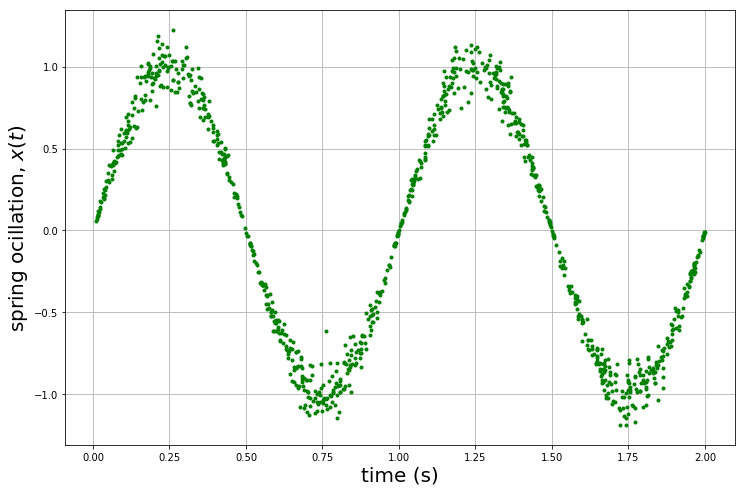

In [1]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline

# 2-1,2-2) Data generation

T = np.random.uniform(0,2,1000)
# T.sort()

# model
a = 1.
b = 0.
X = a*np.sin(2*np.pi*T) + b
# noise 
dX = (X/10) * np.random.randn(len(X))
# experimental value = model + noise
X_exp = X  + dX


# 2-3) Plotting

## plot objects (figure & axes)
fig1 = plt.figure(figsize=(12,8))
ax1 = fig1.add_subplot(111)

ax1.plot(T, X_exp, 'g.')
ax1.set_xlabel('time (s)', fontsize=20)
ax1.set_ylabel('spring ocillation, $x(t)$', fontsize=20)
ax1.grid(True)

plt.show()